# Классификация изображений по эмоциям 

# <b>Введение</b>

Под распознаванием лиц может пониматься одна из двух задач: 

*   верификация — сравнение двух фотографий для определения, что на них один и тот же человек или нет;
*   идентификация — поиск человека в существующей базе или картотеке фотографий.

Объединяет эти задачи то, что их может выполнять одна и та же нейросеть.

Верификация происходит по следующему алгоритму. Когда пользователю надо куда-то зайти по фотографии лица, это может быть банковское приложение с биометрией, то происходит следующее:

 

*   приложение фотографирует пользователя и автоматически извлекает из изображения эмбеддинг — определённый вектор чисел;
*  в базе банка берётся фотография человека из прошлого;
*  два изображения автоматически сверяются;
*  если евклидово расстояние между двумя эмбеддингами меньше определённого показателя, то нейросеть делает вывод, что на фотографиях один и тот же человек, и подтверждает операцию.

Идентификация — это поиск человека по лицу. В некой базе данных или фотогалерее накапливается массив фотографий людей, как это происходит с теми же фотографиями с камер в Москве. В качестве запроса берётся новая фотография человека, точнее, эмбеддинг из неё, и сравнивается с предыдущими изображениями в базе. Если мы ищем на улице человека, подозреваемого в краже товара из магазина, или хотим выявить нарушителя среди болельщиков на футбольном матче, то фотографируем каждого посетителя на входе. И если находится достаточно близкий эмбеддинг в базе, то можно отказать человеку, который запечатлён на фото, во входе на матч или задержать его. Если эмбеддинг недостаточно близкий, значит, человека нет в базе, и органы правопорядка он не интересует.

Распознавание лиц может использоваться везде, где есть камеры: на улице, в помещении, на стадионах, в метро и общественном наземном транспорте, в аэропортах, на вокзалах, в магазинах, банках и других общественных местах. Соответствующие программы и алгоритмы можно устанавливать на стационарные компьютеры и на мобильные устройства, также они используются в системе «Умный город», в некоторых домофонах, в приложениях, банковских или других. 

Распознавание лиц используется:

*  для безопасности: поиск преступников, подозреваемых и нарушителей общественного порядка, невозможность взлома банковских паролей; 

*  для поиска пропавших без вести; 

*  для рекламы: распознавание клиента на входе с персональными предложениями, проверка эмоциональных реакций на товар или услугу, повышение качества сервиса;

*  в розничной торговле: бесконтактная оплата лицом на кассе, товарные предложения и скидки с учётом истории покупок, сокращение очередей.

**В основе системы распознавания лиц лежит обученный пайплайн** — последовательность взаимосвязанных между собой программ. В нём выделяется несколько составляющих:

1.  Детектор лиц. Обучается независимо от остальных частей пайплайна. Для обучения и тестирования детектора лиц необходим датасет, в котором есть размеченные прямоугольники лиц — bounding boxes — и, желательно, размеченные ключевые точки лица: глаза, нос, уголки рта. Если под рукой нет своего датасета, можно использовать публичный датасет WIDER face, в котором более 300 тысяч размеченных лиц.

Обычно никто не придумывает архитектуру детектора, и просто берут публичные, например, MTCNN, Retina Face, SCRFD, Yolov5Face. В зависимости от кейса применения детектор могут дополнительно дообучать на своих данных и ускорять.

2.  Выравниватель. Эта часть пайплайна наименее важная, и обычно её нет нужды обучать. Сначала детектор лица предсказывает прямоугольник и ключевые точки лица, обычно пять точек. Затем выравниватель с помощью аффинного преобразования поворачивает и сдвигает ключевые точки, а вместе с ними и лицо, до эталонного положения.

3.  Эмбеддер — распознаватель, извлекатель эмбеддингов и дескрипторов. Это самая важная часть программы: обученная модель больше всего весит и дольше всего работает по времени. Для него нужны три составляющие:

*  Хорошая архитектура нейросети. Архитектуру обычно берут из лидеров на Imagenet — одном из самых важных бенчмарков в компьютерном зрении, или ансамбль из нескольких архитектур в связке с дистиляцией знаний (knowledge distillation). 

*  Объёмный датасет. Датасет обычно состоит из сотен тысяч фото реальных людей в разном ракурсе, разных возрастов, полов и рас. Датасет может быть опенсорны. Сейчас такие почти не найти, но перечислим популярные в прошлом MSCeleb1M, VGG2, UMD faces, MegaFace. Датасет можно собрать самостоятельно, купить у специализированных компаний или получить от клиентов.

*  Хорошая функция потерь (loss function). Функция потерь — обычно ArcFace или её улучшения. Обучение модели происходит как задача классификации

От обученной модели отрезают последний полносвязный слой, и получают эмбеддер.

4.  Трекер. Нужен для отслеживания траекторий людей и используется не в каждой системе. Мобильное приложение банка может работать без трекера, в то время как для распознавания лиц по уличным камерам он необходим, так как дополнительно позволяет не запускать детектор лица на каждом кадре, а в магазине может использоваться для определения наиболее популярных полок. Популярные трекеры базируются на фильтре Калмана и Венгерском алгоритме.

При распознавании лиц на видео обычно эмбединги извлекаются с каждого кадра по отдельности, и потом усредняются в один агрегированный эмбединг. Для того чтобы кадры с плохо видимым лицом давали меньший вклад, часто обучают небольшую нейросеть, которая присваивает веса каждому кадру: чем лучше видно лицо, тем выше вес.

**Слабые места современного распознавания лиц**:

Во-первых, существующим системам свойственна расовая предвзятость — racial bias: людей европеоидной расы они распознают лучше, чем представителей других рас. Это не проблема алгоритмов, а только проблема существующих датасетов, на которых обучали и тестировали большинство подобных программ. Тем не менее этот недостаток зачастую приводит к дискриминации по расовому и национальному признаку: системы, используемые в юриспруденции и криминалистике пока что выделяют темнокожих людей как более вероятных преступников.

Во-вторых, за последние годы люди неоднократно придумывали способы обхода распознавания лиц, осуществляя так называемые состязательные атаки — adversarial attacks. В 2017 году сотрудник Яндекса Григорий Бакунов придумал макияж, обманывавший алгоритмы искусственного интеллекта, и рассказал о нём в СМИ. 

В 2019 году сотрудники компании Huawei Moscow предложили свой способ, так сказать, шапку-невидимку. Для этого на обычном цветном принтере распечатывали прямоугольные бумажные наклейки, которые приклеивались человеку на головной убор. Это позволило сильно ухудшить качество распознавания лиц, в основе которого был ArcFace.

В долгосрочной перспективе эти алгоритмы не работают, их легко обойти, и потому систему распознавания лиц «сломать» сложно. Но усложнить работу искусственного интеллекта с помощью тёмных очков, макияжа, волос, маски для лица всё же реально.

Ещё один подводный камень — так называемое определение живого присутствия — liveness detection, когда пользователь хочет войти в систему за кого-то другого. То есть, человек хочет, чтобы его распознали, но определили неправильно. Для этого используются фото, распечатанные на принтере, фото людей на экране гаджетов, реже — силиконовые маски с изображением людей. Чтобы отличить статичное изображение в кадре от живого присутствия человека, необходимо разрабатывать отдельный liveness-детектор.


**Плюсы и минусы применения систем распознавания лиц**

Возможность отследить человека по лицу значительно облегчает поиск преступников, пропавших без вести и похищенных людей, позволяет входить по лицу куда угодно: в офисы, учебные заведения, общественный транспорт, аэропорты, вокзалы, на мероприятия, оплачивать товары и услуги, не трогая лишних предметов руками и снижая риск передачи инфекций, пользоваться мобильными приложениями без пароля или отпечатка пальца. Без технологий распознавания лиц такая задача, как поиск людей в толпе, не представлялась бы возможной. 

Но есть и обратная сторона: именно системы распознавания лиц неоднократно сыграли решающую роль при поиске и задержании участников акций протеста в Москве и Гонконге, а также во время карантинных мер из-за пандемии коронавируса. И что для одних людей станет удобным и облегчающим жизнь нововведением, для других может обернуться возможностью слежки и необоснованного контроля. Юристы и правозащитники не раз предупреждали о возможности возникновения такой опасности и сопутствующих нарушений прав человека — отрицательный пример Китая известен многим.

Эксперты уверены, что в ближайшие годы технология распознавания лиц станет массовой во всём мире, что чревато утратой приватности в повседневной жизни. Технологии будут совершенствоваться, но для их этичного и разумного применения нужна взвешенная законодательная база для защиты данных и неприкосновенности частной жизни.

##**Цели и задачи дипломного проекта**

***Целью данной работы*** является разработка системы распознавания и тренировки эмоций, основанной на нейросетевых технологиях.В контексте данной работы рассматриваются следующие 6 эмоций (базовые эмоции): гнев,удивление, печаль, радость, страх и отвращение.

Для осуществления поставленной цели необходимо решить следующие ***задачи***:
* Провести теоретический анализ исследуемой области. 
* Сформировать обучающую выборку для тренировки нейронной сети.
* Осуществить предобработку обучающей выборки.
* Выбрать архитектуру нейронной сети,обучить ее и применить полученную модель для распознавания эмоций на изображении.
* Выбрать метод детектирования лиц на изображениии применить его
* Разработать интерфейс программы.
* Протестировать полученную программу


В общем виде аффективное состояние (эмоцию) можно описать двумя терминами: валентность (valence) и возбуждение (arousal)[1]. Валентность означает положительную или отрицательную аффективность. Возбуждение измеряет насколько спокойным или волнующим является аффективное состояние. Например, реакции организма при просмотре фильма ужасов можно охарактеризовать как эмоцию высокого возбуждения. С другой стороны, валентность позволяет определить эмоциональные события как положительные или отрицательные.

Аффективное состояние S, таким образом, описывается парой (v^S, a^S) в валентном пространстве возбуждения, показанном на рисунке 1, где v^S, a^S ∈ [1, 9] являются и валентными и уровнями возбуждения.




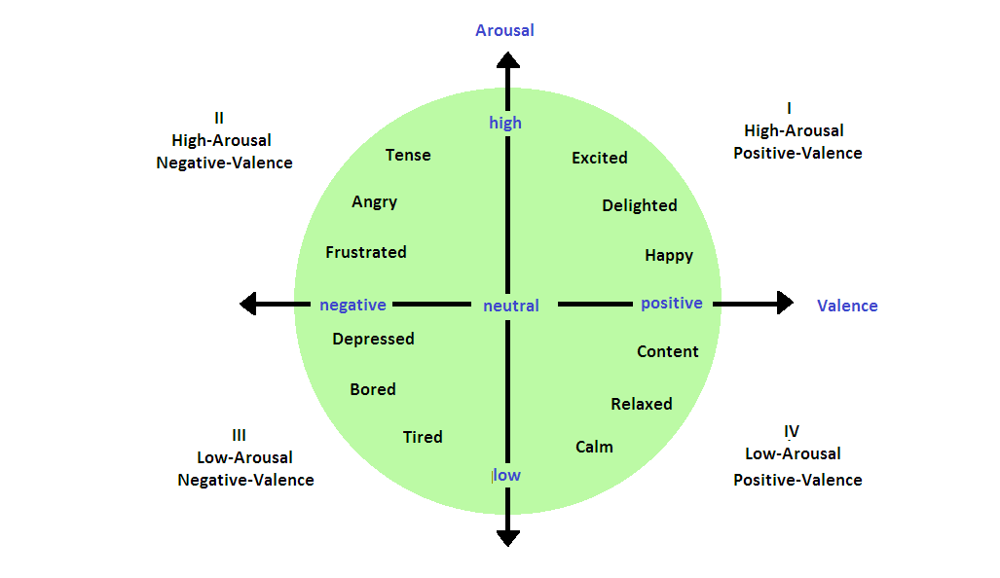

Рисунок 1 - Двумерное пространство возбуждения и валентности

Figure 1 - Two-dimensional valence-arousal space

Эмоции можно выразить через классы, характеризующиеся соответствующими значениями валентности и возбуждения, как показано на Рис. 1.

Задачи, связанные с распознаванием лицевых экспрессий человека, давно являлись предметом исследований психологов и ученых. Так Чарльзом Дарви-ном была опубликована работа «О выражении эмоций у человека и животных». Он первым высказал гипотезу об универсальности мимических проявлений эмоций, причем не только для различных культур, но и для различных видов. Данная теория была проверена и продолжена психологом Полом Экманом. В ходе наблюдения за лицевыми экспрессиями жителей одного из племен в Новой Гвинее, ни разу не имевшими долговременного контакта с представителями западной или восточной культуры, ученый заметил, что некоторые эмоций вы-ражалисьтаким же образом, что и во всем мире. Пол Экман установил, что такие эмоции как: гнев,удивление, печаль,радость, страх и отвращение являются универсальными и могут быть поняты человеком, независимо от его культуры.

##**Актуальность проекта**

Задача автоматического распознавания эмоций по мимике является актуальной в наши дни, поскольку имеет большое количество применений в различных сферах человеческой деятельности. Так, детекция эмоциональных реакций может использоваться в маркетинге. Система, автоматически определяя эмоциональный отклик человека на демонстрируемый ему контент, показывает степень его заинтересованности в том или ином товаре или услуге. 

Автоматическое распознавание эмоций может применяться правоохранительными органами и охранными службами. С их помощью следователи могут определять истинность показаний подозреваемого при допросе. Кроме того, системы могут помочь обнаружить людей, 
демонстрирующих эмоциональные реакции,характерные для психически нездоровых лиц, нарушителей правопорядка и т. д.

Системы распознавания эмоций могут повысить безопасность на дорогах. Оснащение автомобилей подобными средствами в ряде случаев может позволить избежать аварий,связанных с плохим самочувствием или сонливостью водителей.Кроме всего прочего, программы для определения эмоционального состояния могут повысить степень эффективностивзаимодействия человека и компьютера,обеспечить правильную реакцию на состояние пользователя.

#<b>1.1 Классификация методов распознавания

Далее под распознаванием лиц будем понимать этапы, идущие после выделения лица и его нормализации, а именно извлечение признаков и сравнение с эталоном. Приведем основные известные методы, которые применяются для решения этих двух задач.

Методы извлечения признаков можно разделить на две группы. Это методы, использующие локальные признаки и глобальные признаки лица. При использовании локальных признаков, алгоритм выделяет отдельные части лица (такие как глаза, нос, рот и др.) и уже по ним выделяет или распознает лицо. При использовании же глобальных признаков, алгоритм оперирует со всем лицом в целом.

К методам, работающим с локальными признаками, относятся:

*  фильтры Габора;

*  метод сравнения эластичных графов;

*  контурные модели лица;

*  метод наиболее информативных областей;

*  скрытые марковские модели;

*  морфинговые модели;

*  моменты;

*  методы, основанные на геометрических характеристиках лица;

*  методы, основанные на сравнении эталонов;

*  нейронные сети.

Методами, использующими глобальные признаки, являются:

*  дискриминантные методы;

*  моменты;

*  фильтры Габора;

*  нейронные сети.

Как видно, одни и те же методы могут использоваться как для выделения локальных признаков лица, так и для выделения глобальных признаков:

*  фильтры Габора;

*  моменты;

*  нейронные сети.

Все классификаторы можно разбить на следующие группы:

*  статистические методы, строящиеся на базе принципов математической статистики;

*  методы, основанные на построении разделяющих гиперповерхностей;

*  методы, основанные на принципе потенциалов;

*  методы, основанные на определении экземпляров;

*  методы, разработанные на основании изучения биологических нейронных сетей.

Количество существующих методов выделения признаков и их классификации безгранично. Далее рассмотрим лишь наиболее известные из них методы.

## 1.1.1  Методы, основывающиеся на анализе локальных признаков

Все методы данной группы, так или иначе, локализуют характерные участки лица и уже на основании них реализуют свой алгоритм.

### **Контурные (эластичные) модели лица (Flexible Appearance Models)**

Некоторые методы решения задачи распознавания лиц используют понятия «эластичных моделей лица» (Flexible model), которые в свою очередь являются объектами, реконструированными на основе главных компонент. В данных методах распознавание производится на основе сравнения контуров лица. Контуры обычно извлекаются для линий головы, ушей, губ, носа, бровей и глаз. Контуры представлены ключевыми позициями, между которыми положение точек, принадлежащих контуру, вычисляются интерполированием. Для локализации контуров в различных методах используется как априорная информация, так и информация, полученная в результате анализа тренировочного набора.

Ключевые точки, соответствующие контурам, размещались вручную на наборе тренировочных изображений. Эти наборы точек – первоначальные признаки – представляют собой исходные модели формы лица (МФЛ). Далее эти признаки редуцируются по методу главных компонент и на их основе формируется усредненная МФЛ. При этом создается возможность изменения формы модели лица и, соответственно, создания эластичной модели формы лица (ЭМФЛ) за счет изменения параметров в пространстве редуцированных признаков. В процессе распознавания ЭМФЛ как бы «натягивается» на распознаваемый образ лица, а полученные при этом новые параметры формы модели являются ключом для классификации распознаваемого образа.

Для поиска контуров на лице предлагается использовать алгоритм Active Shape Models. Главной задачей при распознавании по контурам является правильное выделение этих контуров. В общем виде эта задача по сложности сравнима непосредственно с распознаванием изображений. Кроме того, использование этого метода самого по себе для задачи распознавания недостаточно.



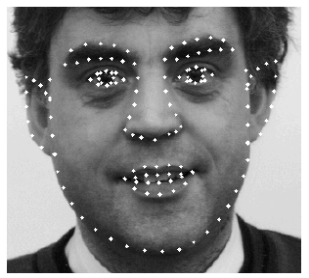

Рисунок - Расположение точек на лице из обучающей выборки

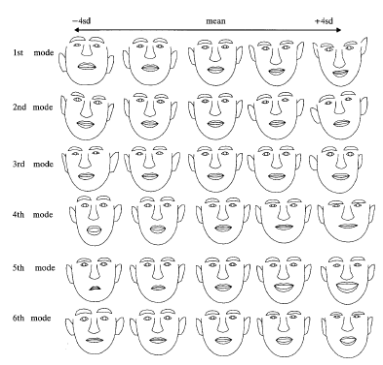

Рисунок - Влияние главных компонент на форму лица

**Сравнение эластичных графов.**  

В этой группе методов (Elastic Bunch Graph Matching) лицо представляется в виде графа, вершины которого расположены на ключевых точках лица (узлах), таких как контуры головы, губ, носы и их крайних точках. Каждая грань помечена расстояниями между её вершинами.

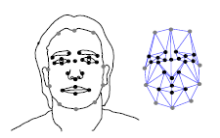

Рисунок - Представление лица в форме графа. Серые точки – контур лица, черные точки – части лица

Каждый узел характеризуется набором признаков которые извлекаются в особых точках лица. В качестве признаков, как правило используются фильтры Габора для различных частот и ориентаций. Также каждый узел характеризуется Евклидовым расстоянием до других узлов. Система состоит из блока выделения лица, блока выделения характерных точек лица, и блока идентификации лица.

**Блок выделения лица** осуществляет нахождение области на изображении, в которой скорее всего расположено лицо. Для этого генерируется усредненный граф по всей обучающей выборке. Параметрами данного графа являются расстояния между его вершинами и усредненные значения признаков в каждой вершине. Затем входное изображение сканируется данным графом и в точках изображения, куда накладывается граф, вычисляются признаки. В качестве наиболее вероятной позиции лица выбирается та, у которой наименьшее суммарное различие в признаках с усредненным графом.

**Блок выделения наиболее характерных точек лица** сначала определяет наиболее подходящий масштаб графа, соответствующий лицу на изображении, а затем подстраивает вершины графа, так чтобы они соответствовали реальным частям лица, за которые эти вершины отвечают (гибкое сравнение признаков). Чтобы определить масштаб графа, производится следующая процедура:

1. Определяется словарь масштабов – мера отличия усредненного графа от графов-кандидатов, соответствующих распознаваемым изображениям с различными масштабами. Для этого вычисляются значения отклика:

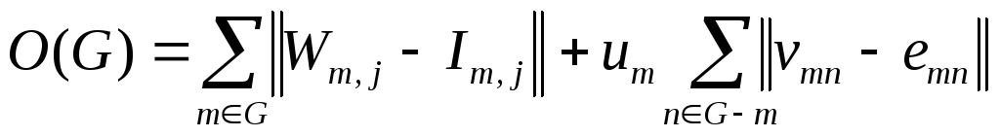

где **w** m,j - признак усредненного графа в узле **m**,

**I**mj- признак графа-кандидата,

**v** m,j- расстояние между узлами m и n на усредненному графе,

**e**mn- то же расстояние для графа-кандидата.

2. Последовательно меняется масштаб усредненного графа и эти графы накладываются на выделенную ранее область входного изображения. В результате получается граф Gref. Здесь же для каждого из изображений из базы (и соответствующих им графов G) вычисляется масштаб, соответствующий наименьшему отклонению этих изображений от :

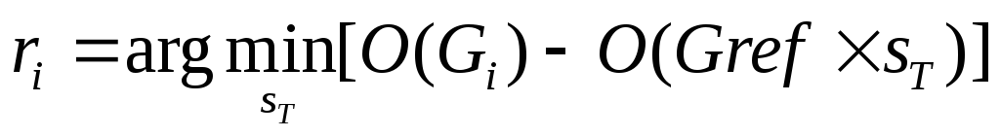

Далее для r строится плотность распределения вероятностей и находится ее максимум t, который и принимается за наиболее соответствующий масштаб.

После определения масштаба усредненного графа начинается процедура гибкого сравнения признаков. По окончании процедуры преобразования масштаба получаются грубые позиции характерных точек лица, которые используются как начальная информация для поиска точных позиций. Вычисляется начальный отклик

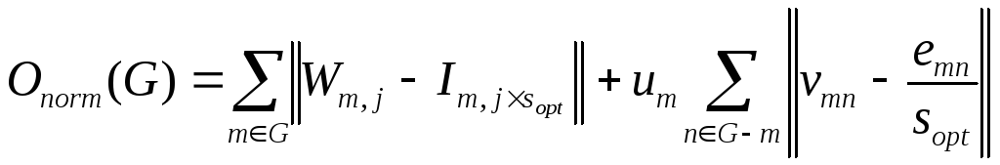

Признаки Габора и Евклидово расстояние в уравнении нормализуются на  для масштаба лица. Затем генерируется новый граф путем изменения положения вершин и снова вычисляется отклик сети. Если он меньше начального отклика, то граф кандидат становится новым графом гипотез. Процедура гибкого сравнения признаков повторяется с использованием случайного диффузионного процесса. Значение u в уравнении монотонно убывает в ходе процесса сравнения и определяется как
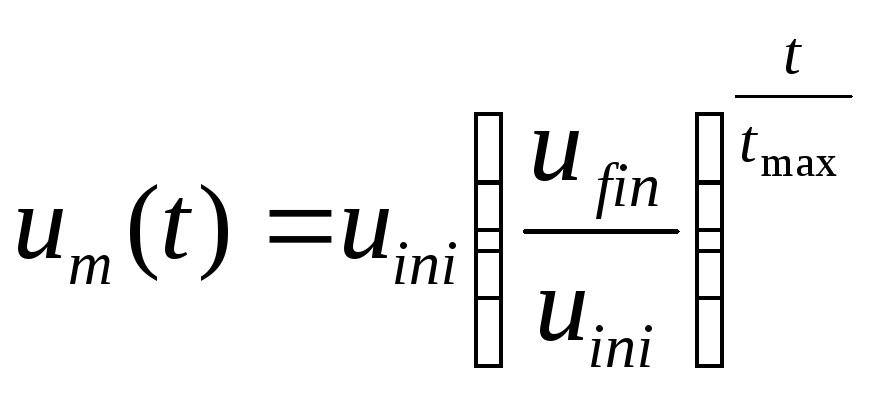

Здесь u - изменение положения вершины на начальном этапе процесса сравнения;  то же самое на конечном этапе; t - текущий номер шага; t - общее число шагов. Метод сравнения может эффективно извлекать характерные точки лица человека не зарегистрированного в базе шаблонов, потому что усредненный шаблонный граф используется как эталонный граф. Кроме того, этот метод прекрасно работает на изображениях лиц измененных аксессуарами для лица, так как он использует пространственные взаимосвязи.

Идентификация лица осуществляется путем сравнения полученного на предыдущем шаге графа гипотез с каждым шаблонным графом из базы. Вычисляется отклик Onorm. В качестве w и v берутся соответственно признаки и расстояния между вершинами у шаблонных графов. Шаблон с минимальным откликом сети считается принадлежащим человеку, соответствующему входному лицу. Если отклик сети меньше определенного порога, то система принимает эту идентификацию.

К преимуществам данного метода можно отнести: инвариантность к масштабу, освещению, частичному заслонению, фону. К недостаткам - низкая инвариантность к выражению лица и положению головы в пространстве.

### **Методы, основанные на геометрических характеристиках лица**


Один из самых первых методов – это анализ геометрических характеристик лица. Изначально применялся в криминалистике и был там детально разработан. Потом появились компьютерные реализации этого метода. Суть его заключается в выделении набора ключевых точек (или областей) лица и последующем выделении набора признаков. Каждый признак является либо расстоянием между ключевыми точками, либо отношением таких расстояний. В отличие от метода сравнения эластичных графов, здесь расстояния выбираются не как дуги графов. Наборы наиболее информативных признаков выделяются экспериментально.

Ключевыми точками могут быть уголки глаз, губ, кончик носа, центр глаза и т.п. (рис.). В качестве ключевых областей могут быть прямоугольные области, включающие в себя: глаза, нос, рот.

В процессе распознавания сравниваются признаки неизвестного лица, с признаками, хранящимися в базе.

Задача нахождения ключевых точек приближается к трудоёмкости непосредственно распознавания, и правильное нахождение ключевых точек на изображении во многом определяет успех распознавания.

Поэтому изображение лица человека должно быть без помех, мешающих процессу поиска ключевых точек. К таким помехам относят очки, бороды, украшения, элементы причёски и макияжа. Освещение желательно равномерное и одинаковое для всех изображений.

Кроме того, изображение лица должно иметь фронтальный ракурс, возможно с небольшими отклонениями. Выражение лица должно быть нейтральным. Это связано с тем, что в большинстве методов нет модели учёта таких изменений.

Таким образом, данный метод предъявляет строгие требования к условиям съёмки, нуждается в надёжном механизме нахождения ключевых точек для общего случая. Кроме того, требуется применение более совершенных методов классификации или построения модели изменений.

В общем случае этот метод не самый оптимальный, однако для некоторых специфических задач перспективен. К таким задачам можно отнести документный контроль, когда требуется сравнить изображение лица, полученного в текущий момент с фотографией в документе. При этом других изображений этого человека не имеется, и следовательно механизмы классификации, основанные на анализе тренировочного набора, недоступны.

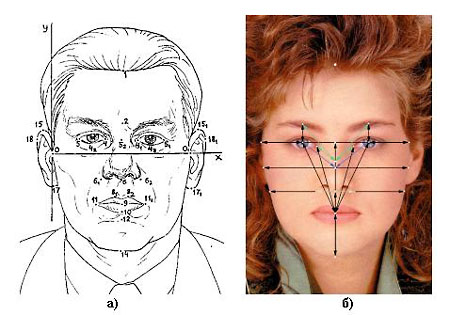

Рисунок - Идентификационные точки и расстояния: а) используемые при криминалистической фотоэкспертизе; б) наиболее часто применяемые при построении автоматизированных систем идентификации.

Недостаток этого метода заключается в том, что он требует много ресурсов как для хранения участков, так и для их сравнения. В виду того, что используется простейший алгоритм сравнения, изображения должны быть сняты в строго установленных условиях: не допускается заметных изменений ракурса, освещения, эмоционального выражения и пр

### **Метод наиболее информативных областей (нио)**


В методе реализован подход к автоматическому определению информативных областей изображения, используемых для вычисления признаков. Эти информативные области называются «местонахождениями признаков». По обучающим наборам сохраняются позиции и признаки лиц с соответствующими метками классов.

Чтобы выборка состояла из одиночных местоположений признаков с высоким информационным содержанием, необходимо добавить только те вектора признаков, которые добавляют информацию в выборку (и не «перенаселяют пространство признаков»).

При сравнении решение принимается либо по одному наиболее совпадающему признаку, либо по числу признаков, которые больше совпадают.

Как вариант нахождения признаков – одновременная фильтрация Габора + двумерный гауссиан (для избежания извлечения признаков за контурами лица) и поиск максимумов – признаков, интересных для распознавания лица.

Что касается плюсов метода НИО, то это инвариантность к масштабу и освещению (но это за счет использования фильтров Габора), инвариантность к мимике лица и положению головы в пространстве. Основным недостатком является полное отсутствие инвариантности к частичному заслонению и слабая инвариантность к фону.

Скрытые марковские модели
Марковские модели являются мощным средством моделирования различных процессов и распознавания образов. По своей природе Марковские модели позволяют учитывать непосредственно пространственно-временные характеристики сигналов, и поэтому получили широкое применение в распознавании речи, а в последнее время – изображений (в частности изображений лиц).

Идея использования скрытых марковских моделей (Hidden Markov Model, HMM) для распознавания лиц основана на представлении лица как последовательность чередующихся частей – волос, лба, глаз, носа, рта и др.

Для распознавания лиц используются одномерные (1D-HMM), псевдо-двумерные (P2D-HMM) и упрощенные двумерные (LC 2D-HMM) скрытые марковские модели. Во всех моделях все изображения лиц разбиваются на связанные друг с другом, но различающиеся области (как правило, прямоугольной формы). Каждая из таких областей ассоциируется со скрытым состоянием HMM. В качестве наблюдаемого состояния HMM используется окно наблюдения (сканирования) фиксированного размера. Данное окно последовательно пробегает все участки лица с заданным шагом перекрытия. Из-за чувствительности окна V к слабым изменениям исходного изображения используются различные преобразования V – например, двумерное дискретное косинус преобразование (2D-DCT). Как правило при распознавании лиц используются HMM с непрерывной плотностью наблюдений, у которых вектор наблюдений формируется как взвешенная сумма гауссианов.

Обучение. Перед обучением необходимо задать начальные параметры HMM. Для этого изображение разбивается на части, соответствующие скрытым состояниям. В этих частях рассчитываются средние значения векторов наблюдения и настраиваются соответствующие значения матрицы вероятностей наблюдений B для каждого состояния. При обучении изображение последовательно сканируется окном наблюдения в соответствии со структурой HMM и на основании наблюдаемых данных настраиваются параметры A и B (алгоритм Баума-Уэлша). В результате обучения для каждого из лиц формируется собственная HMM .

Распознавание. При распознавании неизвестное лицо подается на вход скрытой марковской модели каждого из лиц и вычисляются вероятности того, что HMM соответствует данному лицу (алгоритм прямого хода). В качестве ответа выбирается HMM, у которой наибольшая вероятность соответствия данному лицу (в случае если эта вероятность больше порога неопределенности).

Сегментация. В случае если лицо было распознано путём соотнесения с ним какой-либо HMM, может быть произведена сегментация данного лица (по алгоритму Виттерби). То есть для каждого из возможных положений окна наблюдения будут определены наиболее вероятные состояния.

Особенности и различия моделей

В случае одномерных моделей лицо последовательно просматривается (сканируется) сверху вниз (чаще всего) или слева направо (реже) окном наблюдения фиксированного размера. Состояния модели соответствуют разбиению изображения на части, представляющие собой наборы строк. В одном из наиболее часто используемых примеров лицо разбивается горизонтальными линиями на части, соответствующие 5 частям лица.

Пусть изображения имеет размеры Y по вертикали и X по горизонтали. Пусть размер окна L по вертикали и H по горизонтали. Это окно будет пробегать изображение сверху вниз, накрывая предыдущее окно на M пикселей. Тогда число блоков. На которое разбивается изображение, равно

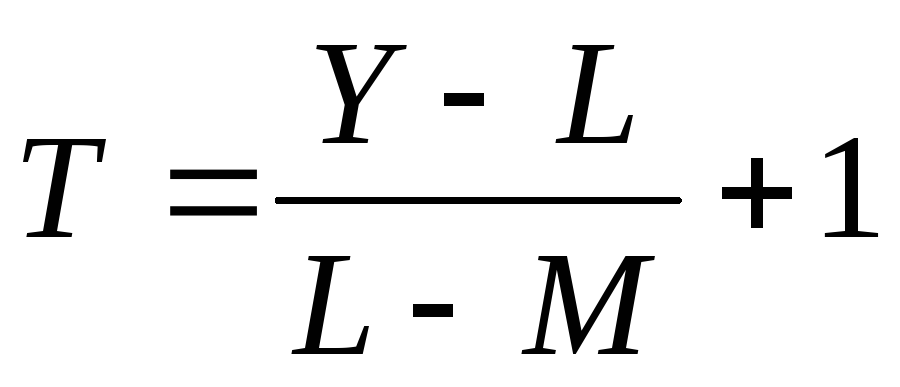

Выбор параметров M и L достаточно важен. Большое значение M улучшает качества распознавания. Но выбор L требует осторожности. При большом значении L возможен захват изображений из разных состояний, при малых значениях, возможно, что окно будет содержать слишком мало информации.


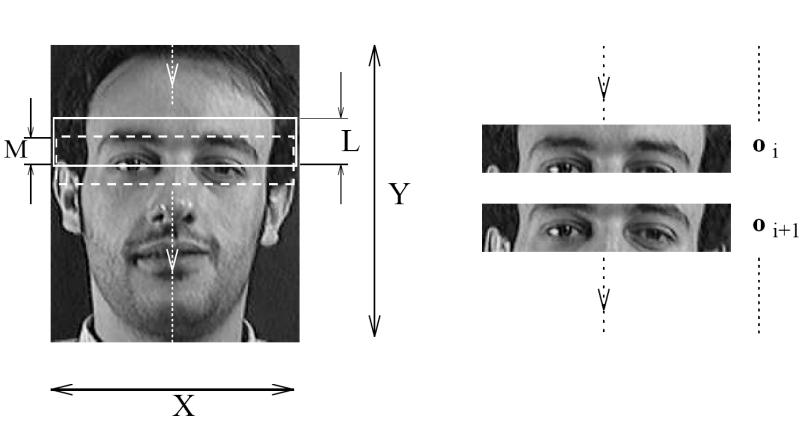

Рисунок-  (а) Пояснение к окну наблюдения для 1D-HMM (б) Порядок сканирования изображения

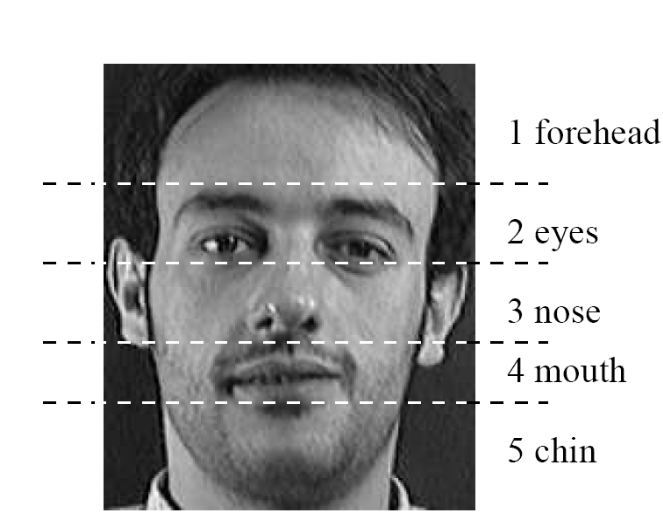

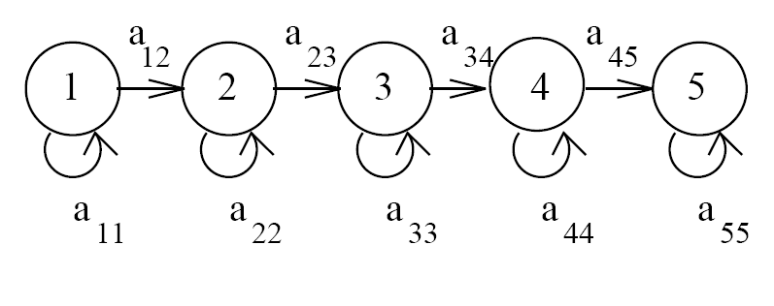




Рисунок -  (а) Пример разбиения изображения на части, представляющие собой скрытые состояния HMM (б) Соответствующий граф состояний

В общем случае при использовании 1D-HMM используется набор HMM :
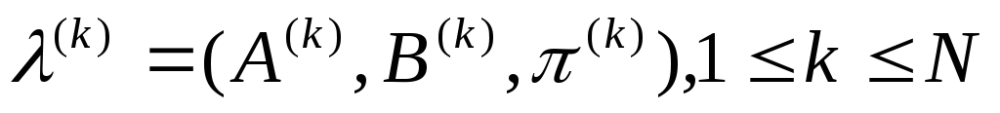

где N – общее число различных объектов, которые требуется распознать. Параметры модели можно охарактеризовать следующим образом:

А - вероятностная мера перехода от одного участка лица к другому. После обучения  хранит в себе частоты переходов от одного участка к другому и толщину соответствующих участков.

В - вероятностная мера наблюдаемого вектора признаков при нахождении в состоянии k. После обучения В содержит в себе векторное распределение наблюдаемого вектора признаков на различных участках лица.

п - начальное распределение вероятностей. Поскольку лицо просматривается сверху вниз, то вероятность первого состояния – п1=1, а вероятность остальных состояний – п1=0, М – число участков лица.

**Псевдо-двумерная Марковская модель** состоит из линейной модели с суперсостояниями (разрещены переходы только между соседними состояниями). При этом суперсостояния представляют собой одномерные HMM. Каждое суперсостояние соответствует разбиению изображения на строки (столбцы), а последовательные переходы по состояниям внутри суперсостояния – проходу справа налево (сверху вниз) по заданной строке (столбцу). Переход в новое суперсостояние возможен только тогда, когда система находится в финальном состоянии модели из предыдущего суперсостояния. Окно наблюдения выбирается так, чтобы не выйти за границы суперсостояния. По аналогии с одномерной HMM сканирование производится с определенным коэффициентом перекрытия. Сегментация с использование P2D-HMM можно считать двумерной (рис.)

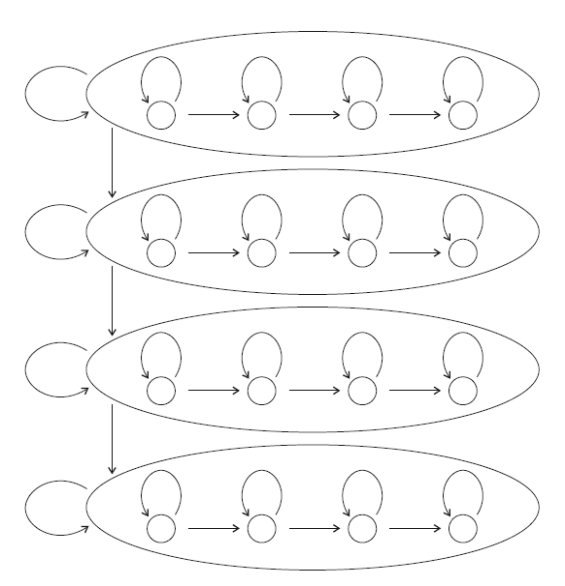

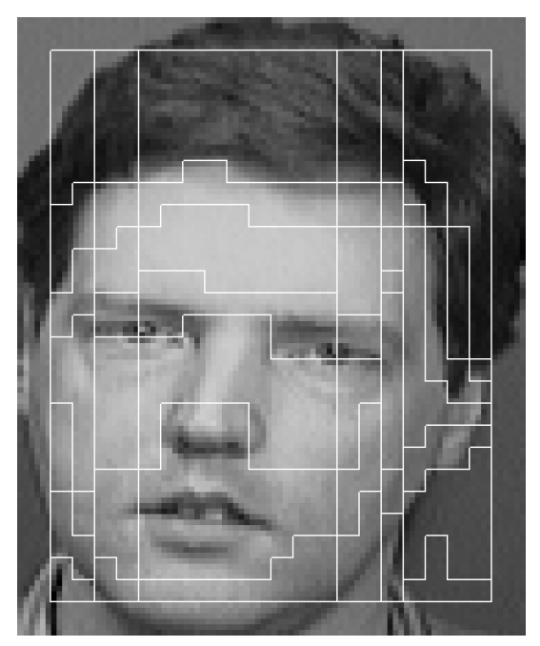

Рисунок -  (а) Граф состояний для псевдо-двумерной Марковской модели (б) Пример решения задачи сегментации лица

Упрощенная двумерная марковская модель соответствует разбиению изображения на прямоугольники (состояния HMM). При этом разрешены вертикальные и горизонтальные переходы между состояниями, но запрещены диагональные переходы, что существенно упрощает модель. Соответствующим образом осуществляется и сканирование изображения.

Для HMM важное значение имеет начальная инициализация модели. В качестве начальной инициализации всех моделей использовались могут быть использованы все изображения из тренировочного набора. Полезное свойство распознавания по коэффициентам дискретного косинусного преобразования заключается в том, что оно позволяет работать непосредственно со сжатыми изображениями, такими как JPEG и MPEG, в которые на сегодняшний день являются распространёнными форматами хранения изображений и видео.

Недостатком HMM является то, что они не обладает различающей способностью. Т.е. алгоритм обучения только максимизирует отклик каждой модели на свои классы, но не минимизирует отклик на другие классы, и не выделяются ключевые признаки, отличающие один класс от другого. Таким образом, похожие классы могут оказаться слабо различимыми, в результате чего при увеличении объёма базы или использования в более широких условиях HMM могут оказаться ненадёжными.

### Морфинговые модели


Стандартные морфинговые модели являются методом, основанным на анализе изображения для представления и сравнения классов объектов (таких как лица). Для каждого их объектов, подлежащего распознаванию строится так называемая морфинговая модель, позволяющая сравнить новое изображение из этого класса объектов.

Получившиеся параметры модели можно использовать для множества задач анализа изображений таких как верификация объектов, распознавание лиц и анализ выражений лиц. Одной из проблем, связанных с морфинговыми моделями, является количество примеров изображений необходимых для описания класса объектов.

Существуют иерархические морфинговые модели, в которых модель строится не для всего лица, а для каких-то частей (носа, глаз, рта). Лица могут моделироваться с помощью форм и текстур, в виде 3D-модели головы, в форме 3-мерной решетки и др.

При задании морфинговой модели для класса объектов, она «обучается» на множестве прототипных изображений (под прототипом понимается изображение лица из обучающей выборки).

Плюсами иерархической морфинговой модели являются инвариантность к фону, освещению, положению головы в пространстве, мимике лица, частичному заслоению. Недостатки - отсутствие инвариантности к масштабу.

#3.4 Методы, основывающиеся на анализе глобальных признаков Дискриминантные методы


На текущий момент разработано множество разных дискриминантных методов.

Предположим, есть N человек, и обучающая выборка содержит их фотографии размера . Требуется классифицировать не присутствующую в обучающей выборке фотографию человека, т.е. определить который из N человек изображен на этой фотографии.

Каждая фотография является точкой в пространстве размерности . У каждого человека в обучающей выборке есть несколько фотографий, представляющих собой несколько точек в этом многомерном пространстве и образующих некоторую область. Суть всех дискриминантных методов заключается в том, чтобы построить некое разбиение этого многомерного пространства, разделив области принадлежащие разным людям. Это позволит определить, к какому из N классов образов принадлежит новая фотография, т.е. который из N человек изображен на ней.

К положительным свойствам дискриминантных методов можно отнести инвариантность к выражению лица, положению головы в пространстве и иногда к освещению. Однако, они не обладают инвариантностью к масштабу, к частичным заслонениям лица, к фону.

Наиболее известные дискриминантные следующие:

*  линейный дискриминантный анализ (ЛДА)

*  метод главных компонент

*  общие дискриминантные вектора (ОВД);

*  дискриминантный факторный анализ (ДФА);

*  независимый факторный анализ (НФА);

*  топографический независимый факторный анализ (ТНФА).

#Линейный дискриминантный анализ

Синонимы: Linear Discriminate Analysis (LDA), линейный дискриминант Фишера, лица Фишера (Fisher Faces)

В линейном дискриминантном анализе осуществляется линейное преобразование, отражающее исходное n-мерное пространство изображений в m-мерное пространство признаков, где m<n. Вектор признаков определяется линейным преобразованием W

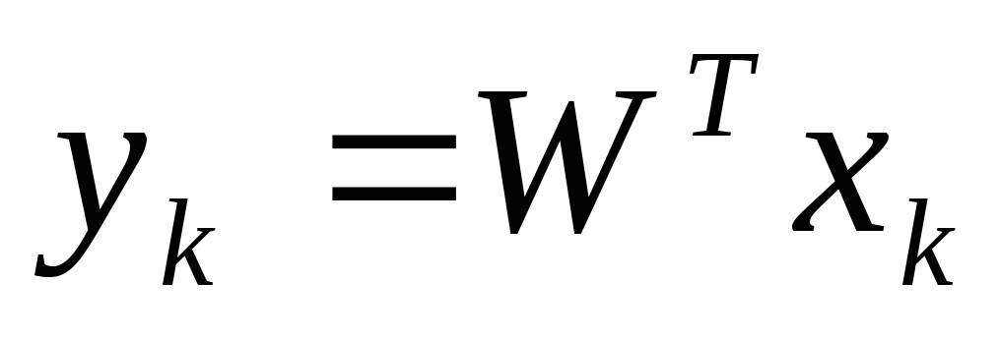

которое выбирается так чтобы максимизировать отношение определителя межклассовой матрицы разброса к определителю внутриклассовой матрицы разброса отображаемых примеров.

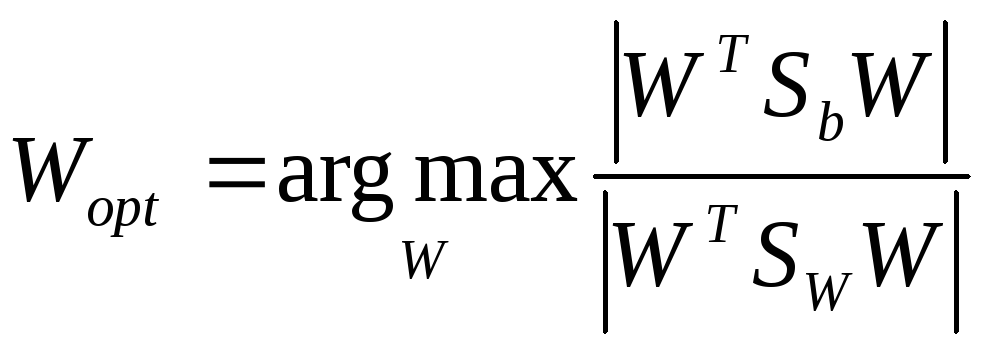

То есть осуществляется попытка выбрать такие признаки, чтобы для образов одного класса они были как можно более похожи, а для образов разных классов наоборот сильнее отличались. В итоге задача сводится к задаче нахождения собственных значений:

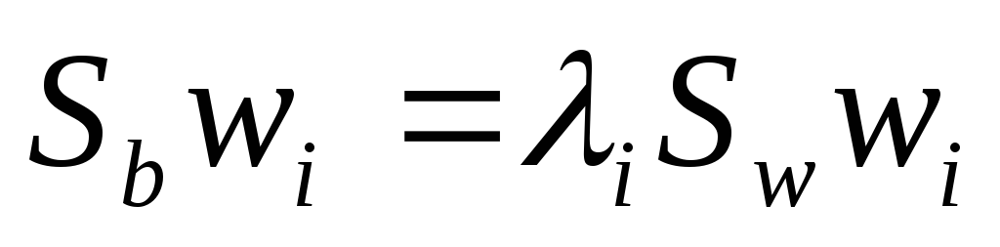


### Анализ главных компонент

**Синонимы: Principal Component Analysis (PCA), преобразование Карунена-Лева, Собственные лица (Eigenfaces)**

Из исходных изображений извлекаются компоненты таким образом, чтобы максимизировать разброс (дисперсию) среди всех имеющихся изображений (То есть компоненты будут очень хорошо выражать различия изображений). Компоненты извлекаются методом линейной проекции на собственные вектора корреляционной матрицы изображений. Проблема заключается в том, что лица, относящиеся к одному и тому же человеку (но с разными углами, изображениями лица) PCA будет также сильно разносить. Поэтому часто PCA используется совместно с LDA на начальной стадии для снижения общей размерности задачи.

Алгоритм

Пусть общее число изображений T и размерность каждого из них N. Вычтем общее среднее из всех изображений и получим новый набор векторов

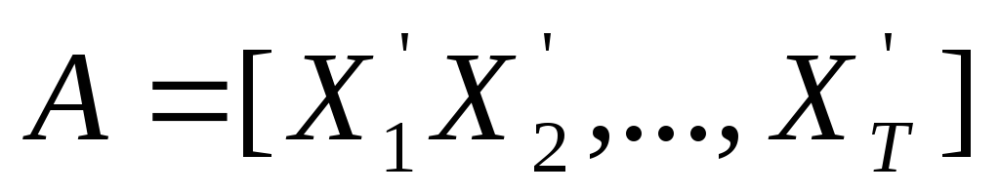

- размерность NxT

Пусть S – ковариационная матрица, построенная по всей базе:

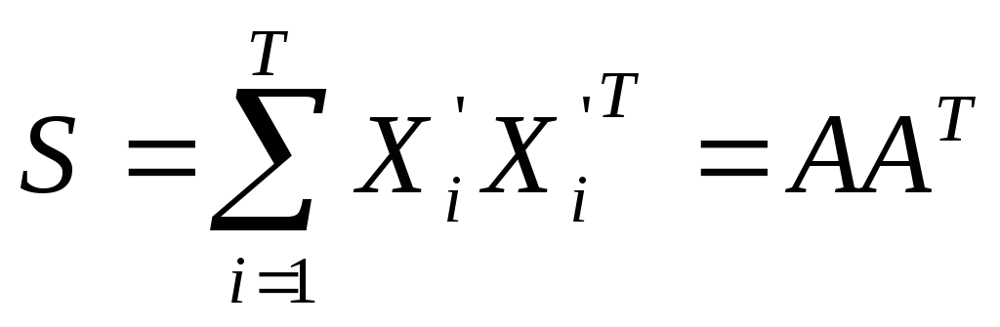

- размерность NxN

Производится разложение данной матрицы на собственные числа и вектора.

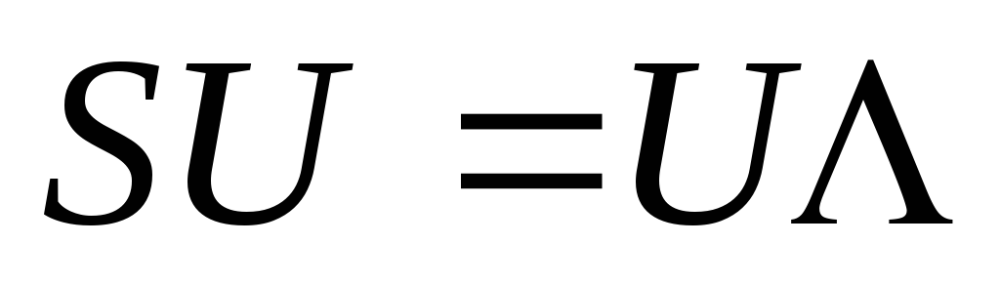

В силу большой размерности матрицы S (квадрат от размерности изображений) поступают хитрее. Поскольку собственные числа у матриц  и  совпадают (то есть собственные числа матрицы  включают в себя все собственные числа матрицы ), то вначале находят собственные числа и вектора матрицы  (у нее размерность TxT):

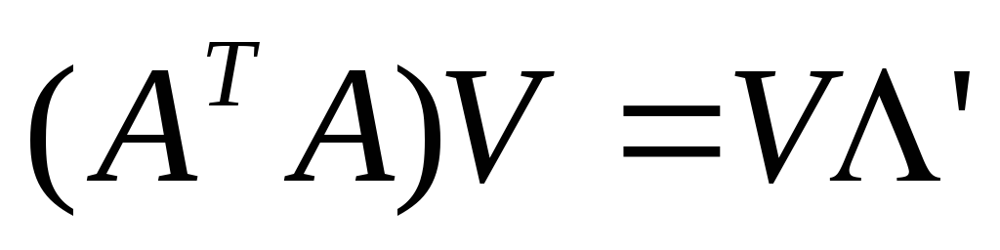

Домножим на A последнее уравнение, получим

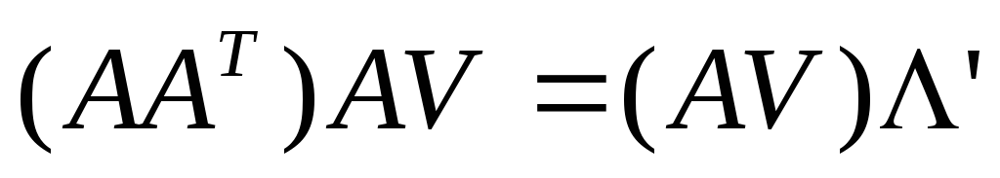

Найдем m максимальных собственных значений из множества  и соответствующие им собственные вектора. Из этих векторов и составляется проекционная матрица PCA:

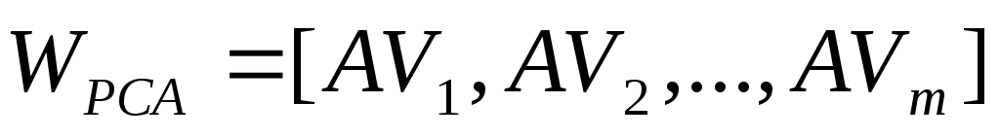

Вектора X, представляющий собой изображение лица, проецируется в вектора Y с использованием проекционной матрицы следующим образом:

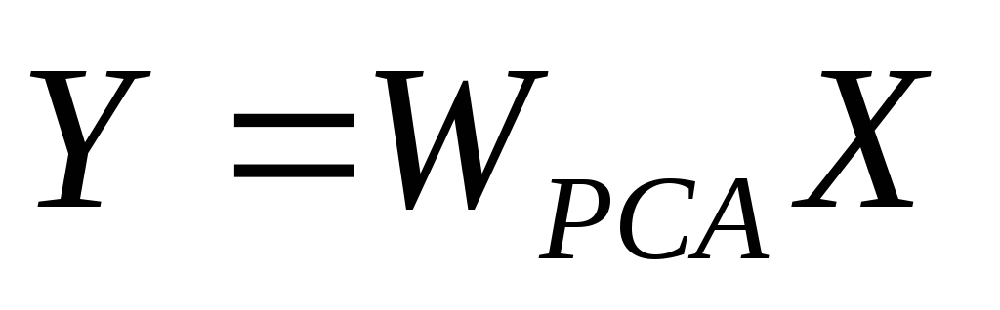

При распознавании в режиме реального времени новое изображение вычитается из среднего и проецируется в Y.

Метод Фишера работает уже с проекциями лиц, сделанными по PCA.

### Анализ независимых компонент

**Синонимы: Independent Component Analysis (ICA), независимый факторный анализ (НФА)**

Также как и PCA это извлечение признаков из входных образов лиц, но компоненты являются статистически независимыми или независимыми насколько это возможно.

Текущую реализацию алгоритмов для НФА можно разделить на несколько подходов. Первый подход заключается в минимизации или максимизации некоторых функций, соответствующих определенным критериям. Проблемой является необходимость использования очень сложной матрицы или тензорных операций. Другой подход состоит из адаптивных алгоритмов, часто основанных на стохастических градиентных методах. Ограничением этого подхода является медленная сходимость.

#Топографический независимый факторный анализ


Топографический НФА (ТНФА) является расширением НФА. В данном методе объекты снимаются в разных позах и при разных условиях освещения. В результате применения ТНФА получается топографическая карта базисных компонент. Карта является топографической в следующем смысле: базисные компоненты как элементы отображения упорядочиваются в 2D-карте таким образом, что компоненты со схожими углами зрения группируются на одной оси, а изменения освещения учитываются на другой оси. Это обеспечивает значимое множество базисных векторов, которые можно использовать для построения подпространств точек зрения для обнаружения и распознавания объектов, основанного на внешнем виде инвариантно к углу зрения.

Для обучения ТНФА используются изображения, содержащие лица, повернутые на углы от -90° до +90°.

Топографический НФА представляет собой обучающий метод с помощью которого базисные компоненты упорядочиваются в соответствии с некоторыми статистическими данными высшего порядка. В ТНФА предположение о независимости ослаблено. Компоненты которые близки друг к другу, т.е. находящиеся внутри определенной окрестности, не считаются независимыми; они могут коррелировать по значениям их энергии.

#**1.2 Существующие решения задачи распознавания эмоций**

##**FaceReader**

РазработканидерландскойкомпанииNoldus Information Technology. Программа способна классифицировать лицевые экспрессии по 6 базовым эмоциям, а также определять нейтральное выражение лица. Помимо этого, FaceReader способен определять пол и возраст людей. 

Программа использует геометрические признаки изображения для классификации, в частности, используется метод Active Appearance Model,создающий модель лица человека по ключевым точкам с учетом деталей поверхности.Решение задачи классификации осуществляется нейронной сетью.

Достоинства: 
* Система способна анализировать как статические кадры, так и видеофайлы.
* Для распознавания эмоции наклон лица в плоскости может быть любым, если система сможет его обнаружить. 
* Программа хорошо визуализирована: присутствуют диаграммы, гистограммы, проценты выражаемых эмоций.

Недостатки: 
* Система не натренирована для распознавания эмоций детей младше пяти лет.
* Точность распознавания снижается, если пользователь в очках.
* Программа не детектирует лица, повернутые в профиль.


##**Project Oxford**

Компания Microsoft разработала проектпод названиемProject Oxford. Данный проект представляет собой набор готовых REST API, реализующих алгоритмы компьютерного зрения. Помимо сервиса распознавания лиц, речи и текста, данный проект включает в себя также сервис по распознаванию эмоций. Программа способна различать следующие типы эмоций:счастье, страх, грусть, отвращение,гнев, презрение, удивление,а также нейтральное выражение лица. Разработчики могут использовать данные сервисы внутри своих приложений.

Достоинства:
* Возможность использования внутри различных приложений.
* Демонстрация процентов выражаемых эмоций.

Недостатки:
* Программа не может распознать лица с наклоном более 40 градусов.* Распознавание эмоций ведется только на статичных изображениях.



# **1.3 Классифицирующие модели на основе задачи ImageNet**

ImageNet - это визуальный набор данных, который содержит более 15 миллионов изображений высокого разрешения, охватывающих почти 22000 категорий. ImageNet Dataset имеет высокое качество и это одна из причин, почему он очень популярен среди исследователей, чтобы проверить свою модель классификации изображений на наборе данных.

Идея визуальной базы данных ImageNet была придумана Фэй-Фэй Ли, профессором информатики Стэнфордского университета в 2006 году. В те дни она работала в области медицинской визуализации и столкнулась с проблемами в разработке моделей обучения машин из-за отсутствия качественных изображений.

Недовольная отсутствием качественных данных для тренировочных моделей ML и вдохновленная иерархией WordNet, Фэй-Фэй Ли вместе с членами своей команды начала проект, известный как ImageNet, который был направлен на создание улучшенного набора изображений.

Это был выдающийся шаг, учитывая, что другие исследователи пытались улучшить алгоритмы ML, Фэй-Фэй Ли решил улучшить набор данных для лучшей подготовки моделей ML и запустил базу данных в 2009 году.




##**ImageNet Large Visual Recognition Challenge (ILSVRC)**


Основываясь на этой идее обучения моделей классификации изображений на ImageNet Dataset, в 2010 году был запущен ежегодный конкурс классификации изображений, известный как ImageNet Large Visual Recognition Challenge или ILSVRC.

ILSVRC использует меньшую часть ImageNet, состоящую только из 1000 категорий. Общее количество учебных изображений составляет 1,3 миллиона, сопровождаемых 50000 проверочных изображений и 1000000 тестовых изображений.

Модели, участвующие в этом конкурсе, должны выполнять задачи по обнаружению объектов и классификации изображений в больших масштабах и моделей, которые достигают минимальной частоты ошибок в топ-1 и топ-5 (Топ-5 процент ошибок будет процент изображений, где правильная метка не является одним из пяти наиболее вероятных этикеток модели) объявляется победителем.

В этом разделе мы рассмотрим модели глубокого обучения, которые выигрывали  соревнований Imagenet Challenge ILSVRC. Также будут рассмотрены вопросы преимущества перед другими моделями и возможности их улучшения.

##**1.3.1 AlexNet | ILSVRC Competition – 2012 (Winner) | Top-5 Error Rate – 15.30%**

AlexNet - это Convolutional Neural Network, разработанная командой Алекса Крижевского. До 2012 года коэффициент ошибок модели классификации изображений был около 25%, но AlexNet шокирующе превзошел этот показатель с 15,3 в 2012 году ImageNet.

AlexNet часто считается пионером свёрточной нейронной сети и отправной точкой бума глубокого обучения. AlexNet определенно занял культовый статус в истории соревнований ImageNet (ILSVRC).

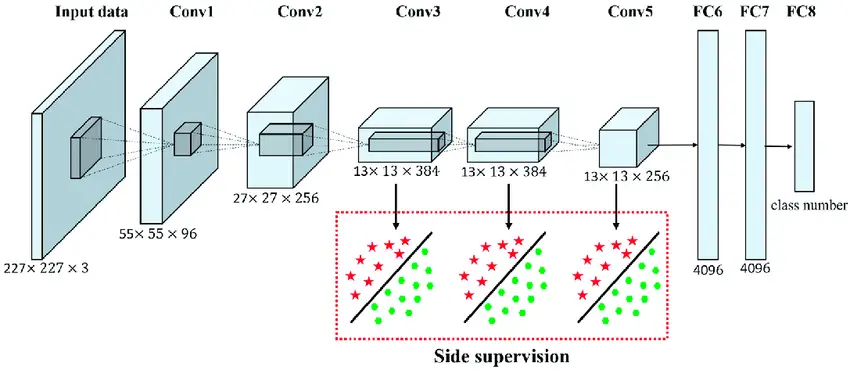



AlexNet содержит 8 слоев, 5 из которых являются свёрнутыми слоями, и 3 слоя, полностью связанных друг с другом.  Использовалась функция активации ReLU для добавления нелинейности и улучшения скорости конвергенции, а также использовал несколько графических процессоров для более быстрого обучения. Поскольку у AlexNet было 60 миллионов параметров, делающих его восприимчивым к переобучению, создатели приняли метод увеличения данных и отсева, чтобы избежать перелова. Кроме того, AlexNet использовала перекрывающиеся пулы для уменьшения ошибки.

## **1.3.2 ZFNet | ILSVRC Competition – 2013 (Winner) | Top-5 Error Rate – 11.2%**

ZFNet принял участие в конкурсе ImageNet в 2013 году, через год после победы AlexNet. Профессор Нью-Йоркского университета по имени Dr. Rob Fergus вместе со своим доктором наук Dr. Matthew D. Zeiler разработали эту новую нейронную сеть и назвали её по инициалам их фамилий. 

Он превзошел результаты AlexNet с 11,2% процентом ошибок и был победителем 2013 ImageNet вызов.

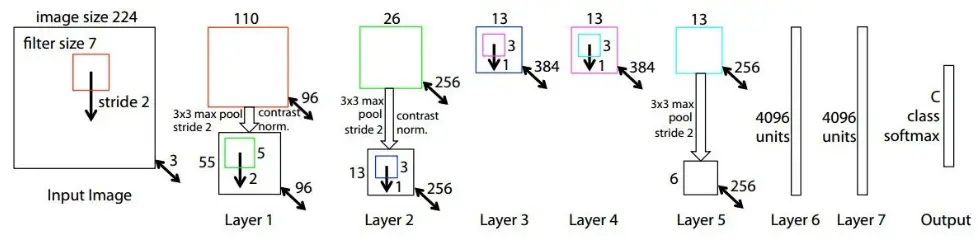

ZFNet считается расширенной версией AlexNet с некоторыми изменениями размера фильтра для достижения большей точности. ZFNet использовал 7 7 фильтров, в то время как, AlexNet использовал 11 фильтров. Идея использования меньших фильтров в свёрточном слое заключалась в том, чтобы избежать потери информации о пикселях.

Хотя ZFNet смог улучшить способ извлечения информации о пикселях, он не смог уменьшить вычислительные затраты, которые были вовлечены в углубление сети.

##**1.3.3 Inception V1 (GoogLeNet) | ILSVRC Competition – 2014 (Winner) | Top-5 Error Rate – 6.67%**

Запуск был разработан Google модели классификации изображений глубокого обучения, который был победителем в 2015 ImageNet вызов с частотой ошибок 6,67%. V1 означает 1-ю версию, а позже появились другие версии v2, v3 и т.п. Он также широко известен как GoogLeNet.

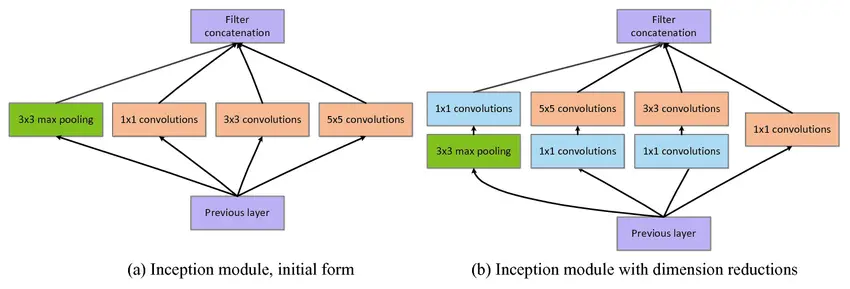

Идея архитектуры заключалась в том, чтобы спроектировать действительно глубокую сеть с 22 слоями, чего не было в ее предшественниках, таких как ZFNet и AlexNet. Для этого команда сделала несколько трюков, выбрав 1 1 свёртку вместе с ReLU для повышения вычислительной эффективности за счет уменьшения размеров и количества операций.

## **1.3.4 VGG-16 |  ILSVRC Competition – 2014 (Runners-Up) | Top-5 Error Rate – 7.3%**

VGG-16 - модель свёрточной нейронной сети, предложенная исследователями Оксфордского университета. VGG-16 занял 1-е место в конкурсе ImageNet 2014 года с показателем ошибок 7,3%. Несмотря на то, что VGG-16 не выиграл конкурс, архитектура была оценена и стала одной из самых популярных моделей классификации изображений.

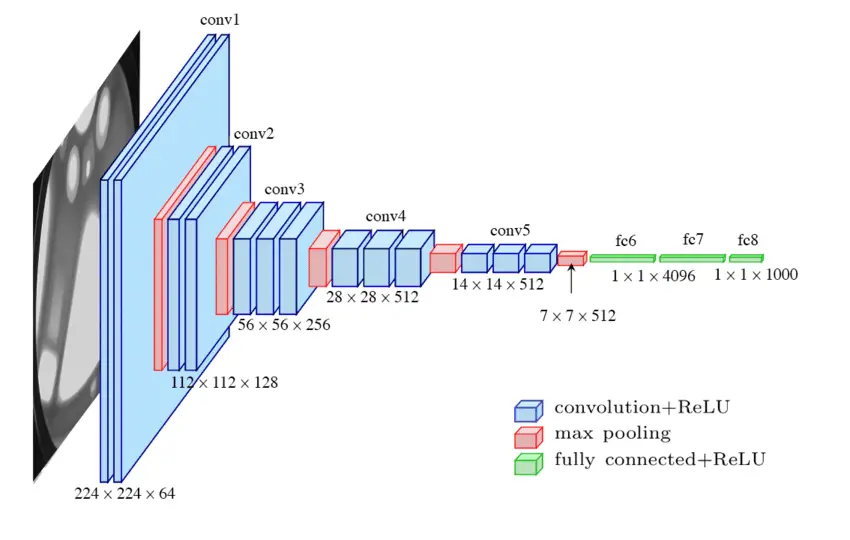

В VGG-16 основная характеристика заключается в том, что вместо использования больших фильтров, таких как AlexNet и ZFnet, он использует несколько 3-х размерных фильтров последовательно. Скрытые слои сети используют функции активации ReLU. Однако VGG-16 очень медленно тренируется, и сетевые веса, при сохранении на диске, занимают большое пространство.

## **1.3.5 ResNet | ILSVRC Competition – 2015 (Winner) | Top-5 Error Rate – 3.57%**

ResNet (Residual Network) была создана командой Microsoft Research и выиграла в 2015 году конкурс ImageNet с коэффициентом ошибок 3,57%.

Идея использования многочисленных скрытых слоёв и чрезвычайно глубоких нейронных сетей была реализована многими моделями, но затем стало ясно, что такие модели страдают от проблемы исчезновения или взрыва градиентов. Команда Microsoft Research разработала архитектуру ResNet для решения этой проблемы.

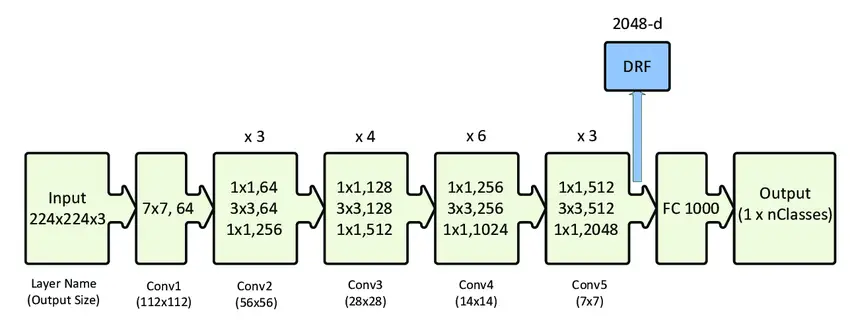

ResNet использует остаточные блоки и пропускает соединения для увеличения количества скрытых слоев до 152, не беспокоясь о проблеме исчезающего градиента. В основном сеть сохраняет информацию, полученную путем обучения в форме остатков. Это делается через идентификационную функцию отображения веса, в которой выход эквивалентен входу.

## **1.3.6 ResNeXt-10 | ILSVRC Competition – 2016 (Runners Up) | Top-5 Error Rate – 4.1%**

ResNeXt-10 был разработан в сотрудничестве с исследователями из UC San Diego и Facebook AI Research. ResNeXt-10 была вдохновлена предыдущими моделями, такими как ResNet, VGG, а также Inception. Это был вызов Runners Up 2016 ImageNet, но все же он стал популярной моделью.

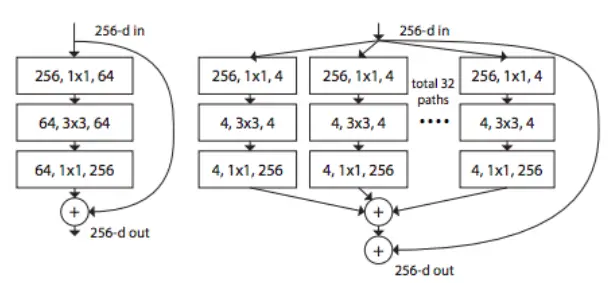

Идея реализации ResNeXt заключалась в том, чтобы сложить блоки, а затем использовать подход ResNet к остаточным блокам. Здесь также использовались такие гиперпараметры, как ширина и фильтры.

Кроме того, ResNeXt имеет особенность, известную как кардинальность, эта особенность относится к размеру набора преобразований. Архитектура ResNeXt использует 32 топологических блока, что просто предполагает, что кардинальность равна 32. Поскольку топология является однородной, требования к параметрам являются менее строгими, и к структуре сети может быть добавлено большее число слоев.

## **1.3.7 PNASNet-5 | ILSVRC Competition – 2018 (Winner) | Top-5 Error Rate – 3.8%**

PNASNet - прогрессивный поиск нейроархитектуры. PNASNet-5 реализует новый способ изучения структуры свёрточных нейронных сетей (CNN), используя силу обучения армированию и эволюционные алгоритмы. Подход заключается в проведении оптимизации с использованием последовательной модели. PNASNet-5 работает очень хорошо с 5 раз большей эффективностью, чем предыдущие модели, а также в 8 раз быстрее.

PNASNet-5 стал победителем конкурса ImageNet 2018 года с показателем ошибок 3,8%.

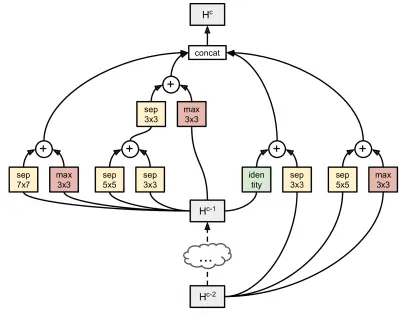

Эта прогрессивная структура помогает быстрее обучить модель. С такой структурой можно выполнить гораздо более углубленный поиск моделей.

# <b> Подготовка исходного датасета </b>

Для обучения нейронной сети применялся тренировочный набор данных,состоящий из самостоятельно собранных фототграфий, распределенных по 5 основным признакам: злость, отвращение, страх, счастье, нейтральное настроение. 

Для каждого вида эмоции были созданы специальные папки, распределение в которых происходит следующим образом: 

anger: 174

disgust: 292

fear: 177

joyfulness: 339

neutral: 398

# <b>Глава 2. Разработка</b>

Модели для данной работы были разработаны инструментами библиотек PyTorch, TensorFlow, Scikit-learn. После ряда экспериментов были отобраны по две модели на каждый фреймворк.

Используемый датасет собран нами вручную под конкретную задачу из имеющейся в нашем распоряжении базы данных изображений (около 140 тысяч изображений). Было отобрано 1380 изображений по пяти классам - anger, disgust, fear, joyfulness, neutral.

Конечный документ обучен с ипользованием GPU, предоставляемых платформой "Kaggle".

# <b>2.1 ПОДГОТОВИТЕЛЬНЫЙ ЭТАП</b>


# Установка и импорт необходимых библиотек

In [ ]:
!pip install gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install --pre torcheval-nightly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.9/168.9 KB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.6/83.6 KB 10.4 MB/s eta 0:00:00


In [ ]:
!pip install timm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 34.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 KB 26.2 MB/s eta 0:00:00


In [ ]:
!pip install -q --upgrade wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 48.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 KB 21.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 7.4 MB/s eta 0:00:00


In [ ]:
!pip install pytorch-ignite

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.5/266.5 KB 18.8 MB/s eta 0:00:00


In [ ]:
!pip install --pre pytorch-ignite

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import platform
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

import torch
from torcheval.metrics.functional import multiclass_f1_score
from torch.utils.data import Dataset, DataLoader

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, models, transforms
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, CosineAnnealingLR, ReduceLROnPlateau, StepLR
from torch.optim import lr_scheduler
import torch.backends.cudnn
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

import tensorflow as tf

import sklearn
# from sklearn.model_selection import train_test_split

from tqdm import tqdm
import time
import wandb
import timm
import random
import copy
# import cv2
import datetime as dt


# Для Ignite загрузки
import ignite
from ignite.engine import Engine, _prepare_batch
from ignite.engine import Events
from ignite.handlers import Timer, BasicTimeProfiler, HandlersTimeProfiler, Timer
from ignite.engine import Engine
from ignite.metrics import Accuracy, Precision, Recall, Loss, RunningAverage, ConfusionMatrix
from ignite.contrib.handlers import ProgressBar
from ignite.engine import create_supervised_evaluator
from torch.utils.data.dataset import Subset


print('Python version:', platform.python_version())
print('pytorch version:', torch.__version__)
print('tensortlow version:', tf.__version__)
print('numpy version:', np.version.version)
print('pandas version:', pd.__version__)
print('scikit-learn version:', sklearn.__version__)
print('matplotlib version:', matplotlib.__version__)
print('seaborn version:', sns.__version__)
print('GPU Device Found.' if tf.config.list_physical_devices('GPU') else 'GPU Device Not Found. Running on CPU')

Python version: 3.9.16
pytorch version: 2.0.0+cu118
tensortlow version: 2.12.0
numpy version: 1.22.4
pandas version: 1.4.4
scikit-learn version: 1.2.2
matplotlib version: 3.7.1
seaborn version: 0.12.2
GPU Device Found.


# 2.1.1 Подготовка файлов для работы с локального диска

## Загрузка данных на локальный диск

In [ ]:
import gdown
import zipfile
from pathlib import Path

# Загрузка архива
# stable link https://drive.google.com/file/d/1JdDlgpvtlMN99X0eAruGqXrMNi_sh1sg
ident = '1JdDlgpvtlMN99X0eAruGqXrMNi_sh1sg'
fname = 'emotions'

# Пусть к основной папке с изображениями
p = Path('./data')

# Путь к базовой директории, которая будет создана чуть позже
base_dir = p / fname

local_zip = gdown.download(id=ident, output=fname+'.zip')

Downloading...
From: https://drive.google.com/uc?id=1JdDlgpvtlMN99X0eAruGqXrMNi_sh1sg
To: /content/emotions.zip
100%|██████████| 14.8M/14.8M [00:00<00:00, 151MB/s]


Распаковка в текущую директорию.

In [ ]:
with zipfile.ZipFile(local_zip, 'r') as zip_ref:
    zip_ref.extractall(p)

Теперь загруженный архив можно удалить.

In [ ]:
import os

os.remove(fname + '.zip')

Переименуем папку с изображениями в `emotions`. Для отключения ограничения "Только чтение" у папки с изображениями воспользуемся следующей функцией ([источник](https://www.tutorialspoint.com/How-to-change-the-permission-of-a-directory-using-Python#)):

In [ ]:
def change_permissions_recursive(path, mode):
    for root, dirs, files in os.walk(path, topdown=False):
        for dr in [os.path.join(root,d) for d in dirs]:
            os.chmod(dr, mode)
        for file in [os.path.join(root, f) for f in files]:
                os.chmod(file, mode)

In [ ]:
zip_content = os.listdir(p)[0]
zip_content

'emotions_dataset'

Функция не всегда срабатывает с первого раза, поэтому запустим следующий цикл:

In [ ]:
done = False

while done == False:
    try:
        change_permissions_recursive(p, 0o777)
        change_permissions_recursive(p / zip_content, 0o777)
        zip_content = os.renames(p / zip_content,
                   base_dir)
        done = True
    except:
        continue

## Настройка директорий

Проверим содержимое папки с изображениями.

In [ ]:
from pathlib import Path

# Базовая директория
classes = sorted(os.listdir(base_dir))

num_classes = len(classes)

# и ее содержимое
print("Содержимое базовой директории:")
print(classes)
print('Количество классов:', num_classes)

Содержимое базовой директории:
['ANGER', 'DISGUST', 'FEAR', 'JOYFULNESS', 'NEUTRAL']
Количество классов: 5


Переименуем папки в необходимые нам названия классов:

In [ ]:
# class_names = [x.lower() for x in classes]
class_names = sorted(['anger', 'disgust', 'fear', 'joyfulness', 'neutral'])

done = False
while done == False:
    try:
        change_permissions_recursive(base_dir, 0o777)
        done = True
    except:
        continue

done = False
while done == False:
    try:
        for i, class_name in enumerate(sorted(class_names)):
            change_permissions_recursive(base_dir/class_name, 0o777)
            os.renames(base_dir/classes[i], base_dir/class_name)
        done = True
    except:
        continue

classes = sorted(os.listdir(base_dir))

In [ ]:
classes

['anger', 'disgust', 'fear', 'joyfulness', 'neutral']

## Удалим некорректные файлы

Если в архиве содержатся некорректные ("битые") файлы, то мы получим ошибку на том или ином этапе обучения и подготовки модели к переносу на мобильное устройство. Код ниже позволяет обнаружить и сразу удалить такие файлы при их наличии. Запустим эту функцию для всех папок с классами ([источник кода](https://github.com/tensorflow/datasets/issues/2188)).

In [ ]:
from pathlib import Path
from tensorflow.io import read_file
from tensorflow.image import decode_image

def delete_corrupted_files(folder, base_dir):
    for image in sorted((base_dir / f'{folder}').glob('*')):
        try:
            img = read_file(str(image))
            img = decode_image(img)

            if img.ndim != 3:
                print(f"[FILE_CORRUPT] {str(image).split('/')[-1]} DELETED")
                image.unlink()

        except Exception as e:
            print(f"[ERR] {str(image).split('/')[-1]}: {e} DELETED")
            image.unlink()

In [ ]:
for folder in classes:
    print(folder)
    delete_corrupted_files(folder, base_dir)

anger
disgust
[ERR] 5a971597aae6052a008b45a7.webp: {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} Unknown image file format. One of JPEG, PNG, GIF, BMP required. [Op:DecodeImage] DELETED
[ERR] Universal_Expression_Disgust.webp: {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} Unknown image file format. One of JPEG, PNG, GIF, BMP required. [Op:DecodeImage] DELETED
[ERR] gettyimages-520925691.webp: {{function_node __wrapped__DecodeImage_device_/job:localhost/replica:0/task:0/device:CPU:0}} Unknown image file format. One of JPEG, PNG, GIF, BMP required. [Op:DecodeImage] DELETED
fear
joyfulness
neutral


## Распределение изображений

Сохраним пути к субдиректориям с классами в отдельные переменные и посмотрим на конечное количество изображений в каждом классе.

In [ ]:
anger_dir, disgust_dir, fear_dir, joyfulness_dir, neutral_dir = [base_dir / classes[i]
                                                   for i in range(len(classes))]
directories = anger_dir, disgust_dir, fear_dir, joyfulness_dir, neutral_dir


anger_fnames, disgust_fnames, fear_fnames, joyfulness_fnames, neutral_fnames = [os.listdir(i)
                                                              for i in directories]
files_names = anger_fnames, disgust_fnames, fear_fnames, joyfulness_fnames, neutral_fnames


for i, cls_name in enumerate(class_names):
    print(cls_name + ':', len(files_names[i]))

anger: 174
disgust: 292
fear: 177
joyfulness: 339
neutral: 398


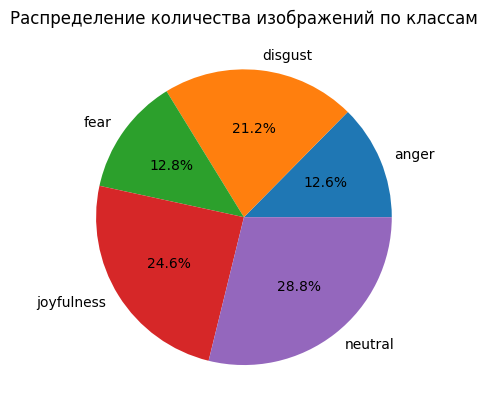

In [ ]:
import seaborn as sns

x = np.array([len(anger_fnames), len(disgust_fnames),
              len(fear_fnames), len(joyfulness_fnames),
              len(neutral_fnames)])

plt.title('Распределение количества изображений по классам')
plt.pie(x, labels=classes, autopct='%.1f%%');

Классы несбалансированы, поэтому, помимо метрики `accuracy`, для оценки ошибки классификации мы будем использовать метрики, основанные на `precision` и `recall`, а также матрицу ошибок.

In [ ]:
print(len(class_names))

5


Посмотрим на названия отдельных файлов.

In [ ]:
for i, j in zip(class_names, files_names):
    print(i, j[90:93])

anger ['2978.jpg', '142029.jpg', '35200.jpg']
disgust ['8341.jpg', '35441.jpg', '97550.jpg']
fear ['182813.jpg', '210251.jpg', '107322.jpg']
joyfulness ['7722.jpg', '4268.jpg', '28.jpg']
neutral ['190697.jpg', '2617.jpg', '137317.jpg']


## Визуализация оригинальных изображений

Посмотрим на фотографии из обеих субдиректорий - по 4 фотографии каждого класса.

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

# Параметры для отрисовки - количество строк и столбцов
nrows = 5
ncols = 4

# Индекс для итерации изображений
pic_index = 0

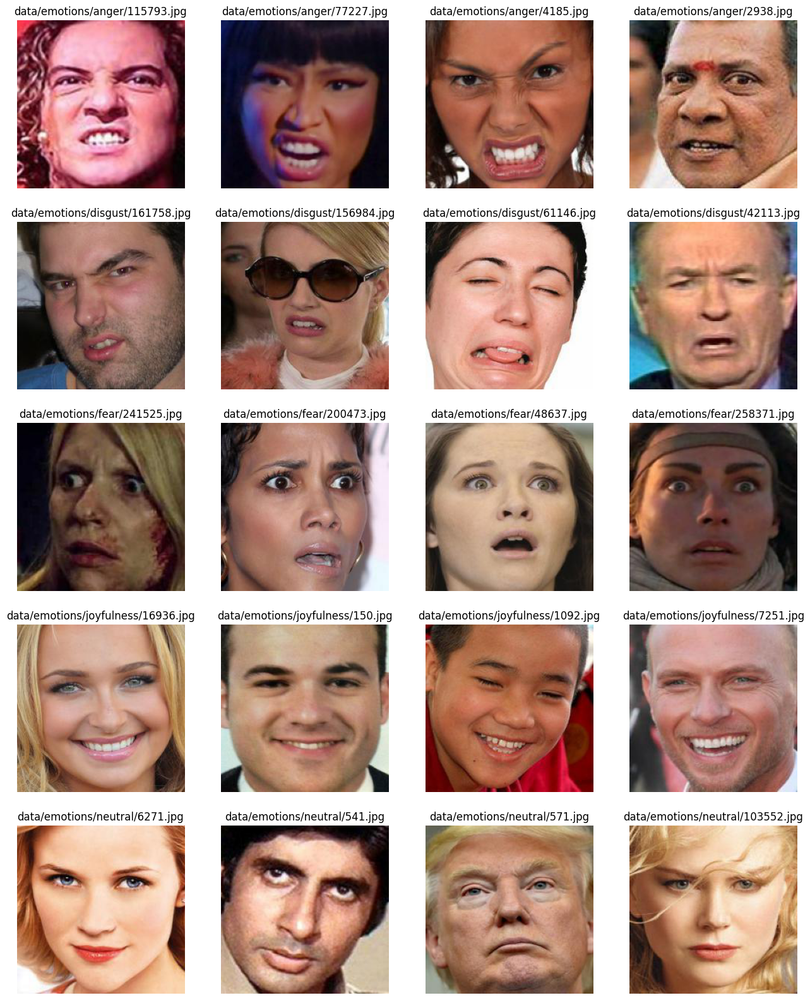

In [ ]:
# Запустите эту ячейку несколько раз, чтобы увидеть разные наборы фотографий

fig = plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)

pic_index += 4

next_anger_pic = [os.path.join(anger_dir, fname)
                for fname in anger_fnames[pic_index-4:pic_index]]
next_disgust_pic = [os.path.join(disgust_dir, fname)
                for fname in disgust_fnames[pic_index-4:pic_index]]
next_fear_pic = [os.path.join(fear_dir, fname)
                for fname in fear_fnames[pic_index-4:pic_index]]
next_joyfulness_pic = [os.path.join(joyfulness_dir, fname)
                for fname in joyfulness_fnames[pic_index-4:pic_index]]
next_neutral_pic = [os.path.join(neutral_dir, fname)
                for fname in neutral_fnames[pic_index-4:pic_index]]


for i, img_path in enumerate(next_anger_pic+next_disgust_pic+
                            next_fear_pic+next_joyfulness_pic+
                            next_neutral_pic):
    ax = plt.subplot(nrows, ncols, i+1)
    ax.axis(False)
    plt.title(img_path)
    
    img = mpimg.imread(img_path)
    plt.imshow(img)


Изображения в имеющихся наборах имеют различное разрешение и соотношение сторон, их необходимо привести к единому стандарту на стадии формирования датасетов для наших моделей. 

## Создание DataFrame для моделей классического ML

Для моделей классического машинного обучения изображения необходимо перевести в векторы, объединить эти векторы в одну DataFrame, добавив последним столбцом номера классов (от 0 до 4, ординальная кодировка). Следующий код аккуратно проделает все операции, на выходе мы получим желаемую DataFrame, после чего ее можно будет разделить средствами библиотеки `sklearn` на обучающую и валидационную выборки.

In [ ]:
import pandas as pd
from PIL import Image

# создадим пустые списки для векторов по классам
anger_features = []
disgust_features = []
fear_features = []
joyfulness_features = []
neutral_features = []
features_lst= sorted([anger_features, disgust_features,
                      fear_features, joyfulness_features,
                      neutral_features])

# переведем изображения в вектора, добавим таргет
# и сохраним в списках
final_df = pd.DataFrame()  # пустой датафрейм
for name, lst in zip(class_names, features_lst):
    fpath = base_dir / name
    lst_idx = features_lst.index(lst)
    for img in os.listdir(fpath):

        img = Image.open(fpath/img)
        img = np.array(img)

        if img.shape == (224, 224, 3):

            a = np.reshape(img, (224*224*3))
            b = np.ones(1, dtype='uint8')*lst_idx
            c = np.append(a, b)
            lst.append(c)

    # добавим все данные в общую таблицу
    final_df = pd.concat([final_df, pd.DataFrame(lst)], axis=0)

final_df.index = range(final_df.shape[0])

In [ ]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1372 entries, 0 to 1371
Columns: 150529 entries, 0 to 150528
dtypes: int8(150529)
memory usage: 197.0 MB


In [ ]:
final_df.shape

(1372, 150529)

In [ ]:
final_df

,0,1,2,3,4,5,6,7,8,9,...,150519,150520,150521,150522,150523,150524,150525,150526,150527,150528
0,30,30,30,25,25,25,19,19,19,17,...,48,48,48,45,45,45,40,40,40,0
1,21,12,7,23,14,9,25,16,11,25,...,-38,3,18,-40,4,18,-40,4,18,0
2,107,87,60,106,86,59,107,86,59,111,...,-60,-58,-43,-59,-57,-42,-58,-56,-41,0
3,-1,0,-1,-1,0,-1,-1,0,-1,-1,...,-1,-1,2,-1,-1,4,-1,-1,4,0
4,33,14,0,35,16,2,38,20,6,38,...,90,54,30,84,48,24,78,42,18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1367,-48,-35,-29,-55,-42,-36,-66,-55,-49,-73,...,-44,-36,-23,-51,-43,-30,-53,-45,-32,4
1368,122,-120,83,114,-128,77,98,107,64,80,...,32,52,61,32,52,59,32,52,59,4
1369,-5,-6,-8,-5,-6,-8,-5,-6,-8,-5,...,39,34,31,39,34,31,39,34,31,4
1370,-109,-123,-126,-95,-109,-112,-117,124,119,103,...,-77,-114,123,-79,-116,124,-84,-124,122,4


## Split изображений для нейросетей

Для обучения и оценки работы нейросетей мы создаем три датасета: обучающий, валидационный и тестовый. Для удобства создадим соответствующие директории (train, validation, test), внутри которых будут находиться папки-классы, куда мы переместим все изображения в заранее заданном соотношении. После этого создать датасеты для torch и tf будет совсем несложно.

Напишем для этой операции собственную функцию. Вложенная функция `split_numbers` автоматически определит количество изображений, необходимое для каждого сплита по всем классам, в заданном нами соотношении, например: `train : validation : test = 8:1:1` (значение по умолчанию). При необходимости это соотношение можно изменить в любую сторону, для чего нужно указать значения для тренировочной и валидационной частей, а тестовая часть посчитается автоматически как остаток (при этом нужно помнить, что сумма частей, на которые мы делим датасает, должна быть кратна 10; при желании это правило можно изменить, переписав вложенную функцию).

In [ ]:
from pathlib import Path
import shutil
import os

def make_split(files_names, base_dir, class_folder, relation=(8, 1)):

    dataset_split_folders = 'train', 'validation', 'test'
    train_dir, val_dir, test_dir = [base_dir / i
                    for i in dataset_split_folders]

    for directory in (train_dir, val_dir, test_dir):
        try:
            Path.mkdir(directory)
        except:
            # print(f'Directory {directory} already exists or cannot be created.')
            pass
        try:
            Path.mkdir(directory / class_folder)
        except:
            # print(f'Directory {directory / class_folder} already exists or cannot be created.')
            pass

    def split_numbers(files_names=files_names):
        imgs_num = len(files_names)
        train_num, val_num = int(imgs_num//10*relation[0]), int(imgs_num//10*relation[1])
        test_num = imgs_num - train_num - val_num
        return train_num, val_num, test_num

    examples = split_numbers(files_names)
    directories = train_dir, val_dir, test_dir

    for num, dr in zip(examples, directories):
        i = num
        while i != 0:
            image_name = os.listdir(base_dir / class_folder)[i-1]
            shutil.move(base_dir / class_folder / image_name,
                         dr / class_folder / image_name)
            i -= 1

    shutil.rmtree(base_dir / class_folder)

Применим эту функцию к каждому из классов.

In [ ]:
for i in range(len(classes)):
    make_split(files_names[i],
             base_dir=base_dir,
             class_folder=sorted(classes)[i],
             # изменим немного соотношение в пользу валидации
             relation=(8, 1.2))

Изначальный датасет разделен на три части в соотношении примерно 8 : 1.2 : 0.8. Теперь у нас имеются три директории, содержащие папки с нужными нам классами.

In [ ]:
for i in os.listdir(base_dir):
    print(i, os.listdir(base_dir / i))

test ['fear', 'neutral', 'anger', 'joyfulness', 'disgust']
train ['fear', 'neutral', 'anger', 'joyfulness', 'disgust']
validation ['fear', 'neutral', 'anger', 'joyfulness', 'disgust']


# 2.1.2 Подготовка функций, переменных и датасетов | <b>PyTorch</b>

## CFG класс

Подготовим CFG - класс с параметрами нашего эксперимента.

In [ ]:
class CFG:

    num_workers=2
    model_name = 'ResNet emo'
    size=(224,224)
    scheduler='StepLR' # ['StepLR', 'ReduceLROnPlateau', 'CosineAnnealingLR', 'CosineAnnealingWarmRestarts']
    epochs=30
    step_size = 20 # StepLR
    gamma = 0.1 # StepLR
    factor=0.2 # ReduceLROnPlateau
    patience=4 # ReduceLROnPlateau
    eps=1e-6 # ReduceLROnPlateau
    T_max=6 # CosineAnnealingLR
    T_0=6 # CosineAnnealingWarmRestarts
    lr=1e-4 # 3e-4
    min_lr=1e-6
    batch_size=8
    seed=42
    

    api = "c46873158d9b17d359eb43bbe31308d56f8ce3d4"# вписать свой API Wandb  
    project = "ready_go"# вписать название эксперимента, который предварительно надо создать в Wandb
    entity = "gret-ell"# ввести свой логин
    wandb = False # флаг использования Wandb

Переведем наш класс с параметрами в словарь.

In [ ]:
def class2dict(f):
    return dict((name, getattr(f, name)) for name in dir(f) if not name.startswith('__'))

In [ ]:
def seed_everything(seed):
    random.seed(CFG.seed)  # фиксируем генератор случайных чисел
    os.environ['PYTHONHASHSEED'] = str(CFG.seed)  # фиксируем заполнения хешей. PYTHONHASHSEED переменная среды с фиксированным значением
    np.random.seed(CFG.seed)  # фиксируем генератор случайных чисел numpy
    torch.manual_seed(CFG.seed)  # фиксируем генератор случайных чисел pytorch
    torch.cuda.manual_seed(CFG.seed)  # фиксируем генератор случайных чисел для GPU

## Данные для модели

In [ ]:
# поканальные значения среднего и стандартного отклонения для ImageNet, на которых предобучены модели и которые используются в этой работе.
IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD = np.array([0.229, 0.224, 0.225])

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
print(gpu_info)

Tue Apr  4 12:48:00 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    26W /  70W |    869MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Контроль изменения `learning_rate`

Определяем разные типы изменения скорости обучения.

In [ ]:
def get_scheduler(optimizer):
        if CFG.scheduler=='ReduceLROnPlateau':
          scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=CFG.factor, patience=CFG.patience, verbose=True, eps=CFG.eps)
        elif CFG.scheduler=='StepLR':
          scheduler = StepLR(optimizer, step_size=CFG.step_size, gamma=CFG.gamma)
        elif CFG.scheduler=='CosineAnnealingLR':
          scheduler = CosineAnnealingLR(optimizer, T_max=CFG.T_max, eta_min=CFG.min_lr, last_epoch=-1)
        elif CFG.scheduler=='CosineAnnealingWarmRestarts':
          scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=CFG.T_0, T_mult=1, eta_min=CFG.min_lr, last_epoch=-1)
        return scheduler

## Подготовка датасетов

In [ ]:
dataset = torchvision.datasets.ImageFolder(base_dir)

In [ ]:
dataset

Dataset ImageFolder
    Number of datapoints: 1380
    Root location: data/emotions

In [ ]:
# Data augmentation and normalization for training
# Только нормализация применима к validation
# ПРИМЕЧАНИЕ: использовать не более 2-х процессоров, иначе выходит предупреждение, что слишком высокое количество.
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
    ]),
    'validation': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD)
    ])
}

image_datasets = {x: datasets.ImageFolder(os.path.join(base_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'validation']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], 
                                              batch_size=CFG.batch_size,
                                             shuffle=True, num_workers=CFG.num_workers)
              for x in ['train', 'validation']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'validation']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Функция для отрисовки изображений

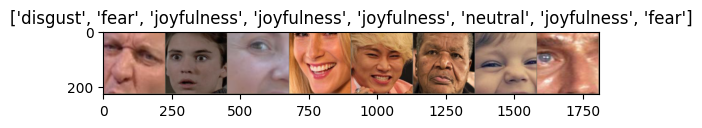

In [ ]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array(IMAGENET_MEAN)
    std = np.array(IMAGENET_STD)
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.5)  # установим паузу, чтобы графики успевали обновлятся


# Берем батч из training data
inputs, classes = next(iter(dataloaders['train']))

# Вынимаем из батча изображение
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

## Функция для тренировки моделей. Общая

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=CFG.epochs):
    since = time.time()
    loss_hist = {'train':[], 'validation':[]}
    F1_hist = {'train':[], 'validation':[]}
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    epoch_f1 = 0.0

    if CFG.wandb:
        os.environ["WANDB_API_KEY"] = CFG.api
        wandb.init(project=CFG.project, name=CFG.model_name, entity=CFG.entity, reinit=True, config=class2dict(CFG))

    seed_everything(CFG.seed)

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # В каждой эпохе есть training и validation фаза
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()  # Переводим модель в training mode
            else:
                model.eval()   # Переводим модель в evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Итерируемся.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # обнуляем градиенты
                optimizer.zero_grad()

                # forward
                # отслеживание истории только в train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize только если training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # подсчет статистики
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            epoch_f1 = multiclass_f1_score(outputs, labels, num_classes=len(class_names)).detach().cpu().numpy() # Для F1 меры требуется Тензор CPU. Переводим туда

            print(f'{phase}   |   Loss: {epoch_loss:.4f}  |  Acc: {epoch_acc:.4f}   |   F1: {epoch_f1:.4f}')
            
            # Передача данных в сервис wandb
            if CFG.wandb and phase == 'train':
              wandb.log({'train_loss': epoch_loss,
                   'train_accuracy': epoch_acc})

            if CFG.wandb and phase == 'validation':
              wandb.log({'test_loss': epoch_loss,
                   'test_accuracy': epoch_acc,
                   'test_F1': epoch_f1})
            # deep copy модели
            if phase == 'validation' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

            loss_hist[phase].append(epoch_loss)
            F1_hist[phase].append(epoch_f1)
        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')
    

    # загрузка best model weights
    model.load_state_dict(best_model_wts)
    return model, loss_hist, F1_hist

## Функция для визуализации результатов предсказания модели

In [ ]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['validation']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

# 2.1.3 Подготовка функций, переменных и датасетов | <b>TensorFlow</b>

## Архитектура, компиляция, обучение модели

`DROPOUT_RATE` назначим небольшим, так как датасет у нас скромный по объему и, если мы будем исключать значительную часть датасета из обучения, модель просто не сможет обучаться.

Также назначим переменную базовый learning rate - `BASE_LR`, установим значение на 0.01. Мы будем использовать специальный инструмент `callbacks`, который при необходимости будет уменьшать данный параметр непосредственно в ходе обучения.

In [ ]:
DROPOUT_RATE = 0.2
BASE_LR = 0.01
REGULARIZER=tf.keras.regularizers.L1L2(l1=0.0, l2=0.5)
EPOCHS=500  # см. callbacks

В качестве метрик будем использовать традиционную `accuracy` (в дань уважения традиции, для оценки работы классификатора на несбаланированных данных эта метрика не имеет большого смысла, так как она считает среднее по ошибкам, не учитывая крайности) и `PR-AUC` - площадь под графиком метрик precision и recall, которая позволяет учесть данные по редким классам и получить более объективную картину об эффективности обучения в нашем случае. Также можно было использовать метрику F1 Score, но готовый класс этой метрики на данный момент доступна только в "ночной" версии tf, а прописывать свой собственный класс мы не стали в связи с наличием готового инструмента PR-AUC, вполне удовлетворяющего нашим задачам.

In [ ]:
curve = 'PR'
name = curve+'_AUC'
AUC = tf.keras.metrics.AUC(curve=curve, multi_label=False, name=name)

# список с метриками
metrics = ['accuracy', AUC]

## Callbacks - контроль `learning_rate` и остановки обучения

Так как обучение моделей по компьютерному зрению очень затратно по ресурсам, а мы проводили целый ряд различных экспериментов, для снижения нагрузки на систему мы использовали так называемые `callbacks` - специальные модули `keras`, которые позволяют в автомтическом режиме контролировать, когда следует вносить те или иные изменения в обучение и даже останавливать его. Мы будем использовать два вида `callbacks`:

- `EarlyStopping` для ранней остановки обучения при прекращении уменьшения `val_loss` (для нашего несбалансированного датасета этот показатель важнее, чем непоказательный для несбалансированных классов `val_accuracy`),

- `ReduceLROnPlateau` для уменьшения `learning rate` при ухудшении показателей `val_loss` (постепенное снижение `learning rate` в процессе обучения положительно сказывается на качестве обучения, что мы увидели на наших экспериментах).

In [ ]:
from tensorflow.keras import callbacks

early_stopping = callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=1e-4,  # минимальное значение для зачета улучшения
    patience=12,  # количество эпох с плохим результатом перед остановкой
    restore_best_weights=True,  # восстановить лучшие показатели модели
)

# early_stopping = callbacks.EarlyStopping(
#     monitor='val_PR_AUC',
#     min_delta=1e-4,  # минимальное значение для зачета улучшения
#     patience=12,  # количество эпох с плохим результатом перед остановкой
#     restore_best_weights=True,  # восстановить лучшие показатели модели
#     mode="max"
# )

lr_schedule = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    patience=1,
    factor=0.85,  # на какое значение будет умножаться текущий lr
    min_lr=1e-8  # минимальное значение lr
)

Таким образом, наши callbacks создают следующий алгоритм: 
- при ухудшении `val_loss` на данной эпохе следующая эпоха будет прходить с `learning rate` на 15% ниже,
- если `val_loss` не улучшается 12 раз кряду, обучение прекращается.

Все эти параметры можно регулировать и подбирать, для наших задач мы остановимся на этих гиперпараметрах, так как в ходе экспериментов они показали себя достаточно эффективными.

## Визуализация итогов обучения

Также пропишем функции для отрисовки результатов обучения - графики функции потерь и метрик (обучающая и валидационная выборка), а также матрицу ошибок (тестовая выборка).

### Функция потерь и метрики

In [ ]:
def val_acc_viz(history, epochs, loss_from=1):
    '''
    Функция отрисовывает историю функции потерь и
    используемых метрик. Аргументы:
    - history - данные истории обучения,
    - epochs - количество эпох для отображения,
    - loss_from - с какой эпохи отображать loss.
    '''
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    auc = history.history[name]
    val_auc = history.history['val_' + name]

    loss = history.history['loss'][loss_from-1:]
    val_loss = history.history['val_loss'][loss_from-1:]

    epochs_range = range(1, len(acc)+1)

    sns.set_style('whitegrid')
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 3, 1)
    plt.plot(range(loss_from, len(acc)+1), loss, label='Training Loss')
    plt.plot(range(loss_from, len(acc)+1), val_loss, label='Validation Loss')
    plt.legend(loc='best')
    plt.title('Loss')
    plt.xlabel('epochs')
    # plt.show()

    # plt.figure(figsize=(8, 5))
    # ax1 = plt.subplot(1, 2, 1)
    ax2 = plt.subplot(1, 3, 2)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='best')
    plt.title('Accuracy')
    plt.xlabel('epochs')

    # plt.subplot(1, 2, 2, sharey=ax1)
    plt.subplot(1, 3, 3, sharey=ax2)
    plt.plot(epochs_range, auc, label='Training ' + name)
    plt.plot(epochs_range, val_auc, label='Validation ' + name)
    plt.legend(loc='best')
    plt.title(name)
    plt.xlabel('epochs')
    plt.show()

### Функция матрицы ошибок

В функции матрицы ошибок использованы инструменты библиотеки scikit-learn, что особенно удобно для отрисовки матрицы, хотя при желании можно прописать функцию отрисовки матрицы вручную.

In [ ]:
def confusion_matrix(model, dataset, images_number=None, class_names=class_names):

    '''
    Выводит матрицу ошибок на тестовых данных. 
    
    Аргументы:
    - model - обученная модель.
    - dataset - tf.dataset с тестовыми изображениями.
    - images_number - int: количество изображений из тестовой выборки;
            если None, то используются все изображения в выборке (по
            условию).
    - class_names - list: названия классов.
    '''
    
    from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

    
    if images_number is None:
        test_images = dataset
    else:
        test_images = dataset.take(images_number)

    y_test = list()
    y_pred = list()
    for x, y in test_batches:
        y_test.append(np.argmax(y))
        y_pred.append(np.argmax(model.predict(x, verbose=0)))

    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap='GnBu')
    # disp.plot(cmap='afmhot')

    plt.show()

## Предсказания на изображениях из тестовой выборки

Следующая функция покажет предсказания по заданному числу изображений из тестовой выборки (по условию 10), реальное и предсказанное значение класса, изображение при активации `visualization`), а также "уверенность" модели в своем предсказании. 

In [ ]:
import numpy as np
from tensorflow.keras.utils import load_img, img_to_array
import os

def show_predictions(model, dataset,
                     images_number=10, visualization=False):

    '''
    Функция предсказания по заданному числу изображений из тестовой
    выборки (по условию 10), реальное и предсказанное значение класса,
    изображение при активации `visualization`), а также
    "уверенность" модели в своем предсказании.
    
    Аргументы:
    -  model - обученная модель.
    - images_number - int: количество изображений, предсказания по которым
      мы хотим получить (по условию 10).
    - visualization - bool: отрисовка изображений (по условию False).
    
    '''
    
    images = dataset.take(images_number)

    for img, label in images:

        if visualization == True:
            plt.figure(figsize=(2, 2))
            # Отключить оси
            plt.axis(False)
            # оставим три измерения из четырех
            image = np.squeeze(img)
            plt.imshow(image.astype('uint8'))
            plt.show()

        # реальный класс
        label = np.argmax(label)
        # предсказанный класс
        prediction = model.predict(img, verbose=0)
        pred = np.argmax(prediction)

        print(f'{class_names[label]} is {class_names[pred]} ({np.max(prediction[0])*100:.2f}%)')

## Подготовка датасетов

Подготовим все необходимые переменные для создания датасетов под данные модели. На данном этапе пропишем переменные для первой модели с использованием InceptionV3, чтобы проверить корректность работы всех инструментов. Для второй модели мы внесем изменения в свое время.

### Гиперпараметры для модели с переносом обучения

Пропишем гиперпараметры для модели, которые обеспечат нам правильную работу алгоритма.

In [ ]:
MODULE_HANDLE = 'tf.keras.applications.InceptionV3'

pixels = 299  # разрешение изображений, используемое в InceptionV3

IMAGE_SIZE = (pixels, pixels)
IMG_SHAPE = IMAGE_SIZE + (3,)
BATCH_SIZE = 32

print(f"Используем {MODULE_HANDLE}, входное разрешение: {IMAGE_SIZE}, размер батча: {BATCH_SIZE}.")

Используем tf.keras.applications.InceptionV3, входное разрешение: (299, 299), размер батча: 32.


### Создание датасетов | `image_dataset_from_directory`

Для обучения модели предварительно разделенные по папкам изображения необходимо перевести в формат `dataset`. Для выполнения этой задачи будем использовать метод библиотеки `keras` `image_dataset_from_directory`. В качестве `label_mode` установим `categorical` для перевода лейблов в вид `one_hot_encoding`.

Весь необходимый код оформим в функцию, которая в одну строчку создаст три датасета под любую предобученную модель.

In [ ]:
from pathlib import Path

def datasets_prep(base_directory=base_dir,
                  batch_size=BATCH_SIZE,
                  image_size=IMAGE_SIZE, 
                  label_mode='categorical',
                  seed=123):
    
    train_dir = base_dir / 'train'
    val_dir = base_dir / 'validation'
    test_dir = base_dir / 'test'
    
    train_ds = tf.keras.utils.image_dataset_from_directory(
                            train_dir,
                            label_mode=label_mode,
                            seed=seed,
                            image_size=IMAGE_SIZE,
                            batch_size=batch_size)
    
    val_ds = tf.keras.utils.image_dataset_from_directory(
                            val_dir,
                            label_mode=label_mode,
                            seed=seed,
                            image_size=IMAGE_SIZE,
                            batch_size=batch_size)
    
    test_ds = tf.keras.utils.image_dataset_from_directory(
                            test_dir,
                            label_mode=label_mode,
                            seed=seed,
                            image_size=IMAGE_SIZE,
                            batch_size=1)  # установим батч = 1
    
    return train_ds, val_ds, test_ds

In [ ]:
train_batches, validation_batches, test_batches = datasets_prep()

Found 1080 files belonging to 5 classes.
Found 159 files belonging to 5 classes.
Found 141 files belonging to 5 classes.


Проверим созданные датасеты на соответствие заданным выше параметрам.

In [ ]:
for ds in (train_batches, validation_batches, test_batches):
    for image_batch, label_batch in ds.take(1):
        print(image_batch.shape)

(32, 299, 299, 3)
(32, 299, 299, 3)
(1, 299, 299, 3)


Как и требовалось, тренировочный и валидационный датасеты содержат в батче установленное количество изображений, тестовый - 1.

Проверим классы, верно ли отработал данный инструмент.

In [ ]:
for ds in (train_batches, validation_batches, test_batches):
    print(ds.class_names)

class_names = train_batches.class_names
num_classes = len(class_names)

['anger', 'disgust', 'fear', 'joyfulness', 'neutral']
['anger', 'disgust', 'fear', 'joyfulness', 'neutral']
['anger', 'disgust', 'fear', 'joyfulness', 'neutral']


### Визуализация изображений из `train_batches`

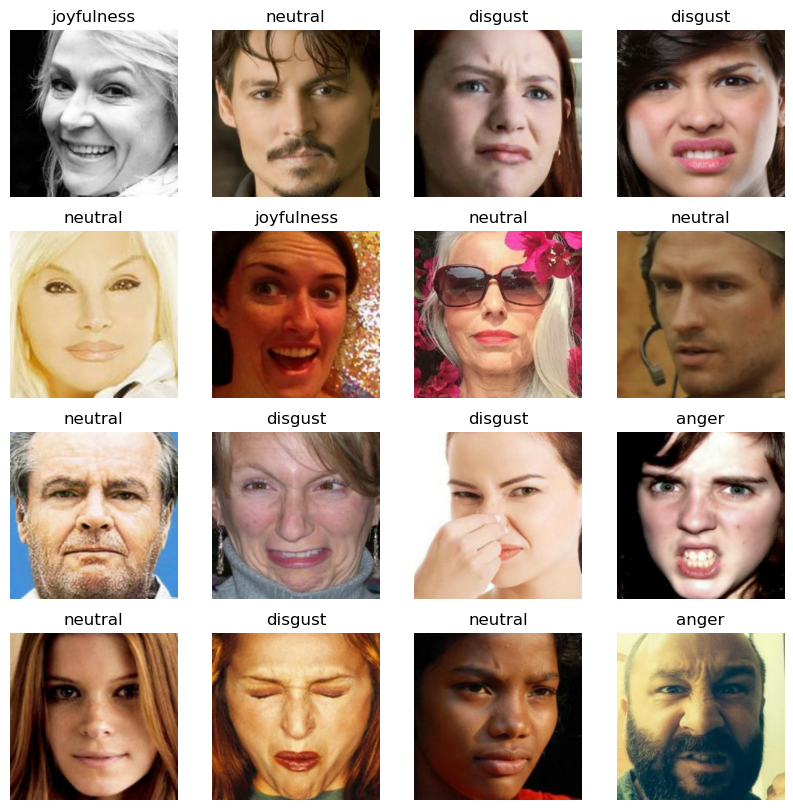

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_batches.take(10):
    for i in range(16):
        ax = plt.subplot(4, 4, i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        category_class = int(tf.argmax(labels[i]))
        plt.title(class_names[category_class])
        plt.axis('off')

Также возьмем одно из изображений из получившегося датасета и посмотрим, получили ли мы желаемое разрешение. Это изображение пригодится нам в дальнейшм, поэтому сохраним его в переменную `one_pic`.

(299, 299, 3)


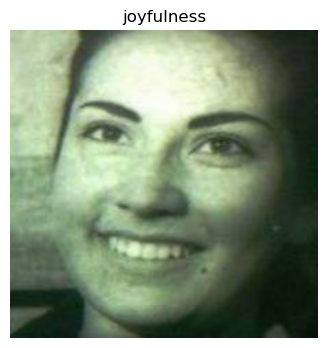

In [ ]:
# одно случайное изображение
for images, labels in train_batches.take(30):
    one_pic = images[1].numpy()
    label = labels[1]
    break

print(one_pic.shape)
plt.figure(figsize=(4, 4))
plt.title(class_names[int(tf.argmax(label))])
plt.axis('off')
plt.imshow(one_pic.astype('uint8'));

Итак, датасет для модели создан, все фотографии приведены к единому разрешению, можно переходить к обработке данных для тренировки модели. Обработка данных для нашей модели состоит из двух частей: нормализация значений массива (`rescale`) и агументация данных. Подготовим обе части и запустим две модели - без аугментации и с ней, чтобы посмотреть, как этот блок слоев влияет на работу модели. 

### Слои для препроцессинга изображений

#### Rescale

Стандартизация значений матриц изображений - обязательная операция, если мы хотим получить хорошие результаты по работе нашей сети. Для использования данной предобученной модели значения матриц изображений необходимо отшкалировать по стандарту от -1 до 1 (именно такой стандарт использовался для обучения этой сети). Есть два способа создания соответствующего слоя:

```python
# для модели InceptionV3
preprocess_input = tf.keras.applications.inception_v3.preprocess_input

или

# для любой модели
rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)
```

In [ ]:
rescale = tf.keras.Sequential([
        tf.keras.layers.Rescaling(1./127.5, offset=-1,
                                  input_shape=IMAGE_SIZE + (3,),
                                  name='Rescaling')
])

Проверим качество работы слоя на фотографии, которую мы использовали выше.

Минимальное и максимальное значение пикселей: -0.9764706 1.0


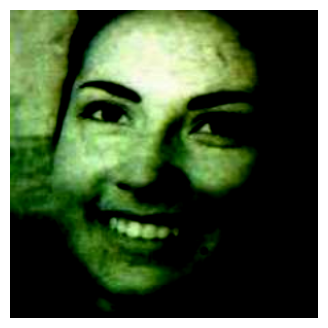

In [ ]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

# увеличим размерность изображения до 4, так иначе оно не пройдет
# корректно через слой
result_for_rescale = rescale(np.expand_dims(one_pic, axis=0))
# print(result_for_rescale.shape)

# вернем результату размерность 3 для отображения
result = np.squeeze(result_for_rescale)
# print(result.shape)

plt.figure(figsize=(4, 4))
plt.axis('off')
plt.imshow(result)

# print("Picture's shape:", result.shape)
print("Минимальное и максимальное значение пикселей:", result.min(), result.max())

Слой отработал ожидаемым образом, при этом видно, что изменился контраст изображения. Это нормально, так как значения матрицы изображений были растянуты по обе стороны от 0. В любом случае, алгоритм обнаруживает зависимости не по внешнему виду картинок, как человеческий глаз, а исходя из числовых значений тензоров изображений.

#### Аугментация данных

Так как наш датасет создан из сравнительно небольшого набора данных, то для избежания переобучения мы воспользуемся всеми доступными возможностями библиотеки `keras`, в частности, добавим в модель слои агументации, которые искусственным образом увеличат количество изображений через внешнее изменение имеющихся. 

Создадим последовательность слоев `RandomFlip` (зеркальное отображение изображения в случайном порядке), `RandomRotation` (поворот изображения по часовой стрелке на случайный угол), `RandomZoom` (увеличение и уменьшение изображения в случайном порядке), а также `RandomContrast` (отключен). 

In [ ]:
data_aug = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal_and_vertical', name='RandomFlip'),
    tf.keras.layers.RandomRotation(factor=1, fill_mode='reflect',
                                   name='RandomRotation'),
    tf.keras.layers.RandomZoom(height_factor=(-0.1, 0.3), name='RandomZoom'),
    # tf.keras.layers.RandomContrast(factor=(0.1, 0.1), name='RandomContrast')
])

Как и в случае с созданием датасета, проверим на уже использованном изображении из тренировочного датасета, как работает последовательность по аугментации данных. Если следующий блок с кодом запустить несколько раз, то мы увидим, как меняется изображение, проходя через вышеописанные слои.

> _**Note**: В версии tf 2.11.0 при выполнении нижеследующего кода выводятся предупреждения, которые не влияют на качество работы модели._

Минимальное и максимальное значение пикселей: -0.93750995 1.0


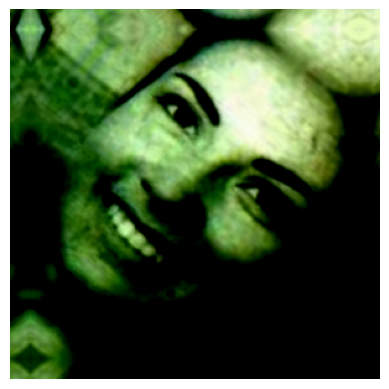

In [ ]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

# увеличим размерность изображения до 4, так иначе оно не пройдет
# корректно через последовательность слоев
result_for_aug = np.expand_dims(result, axis=0)
augmented = data_aug(result_for_aug).numpy()
# print(augmented.shape)

plt.axis('off')

# вернем результату размерность 3 для отображения
plt.imshow(np.squeeze(augmented));

print("Минимальное и максимальное значение пикселей:", augmented.min(), augmented.max())

Итак, обе последовательности успешно справляются с поставленными перед ними задачами. Переходим к созданию и обучению моделей.

## Оптимизация работы кэша

In [ ]:
train_batches = train_batches.cache().prefetch(buffer_size=1)
validation_batches = validation_batches.cache().prefetch(buffer_size=1)

# <b>2.2 МОДЕЛИ</b>

# <b>2.2.1 PyTorch</b>

## <b>Модель 2.2.1.1 | Resnet18</b>

Модель Resnet18. По рекомендациям разработчика, теперь надо указывать не pretrained=True, а предобученные веса модели.

## Замороженные слои

### Архитектура модели

In [ ]:
model_conv = torchvision.models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
for param in model_conv.parameters():
    param.requires_grad = False  # Заморозим слои и проверим качество предсказаний

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, len(class_names))

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

scheduler = get_scheduler(optimizer_conv)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 171MB/s]


In [ ]:
# Вывод информации о модели с помощью torchinfo
summary(model=model_conv, 
        input_size=(8, 3, 224, 224), # входной батч
        col_names=["input_size", "output_size", "num_params"], # что хотим посмотреть
        col_width=20
)

/usr/local/lib/python3.9/dist-packages/torchinfo/torchinfo.py:477: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  action_fn=lambda data: sys.getsizeof(data.storage()),
/usr/local/lib/python3.9/dist-packages/torch/storage.py:665: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return super().__sizeof__() + self.nbytes()


Layer (type:depth-idx)                   Input Shape          Output Shape         Param #
ResNet                                   [8, 3, 224, 224]     [8, 5]               --
├─Conv2d: 1-1                            [8, 3, 224, 224]     [8, 64, 112, 112]    (9,408)
├─BatchNorm2d: 1-2                       [8, 64, 112, 112]    [8, 64, 112, 112]    (128)
├─ReLU: 1-3                              [8, 64, 112, 112]    [8, 64, 112, 112]    --
├─MaxPool2d: 1-4                         [8, 64, 112, 112]    [8, 64, 56, 56]      --
├─Sequential: 1-5                        [8, 64, 56, 56]      [8, 64, 56, 56]      --
│    └─BasicBlock: 2-1                   [8, 64, 56, 56]      [8, 64, 56, 56]      --
│    │    └─Conv2d: 3-1                  [8, 64, 56, 56]      [8, 64, 56, 56]      (36,864)
│    │    └─BatchNorm2d: 3-2             [8, 64, 56, 56]      [8, 64, 56, 56]      (128)
│    │    └─ReLU: 3-3                    [8, 64, 56, 56]      [8, 64, 56, 56]      --
│    │    └─Conv2d: 3-4         

### Обучение модели

In [ ]:
model_conv, loss_hist, F1_hist = train_model(model_conv, criterion, optimizer_conv,
                         scheduler, num_epochs=CFG.epochs)

Epoch 0/29
----------


100%|██████████| 135/135 [00:06<00:00, 22.21it/s]


train   |   Loss: 1.5524  |  Acc: 0.3481   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 25.25it/s]


validation   |   Loss: 1.2455  |  Acc: 0.4906   |   F1: 0.8571

Epoch 1/29
----------


100%|██████████| 135/135 [00:05<00:00, 26.05it/s]


train   |   Loss: 1.3555  |  Acc: 0.4407   |   F1: 0.5000


100%|██████████| 20/20 [00:01<00:00, 13.23it/s]


validation   |   Loss: 1.2144  |  Acc: 0.4969   |   F1: 0.7143

Epoch 2/29
----------


100%|██████████| 135/135 [00:08<00:00, 16.77it/s]


train   |   Loss: 1.3270  |  Acc: 0.4602   |   F1: 0.5000


100%|██████████| 20/20 [00:01<00:00, 13.64it/s]


validation   |   Loss: 1.1140  |  Acc: 0.5472   |   F1: 0.5714

Epoch 3/29
----------


100%|██████████| 135/135 [00:06<00:00, 20.36it/s]


train   |   Loss: 1.2873  |  Acc: 0.4852   |   F1: 0.8750


100%|██████████| 20/20 [00:02<00:00,  9.79it/s]


validation   |   Loss: 1.2090  |  Acc: 0.5535   |   F1: 0.7143

Epoch 4/29
----------


100%|██████████| 135/135 [00:05<00:00, 24.74it/s]


train   |   Loss: 1.2316  |  Acc: 0.4972   |   F1: 0.2500


100%|██████████| 20/20 [00:00<00:00, 25.98it/s]


validation   |   Loss: 1.1447  |  Acc: 0.5975   |   F1: 0.7143

Epoch 5/29
----------


100%|██████████| 135/135 [00:03<00:00, 37.77it/s]


train   |   Loss: 1.2245  |  Acc: 0.5139   |   F1: 0.6250


100%|██████████| 20/20 [00:00<00:00, 26.12it/s]


validation   |   Loss: 1.1271  |  Acc: 0.5849   |   F1: 0.7143

Epoch 6/29
----------


100%|██████████| 135/135 [00:04<00:00, 29.54it/s]


train   |   Loss: 1.2118  |  Acc: 0.5306   |   F1: 1.0000


100%|██████████| 20/20 [00:01<00:00, 15.58it/s]


validation   |   Loss: 1.0877  |  Acc: 0.6101   |   F1: 0.7143

Epoch 7/29
----------


100%|██████████| 135/135 [00:03<00:00, 38.12it/s]


train   |   Loss: 1.1937  |  Acc: 0.5407   |   F1: 0.6250


100%|██████████| 20/20 [00:00<00:00, 25.39it/s]


validation   |   Loss: 0.9994  |  Acc: 0.6038   |   F1: 0.4286

Epoch 8/29
----------


100%|██████████| 135/135 [00:03<00:00, 37.93it/s]


train   |   Loss: 1.1789  |  Acc: 0.5296   |   F1: 0.1250


100%|██████████| 20/20 [00:00<00:00, 26.03it/s]


validation   |   Loss: 1.0556  |  Acc: 0.5786   |   F1: 0.8571

Epoch 9/29
----------


100%|██████████| 135/135 [00:04<00:00, 27.06it/s]


train   |   Loss: 1.1526  |  Acc: 0.5574   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 21.32it/s]


validation   |   Loss: 1.0649  |  Acc: 0.6101   |   F1: 0.8571

Epoch 10/29
----------


100%|██████████| 135/135 [00:03<00:00, 37.59it/s]


train   |   Loss: 1.1701  |  Acc: 0.5500   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 24.25it/s]


validation   |   Loss: 1.1415  |  Acc: 0.5220   |   F1: 0.7143

Epoch 11/29
----------


100%|██████████| 135/135 [00:03<00:00, 38.62it/s]


train   |   Loss: 1.1633  |  Acc: 0.5528   |   F1: 0.3750


100%|██████████| 20/20 [00:00<00:00, 24.50it/s]


validation   |   Loss: 1.0159  |  Acc: 0.6101   |   F1: 0.7143

Epoch 12/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.55it/s]


train   |   Loss: 1.1796  |  Acc: 0.5435   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 24.87it/s]


validation   |   Loss: 1.0517  |  Acc: 0.5849   |   F1: 0.7143

Epoch 13/29
----------


100%|██████████| 135/135 [00:03<00:00, 38.37it/s]


train   |   Loss: 1.1809  |  Acc: 0.5593   |   F1: 0.5000


100%|██████████| 20/20 [00:00<00:00, 25.17it/s]


validation   |   Loss: 1.0979  |  Acc: 0.6038   |   F1: 0.4286

Epoch 14/29
----------


100%|██████████| 135/135 [00:03<00:00, 36.45it/s]


train   |   Loss: 1.1321  |  Acc: 0.5704   |   F1: 0.6250


100%|██████████| 20/20 [00:00<00:00, 21.32it/s]


validation   |   Loss: 1.0330  |  Acc: 0.6101   |   F1: 0.7143

Epoch 15/29
----------


100%|██████████| 135/135 [00:04<00:00, 27.42it/s]


train   |   Loss: 1.1447  |  Acc: 0.5528   |   F1: 0.2500


100%|██████████| 20/20 [00:00<00:00, 25.06it/s]


validation   |   Loss: 0.9613  |  Acc: 0.6164   |   F1: 0.7143

Epoch 16/29
----------


100%|██████████| 135/135 [00:03<00:00, 35.23it/s]


train   |   Loss: 1.1512  |  Acc: 0.5602   |   F1: 0.5000


100%|██████████| 20/20 [00:01<00:00, 18.89it/s]


validation   |   Loss: 0.9462  |  Acc: 0.6226   |   F1: 0.7143

Epoch 17/29
----------


100%|██████████| 135/135 [00:04<00:00, 31.93it/s]


train   |   Loss: 1.0972  |  Acc: 0.5657   |   F1: 0.7500


100%|██████████| 20/20 [00:01<00:00, 14.81it/s]


validation   |   Loss: 1.1010  |  Acc: 0.5849   |   F1: 0.7143

Epoch 18/29
----------


100%|██████████| 135/135 [00:04<00:00, 33.64it/s]


train   |   Loss: 1.1481  |  Acc: 0.5546   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 25.60it/s]


validation   |   Loss: 1.0993  |  Acc: 0.5786   |   F1: 0.2857

Epoch 19/29
----------


100%|██████████| 135/135 [00:03<00:00, 38.43it/s]


train   |   Loss: 1.1594  |  Acc: 0.5611   |   F1: 0.6250


100%|██████████| 20/20 [00:00<00:00, 24.99it/s]


validation   |   Loss: 1.0640  |  Acc: 0.5723   |   F1: 0.2857

Epoch 20/29
----------


100%|██████████| 135/135 [00:04<00:00, 28.51it/s]


train   |   Loss: 1.0196  |  Acc: 0.6093   |   F1: 1.0000


100%|██████████| 20/20 [00:01<00:00, 15.86it/s]


validation   |   Loss: 0.9535  |  Acc: 0.6038   |   F1: 0.7143

Epoch 21/29
----------


100%|██████████| 135/135 [00:03<00:00, 37.46it/s]


train   |   Loss: 1.0167  |  Acc: 0.5991   |   F1: 0.6250


100%|██████████| 20/20 [00:00<00:00, 24.90it/s]


validation   |   Loss: 0.9748  |  Acc: 0.6226   |   F1: 0.4286

Epoch 22/29
----------


100%|██████████| 135/135 [00:03<00:00, 37.22it/s]


train   |   Loss: 1.0214  |  Acc: 0.6019   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 24.56it/s]


validation   |   Loss: 0.9601  |  Acc: 0.6038   |   F1: 1.0000

Epoch 23/29
----------


100%|██████████| 135/135 [00:05<00:00, 26.38it/s]


train   |   Loss: 1.0449  |  Acc: 0.5917   |   F1: 0.5000


100%|██████████| 20/20 [00:00<00:00, 21.57it/s]


validation   |   Loss: 0.9783  |  Acc: 0.6289   |   F1: 0.8571

Epoch 24/29
----------


100%|██████████| 135/135 [00:03<00:00, 37.47it/s]


train   |   Loss: 1.0492  |  Acc: 0.5861   |   F1: 0.5000


100%|██████████| 20/20 [00:00<00:00, 25.96it/s]


validation   |   Loss: 0.9723  |  Acc: 0.6352   |   F1: 0.5714

Epoch 25/29
----------


100%|██████████| 135/135 [00:03<00:00, 38.32it/s]


train   |   Loss: 1.0082  |  Acc: 0.6241   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 25.62it/s]


validation   |   Loss: 0.9678  |  Acc: 0.6478   |   F1: 0.5714

Epoch 26/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.47it/s]


train   |   Loss: 1.0589  |  Acc: 0.5889   |   F1: 0.3750


100%|██████████| 20/20 [00:00<00:00, 24.31it/s]


validation   |   Loss: 0.9959  |  Acc: 0.6038   |   F1: 0.5714

Epoch 27/29
----------


100%|██████████| 135/135 [00:03<00:00, 37.94it/s]


train   |   Loss: 1.0198  |  Acc: 0.5944   |   F1: 0.5000


100%|██████████| 20/20 [00:00<00:00, 25.02it/s]


validation   |   Loss: 0.9659  |  Acc: 0.6352   |   F1: 0.7143

Epoch 28/29
----------


100%|██████████| 135/135 [00:03<00:00, 37.77it/s]


train   |   Loss: 1.0409  |  Acc: 0.5898   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 25.90it/s]


validation   |   Loss: 0.9792  |  Acc: 0.6415   |   F1: 0.7143

Epoch 29/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.78it/s]


train   |   Loss: 1.0640  |  Acc: 0.5815   |   F1: 0.3750


100%|██████████| 20/20 [00:00<00:00, 25.64it/s]

validation   |   Loss: 0.9626  |  Acc: 0.6352   |   F1: 0.4286

Training complete in 2m 43s
Best val Acc: 0.647799


### Визуализация данных по работе алгоритма

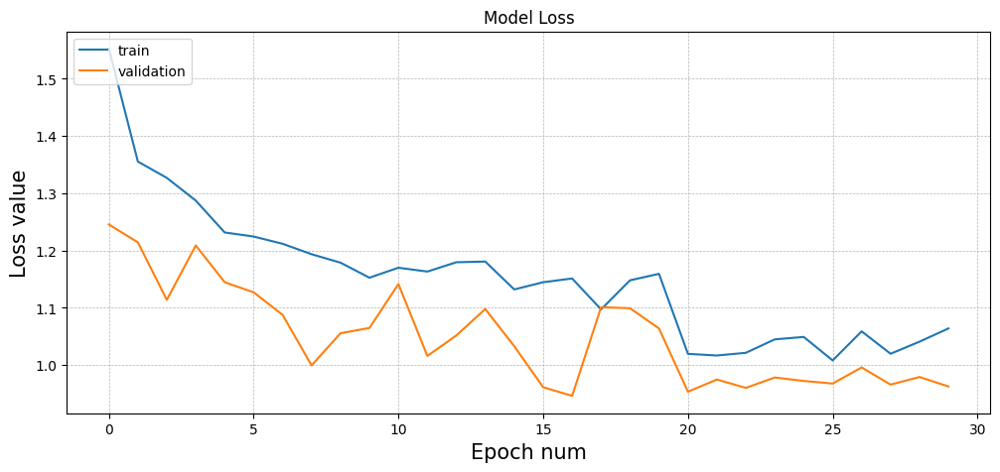

In [ ]:
plt.rcParams['figure.figsize'] = (12, 5)
for experiment_id in loss_hist.keys():
    plt.plot(loss_hist[experiment_id], label=experiment_id)
plt.legend(loc='upper left')
plt.title('Model Loss')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('Loss value', fontsize=15);
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

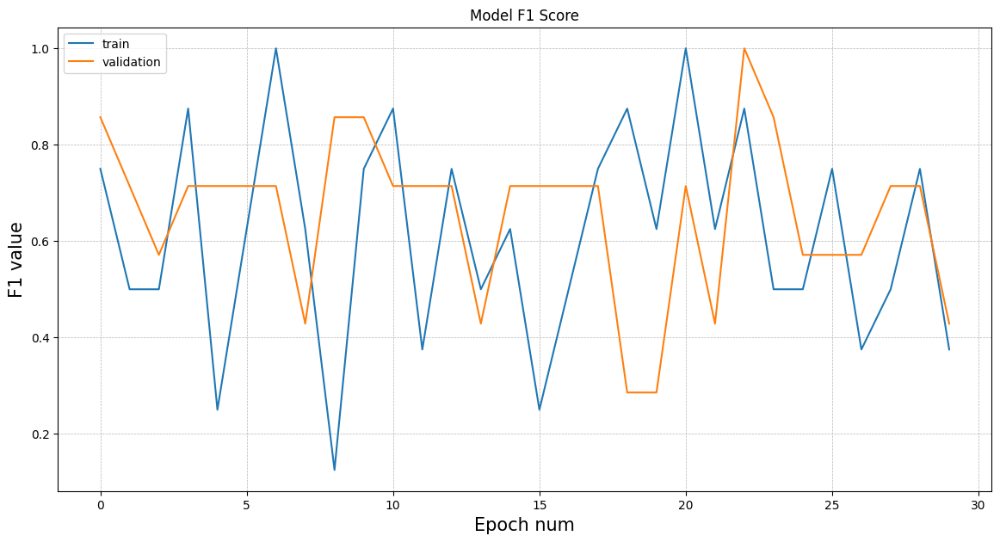

In [ ]:
plt.rcParams['figure.figsize'] = (14, 7)
for experiment_id in F1_hist.keys():
    plt.plot(F1_hist[experiment_id], label=experiment_id)
plt.legend(loc='upper left')
plt.title('Model F1 Score')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('F1 value', fontsize=15);
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

### Предсказания модели

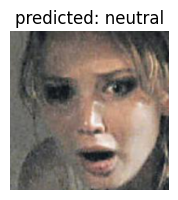

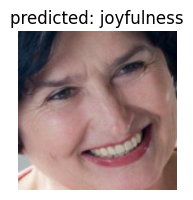

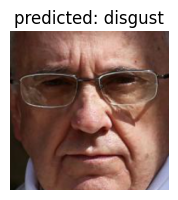

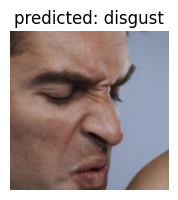

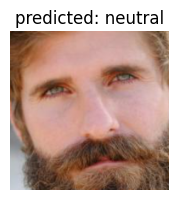

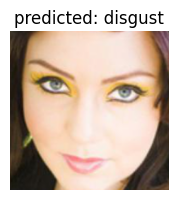

In [ ]:
visualize_model(model_conv)

plt.ioff()
plt.show()

По изображениям видно, что модель сделала ошибки.

### Матрица ошибок

F1-Score macro:  0.6083723522853958
F1-Score micro:  0.660377358490566
F1-Score weighted:  0.6452636671504596
[20.         82.35294118 70.         71.79487179 67.39130435]


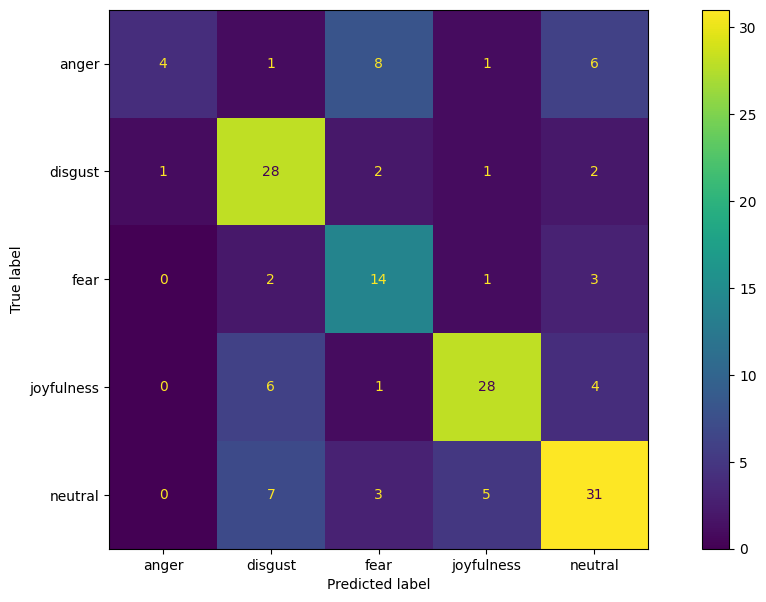

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import f1_score

# Initialize the prediction and label lists(tensors)
predlist=torch.zeros(0,dtype=torch.long, device='cpu')
lbllist=torch.zeros(0,dtype=torch.long, device='cpu')

with torch.no_grad():
    for i, (inputs, classes) in enumerate(dataloaders['validation']):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = model_conv(inputs)
        _, preds = torch.max(outputs, 1)

        # Append batch prediction results
        predlist=torch.cat([predlist,preds.view(-1).cpu()])
        lbllist=torch.cat([lbllist,classes.view(-1).cpu()])

print('F1-Score macro: ',f1_score(lbllist.numpy(), predlist.numpy(), average='macro'))
print('F1-Score micro: ',f1_score(lbllist.numpy(), predlist.numpy(), average='micro'))
print('F1-Score weighted: ',f1_score(lbllist.numpy(), predlist.numpy(), average='weighted'))

# Confusion matrix
conf_mat=confusion_matrix(lbllist.numpy(), predlist.numpy())
#print(conf_mat)
print('========================================================')

# Per-class accuracy
class_accuracy=100*conf_mat.diagonal()/conf_mat.sum(1)
print(class_accuracy)
print('========================================================')

disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat, display_labels=class_names)
disp.plot()
plt.show()

## Разморозка слоев

### Архитектура модели

Предобученная модель Resnet18. По рекомендациям разработчика, теперь надо указывать не pretrained=True, а предобученные веса модели.

In [ ]:
model_ft = models.resnet18(weights=models.ResNet18_Weights.DEFAULT) #pretrained=True. Рекомендации разработчика использовать веса, вместо pretrained=True

num_ftrs = model_ft.fc.in_features

model_ft.fc = nn.Linear(num_ftrs, len(class_names))

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)

scheduler = get_scheduler(optimizer_ft)



In [ ]:
# Вывод информации о модели с помощью torchinfo
summary(model=model_ft, 
        input_size=(8, 3, 224, 224), # входной батч
        col_names=["input_size", "output_size", "num_params"], # что хотим посмотреть
        col_width=20
)

Layer (type:depth-idx)                   Input Shape          Output Shape         Param #
ResNet                                   [8, 3, 224, 224]     [8, 5]               --
├─Conv2d: 1-1                            [8, 3, 224, 224]     [8, 64, 112, 112]    9,408
├─BatchNorm2d: 1-2                       [8, 64, 112, 112]    [8, 64, 112, 112]    128
├─ReLU: 1-3                              [8, 64, 112, 112]    [8, 64, 112, 112]    --
├─MaxPool2d: 1-4                         [8, 64, 112, 112]    [8, 64, 56, 56]      --
├─Sequential: 1-5                        [8, 64, 56, 56]      [8, 64, 56, 56]      --
│    └─BasicBlock: 2-1                   [8, 64, 56, 56]      [8, 64, 56, 56]      --
│    │    └─Conv2d: 3-1                  [8, 64, 56, 56]      [8, 64, 56, 56]      36,864
│    │    └─BatchNorm2d: 3-2             [8, 64, 56, 56]      [8, 64, 56, 56]      128
│    │    └─ReLU: 3-3                    [8, 64, 56, 56]      [8, 64, 56, 56]      --
│    │    └─Conv2d: 3-4                 

### Обучение модели

In [ ]:
model_ft, loss_hist, F1_hist = train_model(model_ft, criterion, optimizer_ft, scheduler,
                       num_epochs=CFG.epochs)

Epoch 0/29
----------


100%|██████████| 135/135 [00:06<00:00, 21.68it/s]


train   |   Loss: 1.4726  |  Acc: 0.3944   |   F1: 0.7500


100%|██████████| 20/20 [00:01<00:00, 12.58it/s]


validation   |   Loss: 0.8536  |  Acc: 0.6730   |   F1: 0.8571

Epoch 1/29
----------


100%|██████████| 135/135 [00:09<00:00, 13.69it/s]


train   |   Loss: 1.1021  |  Acc: 0.5611   |   F1: 0.3750


100%|██████████| 20/20 [00:01<00:00, 14.19it/s]


validation   |   Loss: 0.9583  |  Acc: 0.6541   |   F1: 0.7143

Epoch 2/29
----------


100%|██████████| 135/135 [00:08<00:00, 15.55it/s]


train   |   Loss: 1.0197  |  Acc: 0.6083   |   F1: 1.0000


100%|██████████| 20/20 [00:01<00:00, 15.58it/s]


validation   |   Loss: 0.5065  |  Acc: 0.7987   |   F1: 1.0000

Epoch 3/29
----------


100%|██████████| 135/135 [00:05<00:00, 26.03it/s]


train   |   Loss: 0.8902  |  Acc: 0.6481   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 24.31it/s]


validation   |   Loss: 0.5812  |  Acc: 0.7799   |   F1: 0.7143

Epoch 4/29
----------


100%|██████████| 135/135 [00:05<00:00, 23.74it/s]


train   |   Loss: 0.7841  |  Acc: 0.7046   |   F1: 0.7500


100%|██████████| 20/20 [00:01<00:00, 14.97it/s]


validation   |   Loss: 0.6138  |  Acc: 0.7925   |   F1: 0.8571

Epoch 5/29
----------


100%|██████████| 135/135 [00:05<00:00, 24.13it/s]


train   |   Loss: 0.7377  |  Acc: 0.7222   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 24.42it/s]


validation   |   Loss: 0.4614  |  Acc: 0.8365   |   F1: 0.5714

Epoch 6/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.22it/s]


train   |   Loss: 0.6769  |  Acc: 0.7472   |   F1: 0.8750


100%|██████████| 20/20 [00:01<00:00, 14.22it/s]


validation   |   Loss: 0.5266  |  Acc: 0.8113   |   F1: 0.8571

Epoch 7/29
----------


100%|██████████| 135/135 [00:05<00:00, 23.04it/s]


train   |   Loss: 0.6652  |  Acc: 0.7556   |   F1: 0.6250


100%|██████████| 20/20 [00:00<00:00, 24.73it/s]


validation   |   Loss: 0.4439  |  Acc: 0.8365   |   F1: 1.0000

Epoch 8/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.08it/s]


train   |   Loss: 0.5930  |  Acc: 0.7843   |   F1: 0.7500


100%|██████████| 20/20 [00:01<00:00, 14.02it/s]


validation   |   Loss: 0.5551  |  Acc: 0.8302   |   F1: 0.8571

Epoch 9/29
----------


100%|██████████| 135/135 [00:05<00:00, 23.16it/s]


train   |   Loss: 0.5635  |  Acc: 0.7926   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 24.21it/s]


validation   |   Loss: 0.4582  |  Acc: 0.8491   |   F1: 0.8571

Epoch 10/29
----------


100%|██████████| 135/135 [00:05<00:00, 26.01it/s]


train   |   Loss: 0.5714  |  Acc: 0.7926   |   F1: 1.0000


100%|██████████| 20/20 [00:01<00:00, 16.59it/s]


validation   |   Loss: 0.4558  |  Acc: 0.8616   |   F1: 0.7143

Epoch 11/29
----------


100%|██████████| 135/135 [00:06<00:00, 21.78it/s]


train   |   Loss: 0.5755  |  Acc: 0.7769   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 24.64it/s]


validation   |   Loss: 0.4964  |  Acc: 0.8553   |   F1: 0.8571

Epoch 12/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.70it/s]


train   |   Loss: 0.5464  |  Acc: 0.8028   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 21.10it/s]


validation   |   Loss: 0.4710  |  Acc: 0.8491   |   F1: 0.8571

Epoch 13/29
----------


100%|██████████| 135/135 [00:06<00:00, 20.99it/s]


train   |   Loss: 0.5091  |  Acc: 0.8130   |   F1: 0.6250


100%|██████████| 20/20 [00:00<00:00, 24.69it/s]


validation   |   Loss: 0.3847  |  Acc: 0.8742   |   F1: 1.0000

Epoch 14/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.72it/s]


train   |   Loss: 0.4706  |  Acc: 0.8287   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 23.59it/s]


validation   |   Loss: 0.4047  |  Acc: 0.8365   |   F1: 0.8571

Epoch 15/29
----------


100%|██████████| 135/135 [00:06<00:00, 20.41it/s]


train   |   Loss: 0.4729  |  Acc: 0.8324   |   F1: 0.5000


100%|██████████| 20/20 [00:00<00:00, 24.32it/s]


validation   |   Loss: 0.4622  |  Acc: 0.8553   |   F1: 0.7143

Epoch 16/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.76it/s]


train   |   Loss: 0.4416  |  Acc: 0.8426   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 24.75it/s]


validation   |   Loss: 0.4284  |  Acc: 0.8553   |   F1: 0.7143

Epoch 17/29
----------


100%|██████████| 135/135 [00:06<00:00, 20.39it/s]


train   |   Loss: 0.4244  |  Acc: 0.8528   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 24.47it/s]


validation   |   Loss: 0.5424  |  Acc: 0.8491   |   F1: 0.8571

Epoch 18/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.69it/s]


train   |   Loss: 0.4453  |  Acc: 0.8333   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 25.33it/s]


validation   |   Loss: 0.4023  |  Acc: 0.8931   |   F1: 1.0000

Epoch 19/29
----------


100%|██████████| 135/135 [00:06<00:00, 20.79it/s]


train   |   Loss: 0.4653  |  Acc: 0.8287   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 24.26it/s]


validation   |   Loss: 0.3882  |  Acc: 0.8616   |   F1: 0.8571

Epoch 20/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.60it/s]


train   |   Loss: 0.3620  |  Acc: 0.8648   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 24.69it/s]


validation   |   Loss: 0.3184  |  Acc: 0.8805   |   F1: 1.0000

Epoch 21/29
----------


100%|██████████| 135/135 [00:06<00:00, 20.88it/s]


train   |   Loss: 0.3001  |  Acc: 0.8935   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 23.15it/s]


validation   |   Loss: 0.3209  |  Acc: 0.8868   |   F1: 1.0000

Epoch 22/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.81it/s]


train   |   Loss: 0.3422  |  Acc: 0.8796   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 24.68it/s]


validation   |   Loss: 0.3276  |  Acc: 0.8742   |   F1: 1.0000

Epoch 23/29
----------


100%|██████████| 135/135 [00:06<00:00, 21.56it/s]


train   |   Loss: 0.3213  |  Acc: 0.8926   |   F1: 1.0000


100%|██████████| 20/20 [00:01<00:00, 17.03it/s]


validation   |   Loss: 0.3074  |  Acc: 0.8868   |   F1: 1.0000

Epoch 24/29
----------


100%|██████████| 135/135 [00:05<00:00, 25.67it/s]


train   |   Loss: 0.3030  |  Acc: 0.8806   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 24.63it/s]


validation   |   Loss: 0.3111  |  Acc: 0.8931   |   F1: 0.8571

Epoch 25/29
----------


100%|██████████| 135/135 [00:05<00:00, 22.64it/s]


train   |   Loss: 0.2947  |  Acc: 0.8889   |   F1: 0.7500


100%|██████████| 20/20 [00:01<00:00, 15.56it/s]


validation   |   Loss: 0.3037  |  Acc: 0.8868   |   F1: 0.8571

Epoch 26/29
----------


100%|██████████| 135/135 [00:05<00:00, 24.65it/s]


train   |   Loss: 0.3192  |  Acc: 0.8889   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 23.34it/s]


validation   |   Loss: 0.3208  |  Acc: 0.9057   |   F1: 0.8571

Epoch 27/29
----------


100%|██████████| 135/135 [00:05<00:00, 22.97it/s]


train   |   Loss: 0.2973  |  Acc: 0.8935   |   F1: 0.7500


100%|██████████| 20/20 [00:01<00:00, 14.47it/s]


validation   |   Loss: 0.3100  |  Acc: 0.8931   |   F1: 1.0000

Epoch 28/29
----------


100%|██████████| 135/135 [00:05<00:00, 24.59it/s]


train   |   Loss: 0.3317  |  Acc: 0.8759   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 23.96it/s]


validation   |   Loss: 0.3217  |  Acc: 0.8931   |   F1: 0.8571

Epoch 29/29
----------


100%|██████████| 135/135 [00:05<00:00, 24.11it/s]


train   |   Loss: 0.2883  |  Acc: 0.8954   |   F1: 0.8750


100%|██████████| 20/20 [00:01<00:00, 14.30it/s]

validation   |   Loss: 0.3498  |  Acc: 0.8742   |   F1: 1.0000

Training complete in 3m 31s
Best val Acc: 0.905660


### Визуализация данных по работе алгоритма

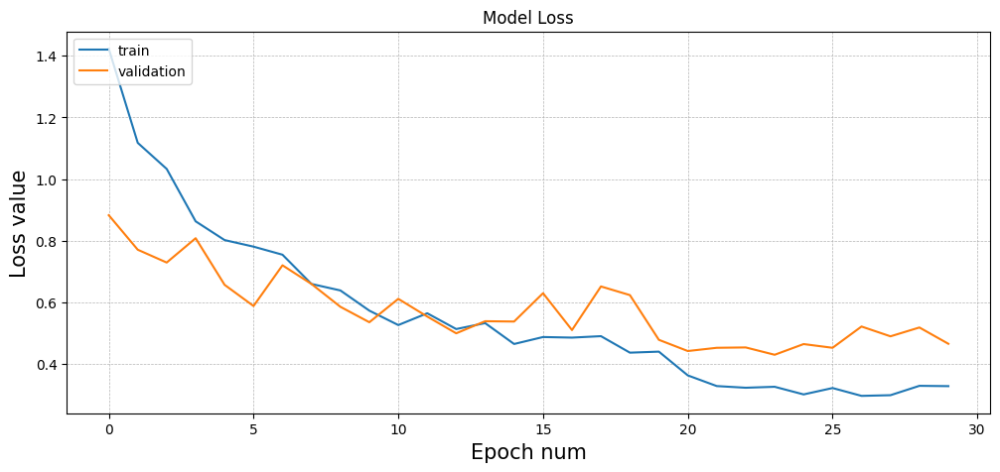

In [ ]:
plt.rcParams['figure.figsize'] = (12, 5)
for experiment_id in loss_hist.keys():
    plt.plot(loss_hist[experiment_id], label=experiment_id)
plt.legend(loc='upper left')
plt.title('Model Loss')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('Loss value', fontsize=15);
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

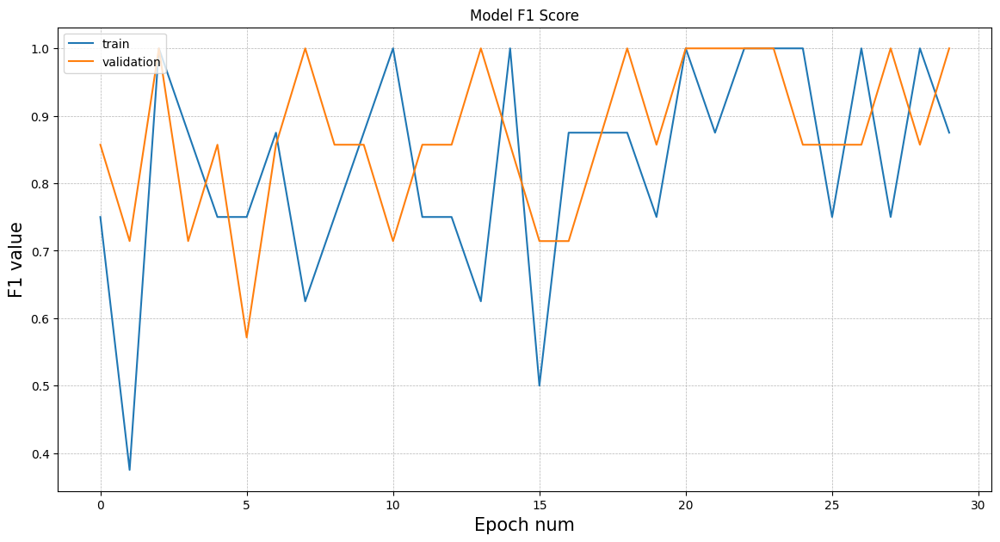

In [ ]:
plt.rcParams['figure.figsize'] = (14, 7)
for experiment_id in F1_hist.keys():
    plt.plot(F1_hist[experiment_id], label=experiment_id)
plt.legend(loc='upper left')
plt.title('Model F1 Score')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('F1 value', fontsize=15);
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

### Предсказания модели

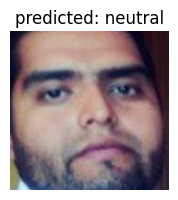

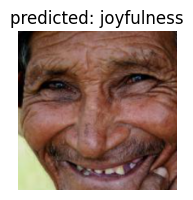

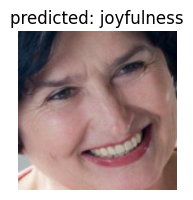

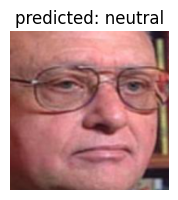

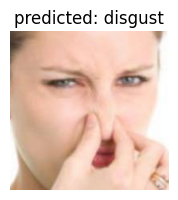

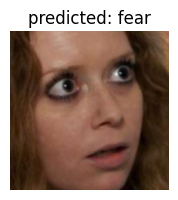

In [ ]:
visualize_model(model_ft)

По изображениям видно, что модель отлично справилась с поставленной задачей.

### Матрица ошибок

F1-Score macro:  0.8517909330812558
F1-Score micro:  0.8742138364779874
F1-Score weighted:  0.8746319841876751
[75.         73.52941176 95.         94.87179487 93.47826087]


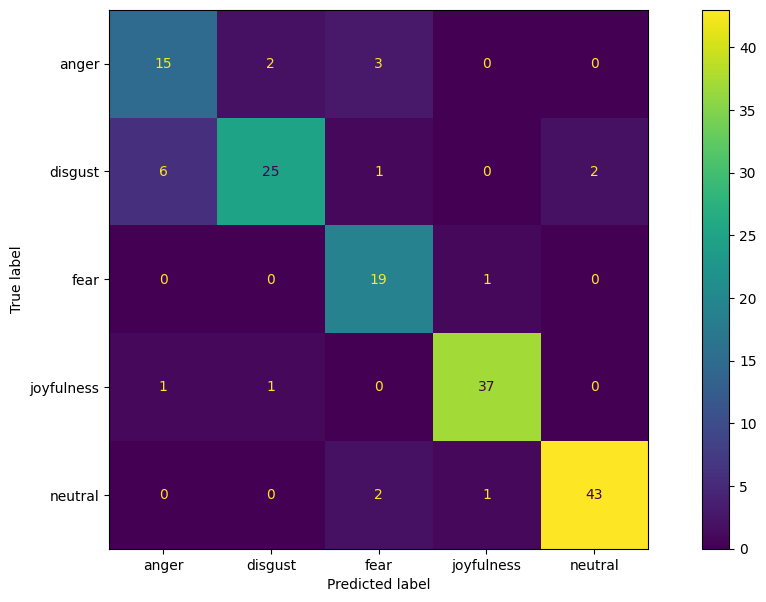

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import f1_score

# Initialize the prediction and label lists(tensors)
predlist=torch.zeros(0,dtype=torch.long, device='cpu')
lbllist=torch.zeros(0,dtype=torch.long, device='cpu')

with torch.no_grad():
    for i, (inputs, classes) in enumerate(dataloaders['validation']):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = model_ft(inputs)
        _, preds = torch.max(outputs, 1)

        # Append batch prediction results
        predlist=torch.cat([predlist,preds.view(-1).cpu()])
        lbllist=torch.cat([lbllist,classes.view(-1).cpu()])


print('F1-Score macro: ',f1_score(lbllist.numpy(), predlist.numpy(), average='macro'))
print('F1-Score micro: ',f1_score(lbllist.numpy(), predlist.numpy(), average='micro'))
print('F1-Score weighted: ',f1_score(lbllist.numpy(), predlist.numpy(), average='weighted'))
# Confusion matrix
conf_mat=confusion_matrix(lbllist.numpy(), predlist.numpy())
# print(conf_mat)
print('========================================================')

# Per-class accuracy
class_accuracy=100*conf_mat.diagonal()/conf_mat.sum(1)
print(class_accuracy)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat, display_labels=class_names)
disp.plot()
plt.show()

## Выводы по модели ResNet18

В целях эксперимента была взята одна и та же модель, но в одной обратное распространение ошибки было выполнено без заморозки слоев, а в другой только для головы модели.

Модель тренировалась на Imagenet, который не содержит отдельно лиц и эмоций, но при этом модель прекрасно обучена улавливать зависимости, что дало высокий результат при отсутствии слоёв, которые не подлежали бы тренировке. Модель, у которой тренировались все параметры, показала высокий результат даже на очень небольшом датасете, который был собран самостоятельно авторами этой дипломной работы.

Для сравнения:

* метрики модели, где тренировалась только "голова"

```
F1-Score macro:  0.6276550406115624
F1-Score micro:  0.660377358490566
F1-Score weighted:  0.6596140273908937
========================================================
[35.    79.41176471 70.     66.66666667 67.39130435]
========================================================
```

* метрики модели, где тренировались все слои


```
F1-Score macro:  0.8761792721138765
F1-Score micro:  0.89937106918239
F1-Score weighted:  0.9005119558602276
========================================================
[ 80.  88.23529412  80.   100.  91.30434783]
```


Результаты эксперимента говорят сами за себя. Модель ResNet18 отлично подходит для дальнейшей разработки в области комплексного определения эмоций людей.

## <b>Модель 2.2.1.2 | EfficientNet_b0</b>

Приведенный ниже график, взятый из [статьи](https://learnopencv.com/efficientnet-theory-code/), показывает кривую производительности семейства EfficientNet.


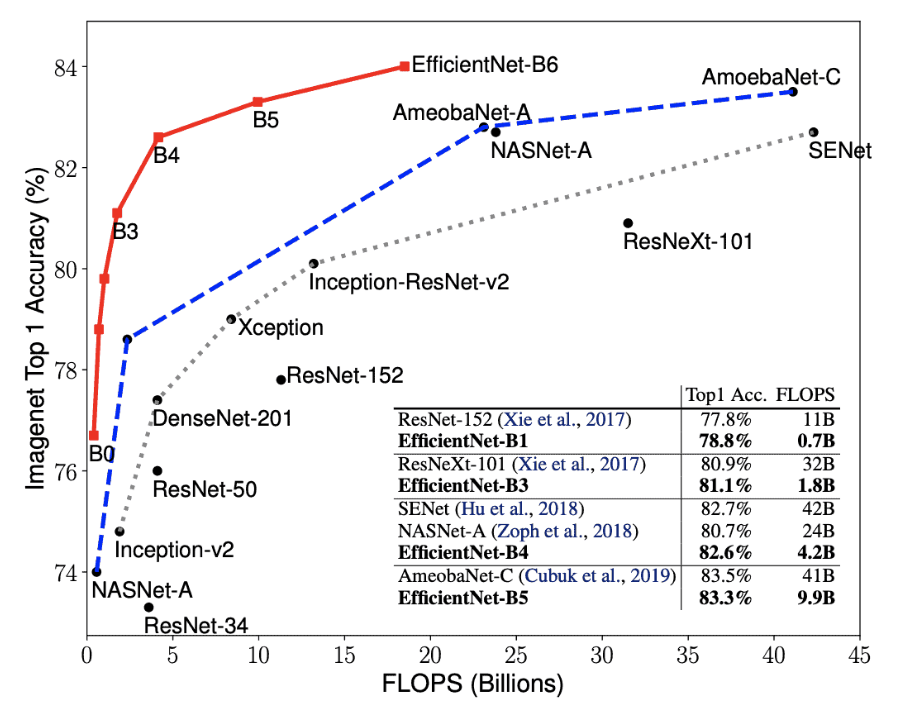

Производительность EfficientNet по сравнению с другими архитектурами CNN. 
Это показывает, что при тех же сбоях точность EfficientNet выше, чем у любой существующей архитектуры. Итак, если вы планируете использовать Inception-v2, вам следует рассмотреть возможность использования EfficientNet-B1 вместо этого. Аналогичным образом, рекомендуется рассмотреть EfficientNet-B2, если вы планируете использовать ResNet-50.

В большинстве реальных приложений люди начинают с предварительно обученной модели и настраивают ее для своего конкретного применения.

Только потому, что EfficientNet превосходит другие сети, означает ли это, что он будет превосходить другие сети в других задачах?

Хорошей новостью является то, что авторы провели эти эксперименты и показали, что при использовании магистрали EfficientNet мы также получаем лучшую производительность в других задачах компьютерного зрения.


Проход обучения предобученной модели без заморозки слоев EfficientNet B0 из библиотеки Timm.

Библиотека Timm предоставляет широкий выбор предобученных моделей для использования с PyTorch. Ниже посмотрим на полный список имеющихся в библиотеке тренированных моделей. Простота доступа делает эту библиотеку максимально удобной для большинства учебных и тренировочных работ.

In [ ]:
# Посмортим какие имеются претренированные модели
timm.list_models(pretrained=True)

['adv_inception_v3',
 'bat_resnext26ts',
 'beit_base_patch16_224',
 'beit_base_patch16_224_in22k',
 'beit_base_patch16_384',
 'beit_large_patch16_224',
 'beit_large_patch16_224_in22k',
 'beit_large_patch16_384',
 'beit_large_patch16_512',
 'beitv2_base_patch16_224',
 'beitv2_base_patch16_224_in22k',
 'beitv2_large_patch16_224',
 'beitv2_large_patch16_224_in22k',
 'botnet26t_256',
 'cait_m36_384',
 'cait_m48_448',
 'cait_s24_224',
 'cait_s24_384',
 'cait_s36_384',
 'cait_xs24_384',
 'cait_xxs24_224',
 'cait_xxs24_384',
 'cait_xxs36_224',
 'cait_xxs36_384',
 'coat_lite_mini',
 'coat_lite_small',
 'coat_lite_tiny',
 'coat_mini',
 'coat_tiny',
 'coatnet_0_rw_224',
 'coatnet_1_rw_224',
 'coatnet_bn_0_rw_224',
 'coatnet_nano_rw_224',
 'coatnet_rmlp_1_rw_224',
 'coatnet_rmlp_2_rw_224',
 'coatnet_rmlp_nano_rw_224',
 'coatnext_nano_rw_224',
 'convit_base',
 'convit_small',
 'convit_tiny',
 'convmixer_768_32',
 'convmixer_1024_20_ks9_p14',
 'convmixer_1536_20',
 'convnext_atto',
 'convnext_atto_

## Размороженные слои

### Архитектура модели

In [ ]:
efficientnet = timm.create_model('efficientnet_b0', pretrained=True)

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/efficientnet_b0_ra-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_ra-3dd342df.pth


In [ ]:
class My_Net_efficientnet_b0(torch.nn.Module):
    def __init__(self, model_name, pretrained=True, effnet=False, value=False):  
        super().__init__()
        self.model = efficientnet

        # Замораживаем веса, чтобы не использовать лишние веса в обучении, а обучать только последний слой
        for param in self.model.parameters(): # Проходим по параметрам модели (каждый параметр - это каждый слой, model.parameters нам отдаст некоторый итератор по слоям)
           #param.requires_grad = True  Для каждого параметра и слоя:"requires grad = False", то есть уже не требуется вычисление градиента для данного слоя. И получается, что у нас вся сетка будет заморожена, то есть мы не сможем вообще ничего обучать            
           #fc_inputs = self.model.classifier.in_features # Добавляем полносвязанную классифицирующую голову
           self.model.classifier = nn.Sequential(
           nn.Linear(1280, 256),
           nn.ReLU(),
           nn.Linear(256, num_classes))


    def forward(self, x):
        x = self.model(x)
        return x

In [ ]:
# Формат pretrained=True - нам нужны веса, которые получились вследствие обучения этой модели на датасете ImageNet
model_efficientnet_b0 = My_Net_efficientnet_b0(model_name = 'efficientnet_b0', pretrained=True)

# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model_efficientnet_b0 = model_efficientnet_b0.to(device)
 
# Определяем Loss функцию
# В данном случае - это кросс-энтропия
criterion = torch.nn.CrossEntropyLoss()
# Метод градиентного спуска AdamW
optimizer = torch.optim.AdamW(model_efficientnet_b0.parameters(), lr=CFG.lr) 

scheduler = get_scheduler(optimizer)

In [ ]:
print(model_efficientnet_b0)

My_Net_efficientnet_b0(
  (model): EfficientNet(
    (conv_stem): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNormAct2d(
      32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): SiLU(inplace=True)
    )
    (blocks): Sequential(
      (0): Sequential(
        (0): DepthwiseSeparableConv(
          (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (bn1): BatchNormAct2d(
            32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
            (drop): Identity()
            (act): SiLU(inplace=True)
          )
          (se): SqueezeExcite(
            (conv_reduce): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (act1): SiLU(inplace=True)
            (conv_expand): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (gate): Sigmoid()
          )
          (conv_pw): Conv2d(32, 16, kerne

In [ ]:
summary(model=model_efficientnet_b0, 
        input_size=(8, 3, 256, 256), # входной батч
        col_names=["input_size", "output_size", "num_params"],
        col_width=20
)

Layer (type:depth-idx)                             Input Shape          Output Shape         Param #
My_Net_efficientnet_b0                             [8, 3, 256, 256]     [8, 5]               --
├─EfficientNet: 1-1                                [8, 3, 256, 256]     [8, 5]               --
│    └─Conv2d: 2-1                                 [8, 3, 256, 256]     [8, 32, 128, 128]    864
│    └─BatchNormAct2d: 2-2                         [8, 32, 128, 128]    [8, 32, 128, 128]    64
│    │    └─Identity: 3-1                          [8, 32, 128, 128]    [8, 32, 128, 128]    --
│    │    └─SiLU: 3-2                              [8, 32, 128, 128]    [8, 32, 128, 128]    --
│    └─Sequential: 2-3                             [8, 32, 128, 128]    [8, 320, 8, 8]       --
│    │    └─Sequential: 3-3                        [8, 32, 128, 128]    [8, 16, 128, 128]    1,448
│    │    └─Sequential: 3-4                        [8, 16, 128, 128]    [8, 24, 64, 64]      16,714
│    │    └─Sequential: 3-5

### Обучение модели

In [ ]:
model, loss_hist, F1_hist = train_model(model_efficientnet_b0, criterion, optimizer, scheduler, num_epochs=CFG.epochs)

Epoch 0/29
----------


100%|██████████| 135/135 [00:13<00:00,  9.76it/s]


train   |   Loss: 1.4116  |  Acc: 0.4120   |   F1: 0.6250


100%|██████████| 20/20 [00:01<00:00, 13.62it/s]


validation   |   Loss: 0.9216  |  Acc: 0.6541   |   F1: 0.8571

Epoch 1/29
----------


100%|██████████| 135/135 [00:10<00:00, 13.45it/s]


train   |   Loss: 1.0399  |  Acc: 0.6028   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 22.07it/s]


validation   |   Loss: 0.5756  |  Acc: 0.8176   |   F1: 0.8571

Epoch 2/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.76it/s]


train   |   Loss: 0.8318  |  Acc: 0.6889   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 22.47it/s]


validation   |   Loss: 0.4984  |  Acc: 0.8239   |   F1: 1.0000

Epoch 3/29
----------


100%|██████████| 135/135 [00:08<00:00, 16.76it/s]


train   |   Loss: 0.7594  |  Acc: 0.7037   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 21.21it/s]


validation   |   Loss: 0.4499  |  Acc: 0.8176   |   F1: 0.4286

Epoch 4/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.45it/s]


train   |   Loss: 0.6430  |  Acc: 0.7630   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 22.22it/s]


validation   |   Loss: 0.4893  |  Acc: 0.8428   |   F1: 0.8571

Epoch 5/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.55it/s]


train   |   Loss: 0.6074  |  Acc: 0.7806   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 22.13it/s]


validation   |   Loss: 0.4563  |  Acc: 0.8428   |   F1: 0.7143

Epoch 6/29
----------


100%|██████████| 135/135 [00:08<00:00, 15.55it/s]


train   |   Loss: 0.5740  |  Acc: 0.7963   |   F1: 0.8750


100%|██████████| 20/20 [00:01<00:00, 13.18it/s]


validation   |   Loss: 0.4763  |  Acc: 0.8302   |   F1: 0.8571

Epoch 7/29
----------


100%|██████████| 135/135 [00:08<00:00, 16.29it/s]


train   |   Loss: 0.5394  |  Acc: 0.8065   |   F1: 0.7500


100%|██████████| 20/20 [00:00<00:00, 22.21it/s]


validation   |   Loss: 0.4979  |  Acc: 0.8553   |   F1: 0.8571

Epoch 8/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.71it/s]


train   |   Loss: 0.4605  |  Acc: 0.8407   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 22.15it/s]


validation   |   Loss: 0.5215  |  Acc: 0.8365   |   F1: 1.0000

Epoch 9/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.57it/s]


train   |   Loss: 0.4089  |  Acc: 0.8500   |   F1: 0.6250


100%|██████████| 20/20 [00:00<00:00, 21.02it/s]


validation   |   Loss: 0.5170  |  Acc: 0.8176   |   F1: 1.0000

Epoch 10/29
----------


100%|██████████| 135/135 [00:08<00:00, 16.82it/s]


train   |   Loss: 0.4098  |  Acc: 0.8565   |   F1: 0.8750


100%|██████████| 20/20 [00:01<00:00, 17.60it/s]


validation   |   Loss: 0.4932  |  Acc: 0.8365   |   F1: 0.7143

Epoch 11/29
----------


100%|██████████| 135/135 [00:10<00:00, 13.36it/s]


train   |   Loss: 0.3898  |  Acc: 0.8630   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 22.80it/s]


validation   |   Loss: 0.5536  |  Acc: 0.8491   |   F1: 0.5714

Epoch 12/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.51it/s]


train   |   Loss: 0.3487  |  Acc: 0.8722   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 21.84it/s]


validation   |   Loss: 0.5534  |  Acc: 0.8302   |   F1: 0.7143

Epoch 13/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.61it/s]


train   |   Loss: 0.3289  |  Acc: 0.8926   |   F1: 0.8750


100%|██████████| 20/20 [00:01<00:00, 18.42it/s]


validation   |   Loss: 0.7171  |  Acc: 0.7987   |   F1: 0.7143

Epoch 14/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.17it/s]


train   |   Loss: 0.3294  |  Acc: 0.8824   |   F1: 0.8750


100%|██████████| 20/20 [00:01<00:00, 12.99it/s]


validation   |   Loss: 0.5723  |  Acc: 0.8365   |   F1: 1.0000

Epoch 15/29
----------


100%|██████████| 135/135 [00:08<00:00, 15.27it/s]


train   |   Loss: 0.3212  |  Acc: 0.8861   |   F1: 0.5000


100%|██████████| 20/20 [00:00<00:00, 23.07it/s]


validation   |   Loss: 0.5210  |  Acc: 0.8491   |   F1: 0.7143

Epoch 16/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.65it/s]


train   |   Loss: 0.3082  |  Acc: 0.8889   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 21.90it/s]


validation   |   Loss: 0.4950  |  Acc: 0.8553   |   F1: 0.7143

Epoch 17/29
----------


100%|██████████| 135/135 [00:08<00:00, 15.12it/s]


train   |   Loss: 0.2845  |  Acc: 0.8954   |   F1: 0.8750


100%|██████████| 20/20 [00:01<00:00, 15.69it/s]


validation   |   Loss: 0.5543  |  Acc: 0.8428   |   F1: 0.8571

Epoch 18/29
----------


100%|██████████| 135/135 [00:08<00:00, 16.31it/s]


train   |   Loss: 0.2811  |  Acc: 0.8972   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 22.22it/s]


validation   |   Loss: 0.4920  |  Acc: 0.8616   |   F1: 0.8571

Epoch 19/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.46it/s]


train   |   Loss: 0.2907  |  Acc: 0.8991   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 21.85it/s]


validation   |   Loss: 0.6840  |  Acc: 0.8491   |   F1: 0.8571

Epoch 20/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.50it/s]


train   |   Loss: 0.2465  |  Acc: 0.9139   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 22.30it/s]


validation   |   Loss: 0.6364  |  Acc: 0.8553   |   F1: 0.8571

Epoch 21/29
----------


100%|██████████| 135/135 [00:08<00:00, 16.06it/s]


train   |   Loss: 0.1899  |  Acc: 0.9380   |   F1: 1.0000


100%|██████████| 20/20 [00:01<00:00, 12.47it/s]


validation   |   Loss: 0.6168  |  Acc: 0.8491   |   F1: 0.8571

Epoch 22/29
----------


100%|██████████| 135/135 [00:08<00:00, 15.75it/s]


train   |   Loss: 0.2295  |  Acc: 0.9278   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 21.28it/s]


validation   |   Loss: 0.6796  |  Acc: 0.8491   |   F1: 1.0000

Epoch 23/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.56it/s]


train   |   Loss: 0.2211  |  Acc: 0.9250   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 21.68it/s]


validation   |   Loss: 0.5993  |  Acc: 0.8491   |   F1: 0.8571

Epoch 24/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.53it/s]


train   |   Loss: 0.2203  |  Acc: 0.9222   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 20.77it/s]


validation   |   Loss: 0.6573  |  Acc: 0.8553   |   F1: 0.5714

Epoch 25/29
----------


100%|██████████| 135/135 [00:08<00:00, 16.67it/s]


train   |   Loss: 0.2103  |  Acc: 0.9204   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 22.59it/s]


validation   |   Loss: 0.6020  |  Acc: 0.8491   |   F1: 0.8571

Epoch 26/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.43it/s]


train   |   Loss: 0.1986  |  Acc: 0.9231   |   F1: 0.8750


100%|██████████| 20/20 [00:00<00:00, 21.90it/s]


validation   |   Loss: 0.5930  |  Acc: 0.8428   |   F1: 0.5714

Epoch 27/29
----------


100%|██████████| 135/135 [00:11<00:00, 11.89it/s]


train   |   Loss: 0.2203  |  Acc: 0.9185   |   F1: 0.7500


100%|██████████| 20/20 [00:01<00:00, 11.46it/s]


validation   |   Loss: 0.6349  |  Acc: 0.8428   |   F1: 0.8571

Epoch 28/29
----------


100%|██████████| 135/135 [00:09<00:00, 14.32it/s]


train   |   Loss: 0.2317  |  Acc: 0.9222   |   F1: 1.0000


100%|██████████| 20/20 [00:00<00:00, 21.28it/s]


validation   |   Loss: 0.5984  |  Acc: 0.8616   |   F1: 0.7143

Epoch 29/29
----------


100%|██████████| 135/135 [00:08<00:00, 16.19it/s]


train   |   Loss: 0.2013  |  Acc: 0.9269   |   F1: 0.7500


100%|██████████| 20/20 [00:01<00:00, 13.11it/s]

validation   |   Loss: 0.6221  |  Acc: 0.8365   |   F1: 0.8571

Training complete in 5m 10s
Best val Acc: 0.861635


### Визуализация данных по работе алгоритма

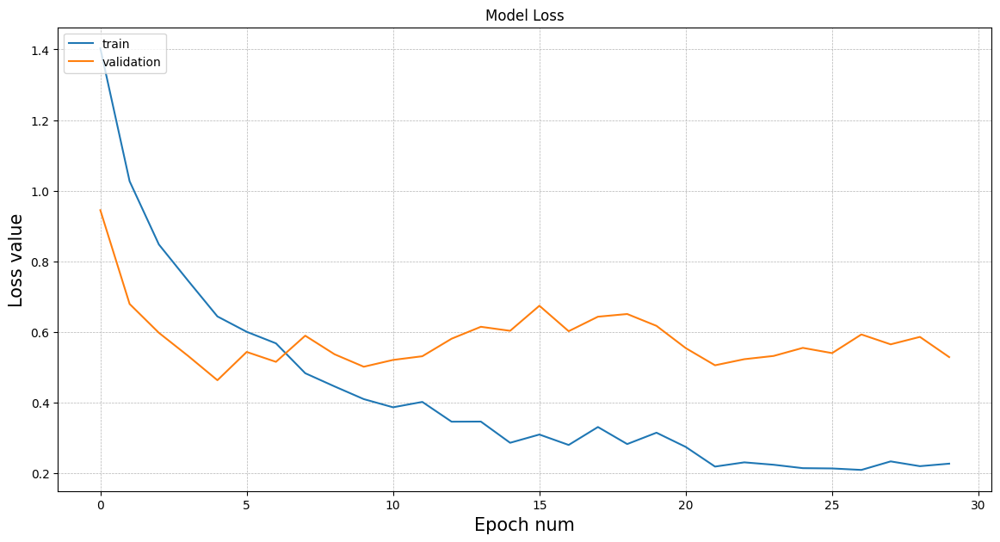

In [ ]:
plt.rcParams['figure.figsize'] = (14, 7)
for experiment_id in loss_hist.keys():
    plt.plot(loss_hist[experiment_id], label=experiment_id)
plt.legend(loc='upper left')
plt.title('Model Loss')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('Loss value', fontsize=15);
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

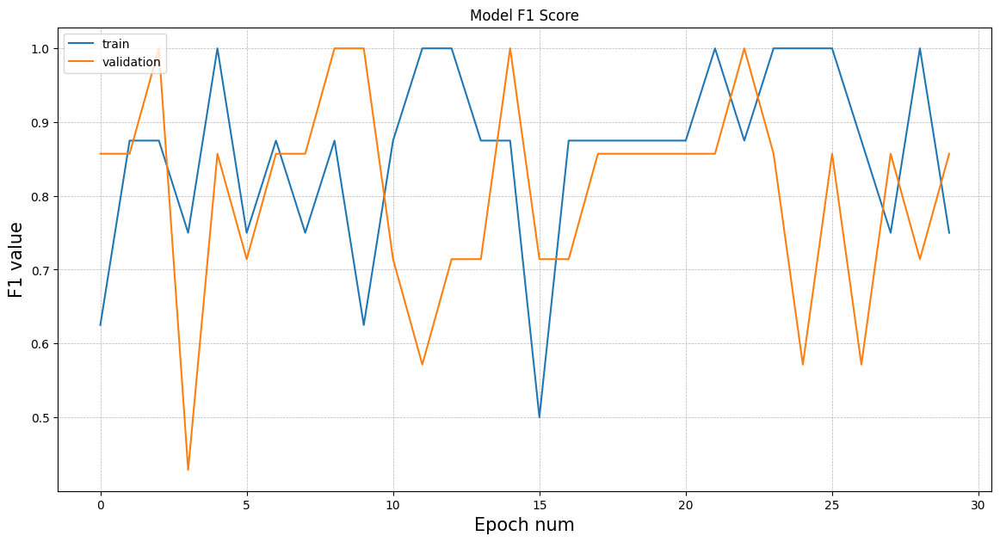

In [ ]:
plt.rcParams['figure.figsize'] = (14, 7)
for experiment_id in F1_hist.keys():
    plt.plot(F1_hist[experiment_id], label=experiment_id)
plt.legend(loc='upper left')
plt.title('Model F1 Score')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('F1 value', fontsize=15);
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

### Предсказания модели

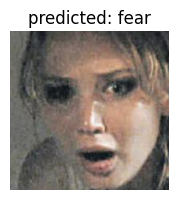

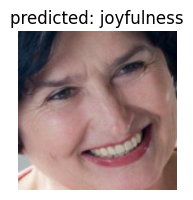

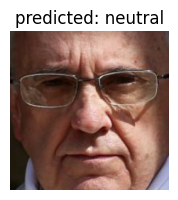

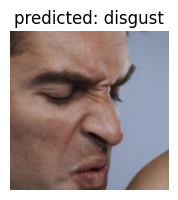

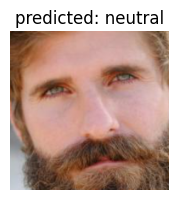

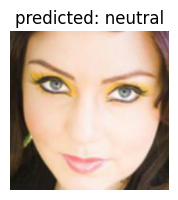

In [ ]:
visualize_model(model)

plt.ioff()
plt.show()

### Матрица ошибок

F1-Score macro:  0.8301948562615904
F1-Score micro:  0.8616352201257862
F1-Score weighted:  0.8592349454130939
[55.         85.29411765 90.         94.87179487 91.30434783]


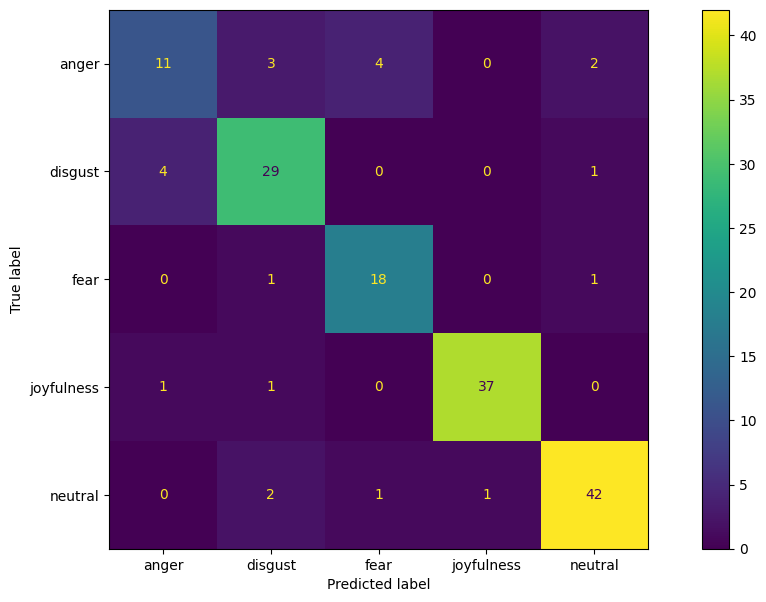

In [ ]:
# Initialize the prediction and label lists(tensors)
predlist=torch.zeros(0,dtype=torch.long, device='cpu')
lbllist=torch.zeros(0,dtype=torch.long, device='cpu')

with torch.no_grad():
    for i, (inputs, classes) in enumerate(dataloaders['validation']):
        inputs = inputs.to(device)
        classes = classes.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        # Append batch prediction results
        predlist=torch.cat([predlist,preds.view(-1).cpu()])
        lbllist=torch.cat([lbllist,classes.view(-1).cpu()])


print('F1-Score macro: ',f1_score(lbllist.numpy(), predlist.numpy(), average='macro'))
print('F1-Score micro: ',f1_score(lbllist.numpy(), predlist.numpy(), average='micro'))
print('F1-Score weighted: ',f1_score(lbllist.numpy(), predlist.numpy(), average='weighted'))
# Confusion matrix
conf_mat=confusion_matrix(lbllist.numpy(), predlist.numpy())
# print(conf_mat)
print('========================================================')

# Per-class accuracy
class_accuracy=100*conf_mat.diagonal()/conf_mat.sum(1)
print(class_accuracy)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat, display_labels=class_names)
disp.plot()
plt.show()

## Выводы по разделу модели ResNet18 и EfficientNet_b0

Как и в случае с ResNet18, модель EfficientNet_b0 показала высокий результат при отсутствии замороженных слоёв. Модель правильно предсказала образцы фотографий. У двух моделей почти одинаковые метрики

Для сравнения:

* метрики модели EfficientNet_b0

```
F1-Score macro:  0.8299334583545109
F1-Score micro:  0.8553459119496856
F1-Score weighted:  0.8540761970752041
========================================================
[60.         76.47058824 95.         94.87179487 91.30434783]
```

* метрики модели ResNet18


```
F1-Score macro:  0.8761792721138765
F1-Score micro:  0.89937106918239
F1-Score weighted:  0.9005119558602276
========================================================
[ 80.  88.23529412  80.   100.  91.30434783]
```

Сравним размеры обеих моделей:

* ResNet18


```
=============================================
Total params: 11,179,077
Trainable params: 11,179,077
Non-trainable params: 0
Total mult-adds (G): 14.51
=============================================
Input size (MB): 4.82
Forward/backward pass size (MB): 317.92
Params size (MB): 44.72
Estimated Total Size (MB): 367.45
=============================================
```

* EfficientNet_b0


```
===============================================
Total params: 4,336,769
Trainable params: 4,336,769
Non-trainable params: 0
Total mult-adds (G): 4.02
===============================================
Input size (MB): 6.29
Forward/backward pass size (MB): 563.83
Params size (MB): 17.18
Estimated Total Size (MB): 587.30
===============================================
```




Результаты в этом случае тоже очень показательны. Модель ResNet18 отлично подходит для дальнейшей разработки в области комплексного определения эмоций людей. Но если требуется очень эффективная модель, не уступающая по качеству, но при этом, имеющая гораздо меньший объем - то стоит обратить внимание на EfficientNet_b0.

## <b>Ignite</b>

PyTorch-[Ignite](https://pytorch-ignite.ai/blog/introduction/): почему?

PyTorch-Ignite - это библиотека высокого уровня, которая помогает гибко и прозрачно обучать и оценивать нейронные сети в PyTorch.

PyTorch-Ignite разработан так, чтобы быть на стыке высокоуровневых функций Plug & Play и возможностей расширения под капотом. PyTorch-Ignite нацелен на улучшение технических навыков сообщества глубокого обучения путем продвижения лучших практик. Вещи не скрыты за божественным инструментом, который делает все, но остаются в пределах досягаемости пользователей.

PyTorch-Ignite обертывает собственные абстракции PyTorch, такие как модули, оптимизаторы и загрузчики данных, в тонкие абстракции, которые позволяют полностью отделить ваши модели от их обучающей среды. Это достигается путем инвертирования управления с использованием абстракции, известной как Engine.

Встроенная система событий, представленная классом Events, обеспечивает Engine гибкость, тем самым облегчая взаимодействие на каждом этапе запуска. При таком подходе пользователи могут полностью настраивать поток событий во время запуска.

Подводя итог, PyTorch-Ignite - это:

* Чрезвычайно простой движок и система событий = Абстракция цикла обучения;
* Готовые метрики для простой оценки моделей;
* Встроенные обработчики для создания обучающих конвейеров, сохранения артефактов и регистрации параметров и метрик.

Дополнительными преимуществами использования PyTorch-Ignite являются:

* Меньше кода, чем в чистом PyTorch, обеспечивая при этом максимальный контроль и простоту;
* Больше модульного кода.

Пример работы высокоуровневой надстройки над PyTorch - Ignite

### Архитектура модели

In [ ]:
ignite.utils.manual_seed(CFG.seed)

In [ ]:
model_ignite = timm.create_model('efficientnet_b0', pretrained=True)

model_ignite.classifier = nn.Sequential(
           nn.Linear(1280, 256),
           nn.ReLU(),
           nn.Linear(256, len(class_names)))

model_ignite = model_ignite.to(device)
criterion = torch.nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(model_ignite.parameters(), lr=CFG.lr) 

# Определяем разные типы изменения скорости обучения
def get_scheduler(optimizer):
        if CFG.scheduler=='ReduceLROnPlateau':
          scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=CFG.factor, patience=CFG.patience, verbose=True, eps=CFG.eps)
        elif CFG.scheduler=='StepLR':
          scheduler = StepLR(optimizer, step_size=CFG.step_size, gamma=CFG.gamma)
        elif CFG.scheduler=='CosineAnnealingLR':
          scheduler = CosineAnnealingLR(optimizer, T_max=CFG.T_max, eta_min=CFG.min_lr, last_epoch=-1)
        elif CFG.scheduler=='CosineAnnealingWarmRestarts':
          scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=CFG.T_0, T_mult=1, eta_min=CFG.min_lr, last_epoch=-1)
        return scheduler

scheduler = get_scheduler(optimizer)

In [ ]:
# from ignite.engine import Engine, _prepare_batch
scaler = torch.cuda.amp.GradScaler()

def process_function(engine, batch):
    model_ignite.train()
    torch.set_grad_enabled(True)
    optimizer.zero_grad()
    x, y = _prepare_batch(batch, device=device)
    y_pred = model_ignite(x)
    loss = criterion(y_pred, y)
    # loss.backward()
    scaler.scale(loss).backward()
    scaler.step(optimizer)
    scaler.update()
    # optimizer.step()
    return loss.item()

trainer = Engine(process_function)

In [ ]:
# from ignite.engine import Events

log_interval = len(image_datasets['train'])

@trainer.on(Events.ITERATION_COMPLETED)
def log_training_loss(engine):
    iteration = (engine.state.iteration - 1) % len(image_datasets['train']) + 1
    if iteration % log_interval == 0:
        print("Epoch[{}] Iteration[{}/{}] Loss: {:.4f}"
              .format(engine.state.epoch, 
                         iteration, 
                         len(image_datasets['train']), 
                         engine.state.output))

In [ ]:
metrics = {
    'avg_accuracy': Accuracy(),
    'avg_precision': Precision(average=True),
    'avg_recall': Recall(average=True),
    'Loss': Loss(criterion)    
}

In [ ]:
# from ignite.engine import create_supervised_evaluator

# Напомним, что device = “cuda” был определен выше
train_evaluator = create_supervised_evaluator(model_ignite, metrics=metrics, device=device)
pbar = ProgressBar()
pbar.attach(trainer)
val_evaluator = create_supervised_evaluator(model_ignite, metrics=metrics, device=device)
training_history = {'avg_accuracy':[],'Loss':[]}
validation_history = {'avg_accuracy':[],'Loss':[]}
last_epoch = []

In [ ]:
RunningAverage(output_transform=lambda x: x).attach(trainer, 'Loss') # Для начала мы прикрепим показатель RunningAverage, чтобы отслеживать среднее значение скалярных потерь на выходе для каждой партии.

In [ ]:
# import numpy as np
# from torch.utils.data.dataset import Subset

indices = np.arange(len(image_datasets['train']))
random_indices = np.random.permutation(indices)[:len(image_datasets['validation'])]
train_subset = Subset(image_datasets['train'], indices=random_indices)

train_eval_loader = DataLoader(train_subset, batch_size=CFG.batch_size, shuffle=True,
                                num_workers=CFG.num_workers, 
                                drop_last=True, pin_memory=device)

In [ ]:
@trainer.on(Events.EPOCH_COMPLETED)
def compute_and_display_offline_train_metrics(engine):
    epoch = engine.state.epoch
    print("Compute train metrics...")
    metrics = train_evaluator.run(train_eval_loader).metrics
    accuracy = metrics['avg_accuracy']*100
    loss = metrics['Loss']
    last_epoch.append(0)
    training_history['avg_accuracy'].append(accuracy)
    training_history['Loss'].append(loss)
    print("Training Results - Epoch: {}  Accuracy: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | Loss: {:.4f}"
          .format(engine.state.epoch, 
                      metrics['avg_accuracy'], 
                      metrics['avg_precision'], 
                      metrics['avg_recall'],
                      metrics['Loss']
                      ))


@trainer.on(Events.EPOCH_COMPLETED)
def compute_and_display_val_metrics(engine):
    epoch = engine.state.epoch
    print("Compute validation metrics...")
    metrics = val_evaluator.run(train_eval_loader).metrics
    accuracy = metrics['avg_accuracy']*100
    loss = metrics['Loss']
    last_epoch.append(0)
    training_history['avg_accuracy'].append(accuracy)
    training_history['Loss'].append(loss)

    print("Validation Results - Epoch: {}  Accuracy: {:.4f} | Precision: {:.4f} | Recall: {:.4f} | Loss: {:.4f}"
          .format(engine.state.epoch, 
                      metrics['avg_accuracy'], 
                      metrics['avg_precision'], 
                      metrics['avg_recall'],
                      metrics['Loss']
                      ))


In [ ]:
elapsed_time = Timer()

elapsed_time.attach(
    trainer,
    start=Events.STARTED,         # Start timer at the beginning of training
    resume=Events.EPOCH_STARTED,  # Resume timer at the beginning of each epoch
    pause=Events.EPOCH_COMPLETED, # Pause timer at the end of each epoch
    step=Events.EPOCH_COMPLETED,  # Step (update) timer at the end of each epoch
)
@trainer.on(Events.EPOCH_COMPLETED)
def log_elapsed_time(trainer):
    print(f"   Elapsed time, seconds: {elapsed_time.value()}")

In [ ]:
# basic_profiler = BasicTimeProfiler()
# basic_profiler.attach(trainer)
handlers_profiler = HandlersTimeProfiler()
handlers_profiler.attach(trainer)

### Обучение модели

In [ ]:
trainer = trainer.run(train_eval_loader, max_epochs=30)

[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 1  Accuracy: 0.3553 | Precision: 0.3674 | Recall: 0.2520 | Loss: 1.5460
Compute validation metrics...
Validation Results - Epoch: 1  Accuracy: 0.4079 | Precision: 0.2364 | Recall: 0.2911 | Loss: 1.5317
   Elapsed time, seconds: 3.114950438000051


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 2  Accuracy: 0.4276 | Precision: 0.2936 | Recall: 0.3093 | Loss: 1.4538
Compute validation metrics...
Validation Results - Epoch: 2  Accuracy: 0.4474 | Precision: 0.6984 | Recall: 0.3301 | Loss: 1.4430
   Elapsed time, seconds: 6.182531579999932


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 3  Accuracy: 0.5132 | Precision: 0.6647 | Recall: 0.4088 | Loss: 1.2966
Compute validation metrics...
Validation Results - Epoch: 3  Accuracy: 0.4605 | Precision: 0.4597 | Recall: 0.3732 | Loss: 1.3380
   Elapsed time, seconds: 10.51889988500011


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 4  Accuracy: 0.6053 | Precision: 0.7357 | Recall: 0.5315 | Loss: 1.1469
Compute validation metrics...
Validation Results - Epoch: 4  Accuracy: 0.5855 | Precision: 0.7562 | Recall: 0.5057 | Loss: 1.1415
   Elapsed time, seconds: 13.756679039000119


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 5  Accuracy: 0.7039 | Precision: 0.7791 | Recall: 0.6361 | Loss: 1.0509
Compute validation metrics...
Validation Results - Epoch: 5  Accuracy: 0.7500 | Precision: 0.8025 | Recall: 0.6876 | Loss: 1.0123
   Elapsed time, seconds: 16.82684809300008


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 6  Accuracy: 0.7697 | Precision: 0.7974 | Recall: 0.7226 | Loss: 0.9129
Compute validation metrics...
Validation Results - Epoch: 6  Accuracy: 0.7697 | Precision: 0.8069 | Recall: 0.7244 | Loss: 0.9299
   Elapsed time, seconds: 19.84400997700004


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 7  Accuracy: 0.8092 | Precision: 0.8638 | Recall: 0.7532 | Loss: 0.7165
Compute validation metrics...
Validation Results - Epoch: 7  Accuracy: 0.7500 | Precision: 0.7930 | Recall: 0.6853 | Loss: 0.8000
   Elapsed time, seconds: 23.9948081


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 8  Accuracy: 0.7697 | Precision: 0.7937 | Recall: 0.7065 | Loss: 0.7317
Compute validation metrics...
Validation Results - Epoch: 8  Accuracy: 0.8355 | Precision: 0.8509 | Recall: 0.7948 | Loss: 0.6767
   Elapsed time, seconds: 27.44354326100006


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 9  Accuracy: 0.8224 | Precision: 0.8250 | Recall: 0.7876 | Loss: 0.6929
Compute validation metrics...
Validation Results - Epoch: 9  Accuracy: 0.8421 | Precision: 0.8697 | Recall: 0.8061 | Loss: 0.6375
   Elapsed time, seconds: 30.520486832000188


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 10  Accuracy: 0.8487 | Precision: 0.8669 | Recall: 0.8226 | Loss: 0.5952
Compute validation metrics...
Validation Results - Epoch: 10  Accuracy: 0.8553 | Precision: 0.8494 | Recall: 0.8367 | Loss: 0.6214
   Elapsed time, seconds: 33.66059820600003


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 11  Accuracy: 0.8684 | Precision: 0.8893 | Recall: 0.8353 | Loss: 0.4592
Compute validation metrics...
Validation Results - Epoch: 11  Accuracy: 0.9145 | Precision: 0.9015 | Recall: 0.8955 | Loss: 0.4592
   Elapsed time, seconds: 37.80082716800007


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 12  Accuracy: 0.9145 | Precision: 0.9001 | Recall: 0.8896 | Loss: 0.3910
Compute validation metrics...
Validation Results - Epoch: 12  Accuracy: 0.8882 | Precision: 0.9033 | Recall: 0.8623 | Loss: 0.4234
   Elapsed time, seconds: 41.34035457899995


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 13  Accuracy: 0.9342 | Precision: 0.9272 | Recall: 0.9305 | Loss: 0.3786
Compute validation metrics...
Validation Results - Epoch: 13  Accuracy: 0.8421 | Precision: 0.8264 | Recall: 0.8414 | Loss: 0.4770
   Elapsed time, seconds: 46.12703345700015


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 14  Accuracy: 0.8684 | Precision: 0.8708 | Recall: 0.8578 | Loss: 0.4067
Compute validation metrics...
Validation Results - Epoch: 14  Accuracy: 0.9605 | Precision: 0.9597 | Recall: 0.9617 | Loss: 0.2773
   Elapsed time, seconds: 49.141398864000166


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 15  Accuracy: 0.9342 | Precision: 0.9294 | Recall: 0.9344 | Loss: 0.3342
Compute validation metrics...
Validation Results - Epoch: 15  Accuracy: 0.9145 | Precision: 0.8978 | Recall: 0.9031 | Loss: 0.3489
   Elapsed time, seconds: 53.60944611400009


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 16  Accuracy: 0.9145 | Precision: 0.9161 | Recall: 0.9142 | Loss: 0.3066
Compute validation metrics...
Validation Results - Epoch: 16  Accuracy: 0.9539 | Precision: 0.9446 | Recall: 0.9547 | Loss: 0.2739
   Elapsed time, seconds: 56.68988206500012


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 17  Accuracy: 0.9408 | Precision: 0.9362 | Recall: 0.9379 | Loss: 0.2208
Compute validation metrics...
Validation Results - Epoch: 17  Accuracy: 0.9539 | Precision: 0.9463 | Recall: 0.9565 | Loss: 0.1890
   Elapsed time, seconds: 59.73727397400012


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 18  Accuracy: 0.9276 | Precision: 0.9213 | Recall: 0.9301 | Loss: 0.2355
Compute validation metrics...
Validation Results - Epoch: 18  Accuracy: 0.9605 | Precision: 0.9625 | Recall: 0.9558 | Loss: 0.2245
   Elapsed time, seconds: 62.83151451700019


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 19  Accuracy: 0.9211 | Precision: 0.9079 | Recall: 0.9218 | Loss: 0.2479
Compute validation metrics...
Validation Results - Epoch: 19  Accuracy: 0.9474 | Precision: 0.9449 | Recall: 0.9483 | Loss: 0.2044
   Elapsed time, seconds: 67.32231568600014


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 20  Accuracy: 0.9408 | Precision: 0.9457 | Recall: 0.9359 | Loss: 0.1837
Compute validation metrics...
Validation Results - Epoch: 20  Accuracy: 0.9145 | Precision: 0.9056 | Recall: 0.9151 | Loss: 0.2232
   Elapsed time, seconds: 70.42480227100009


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 21  Accuracy: 0.9408 | Precision: 0.9448 | Recall: 0.9385 | Loss: 0.2017
Compute validation metrics...
Validation Results - Epoch: 21  Accuracy: 0.9539 | Precision: 0.9422 | Recall: 0.9606 | Loss: 0.1530
   Elapsed time, seconds: 73.48993340800007


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 22  Accuracy: 0.9671 | Precision: 0.9713 | Recall: 0.9627 | Loss: 0.1652
Compute validation metrics...
Validation Results - Epoch: 22  Accuracy: 0.9868 | Precision: 0.9857 | Recall: 0.9867 | Loss: 0.0893
   Elapsed time, seconds: 76.59796180300009


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 23  Accuracy: 0.9671 | Precision: 0.9677 | Recall: 0.9562 | Loss: 0.1307
Compute validation metrics...
Validation Results - Epoch: 23  Accuracy: 0.9342 | Precision: 0.9346 | Recall: 0.9379 | Loss: 0.1605
   Elapsed time, seconds: 80.97378337900022


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 24  Accuracy: 0.9671 | Precision: 0.9677 | Recall: 0.9640 | Loss: 0.1330
Compute validation metrics...
Validation Results - Epoch: 24  Accuracy: 0.9539 | Precision: 0.9435 | Recall: 0.9551 | Loss: 0.2074
   Elapsed time, seconds: 84.19807492500036


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 25  Accuracy: 0.9539 | Precision: 0.9521 | Recall: 0.9470 | Loss: 0.1481
Compute validation metrics...
Validation Results - Epoch: 25  Accuracy: 0.9605 | Precision: 0.9528 | Recall: 0.9524 | Loss: 0.1832
   Elapsed time, seconds: 87.30834324000034


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 26  Accuracy: 0.9737 | Precision: 0.9715 | Recall: 0.9792 | Loss: 0.0962
Compute validation metrics...
Validation Results - Epoch: 26  Accuracy: 0.9671 | Precision: 0.9728 | Recall: 0.9660 | Loss: 0.1243
   Elapsed time, seconds: 90.38884734800035


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 27  Accuracy: 0.9145 | Precision: 0.9256 | Recall: 0.9145 | Loss: 0.2251
Compute validation metrics...
Validation Results - Epoch: 27  Accuracy: 0.9408 | Precision: 0.9368 | Recall: 0.9235 | Loss: 0.1888
   Elapsed time, seconds: 94.83963609800026


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 28  Accuracy: 0.9737 | Precision: 0.9685 | Recall: 0.9752 | Loss: 0.1092
Compute validation metrics...
Validation Results - Epoch: 28  Accuracy: 0.9474 | Precision: 0.9529 | Recall: 0.9364 | Loss: 0.1560
   Elapsed time, seconds: 98.10243772400031


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 29  Accuracy: 0.9539 | Precision: 0.9549 | Recall: 0.9398 | Loss: 0.1459
Compute validation metrics...
Validation Results - Epoch: 29  Accuracy: 0.9539 | Precision: 0.9563 | Recall: 0.9494 | Loss: 0.1713
   Elapsed time, seconds: 101.18138718600039


[1/19]   5%|5          [00:00<?]

Compute train metrics...
Training Results - Epoch: 30  Accuracy: 0.9342 | Precision: 0.9316 | Recall: 0.9302 | Loss: 0.1882
Compute validation metrics...
Validation Results - Epoch: 30  Accuracy: 0.9539 | Precision: 0.9504 | Recall: 0.9472 | Loss: 0.1384
   Elapsed time, seconds: 104.20942769200042


### Результаты обучения

In [ ]:
results = handlers_profiler.get_results()
handlers_profiler.print_results(results)


---------------------------------------------  -----------------------  --------------  --------------  --------------  --------------  --------------  
Handler                                        Event Name                     Total(s)      Min(s)/IDX      Max(s)/IDX         Mean(s)          Std(s)  
---------------------------------------------  -----------------------  --------------  --------------  --------------  --------------  --------------  
Metric.started                                 EPOCH_STARTED                   0.00052        1e-05/14        4e-05/17           2e-05           1e-05  
ProgressBar._close                             EPOCH_COMPLETED                 0.03841       0.00051/7      0.00838/12         0.00128         0.00149  
compute_and_display_offline_train_metrics      EPOCH_COMPLETED                27.69118      0.75686/13      1.45418/12         0.92304         0.24438  
compute_and_display_val_metrics                EPOCH_COMPLETED                 26

In [ ]:
# Результаты профилирования, полученные с помощью basic_profiler и handler_profiler, могут быть экспортированы в файл CSV с помощью write_results() метода.
# Если нужно сохранить результаты, то можно раскомментить следующую строку
# handlers_profiler.write_results("./handlers_profile.csv")

### Визуализация данных по работе алгоритма

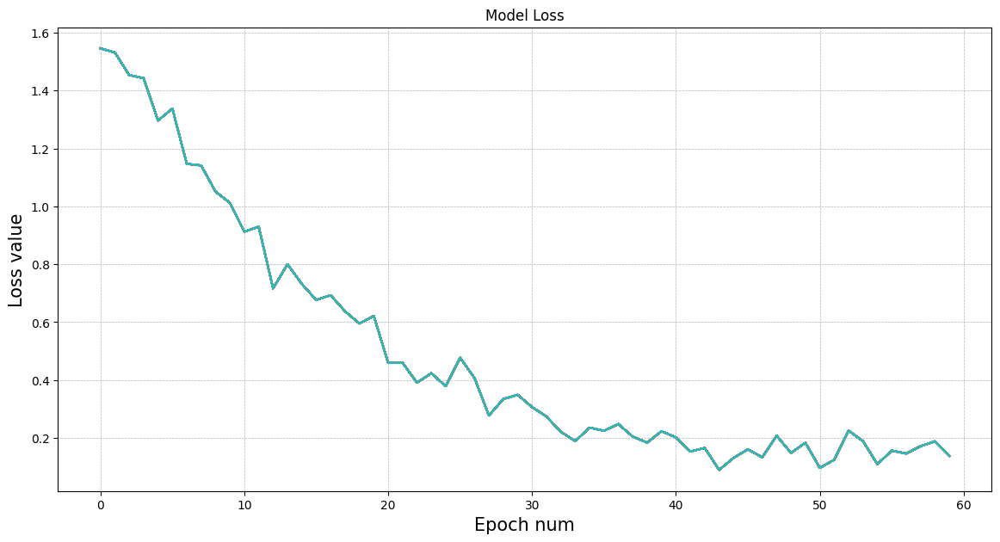

In [ ]:
plt.rcParams['figure.figsize'] = (14, 7)
for experiment_id in training_history['Loss']:
    plt.plot(training_history['Loss']) #, label=experiment_id
#plt.legend(loc='upper left')
plt.title('Model Loss')
plt.xlabel('Epoch num', fontsize=15)
plt.ylabel('Loss value', fontsize=15);
plt.grid(linestyle='--', linewidth=0.5, color='.7')
plt.show()

### Матрица ошибок

In [ ]:
# Для Ignite предусмотрена своя матрица ошибок. Разработчик рекомендует использовать эту матрицу, вместо средств sc_learn. 

metric = ConfusionMatrix(num_classes=5) # average= "precision" -покажет отклик каждого класса
metric.attach(val_evaluator, 'cm')
state = val_evaluator.run(train_eval_loader)
print(state.metrics['cm'])
print(class_names)
print(' Predicted label')

tensor([[17,  1,  1,  0,  2],
        [ 0, 26,  0,  0,  1],
        [ 0,  0, 21,  0,  0],
        [ 0,  0,  0, 35,  1],
        [ 0,  1,  3,  0, 43]])
['anger', 'disgust', 'fear', 'joyfulness', 'neutral']
 Predicted label


## Выводы по разделу PyTorch

Как можно заметить, код Ignite достаточно компактный. Все необходимые функции можно добавить достаточно легко. Это можно отнести к плюсам использования. Также несомненным плюсом является время обучения без использования GPU: 30 эпох обучения проходят за 30 минут, против 3-х часов на классическом Pytorch.

Очевидно, что для Ignite требуется более тонкая настройка, но по этому фреймворку пока не очень много качественной и разнообразной информации.

Предполагаем, что поэтому большая часть разработчиков пока отдает предпочтение классическому Pytorch, вместо Ignite.

В функции `process_function` имеется блок:

```
# scaler.scale(loss).backward()
# scaler.step(optimizer)
# scaler.update()
```
С ним проводились эксперименты, так как некоторые источники указывали на то, что это может повысить качество обучения. На практике он показал результат лучше, поэтому стандартные методы остались закомменчеными, но не удаленными из функции. При желании, можно их активировать, а scaler весь закомментить.

Судя по матрице ошибок, которую предлагает использовать разработчик, модель показывает прекрасные результаты, а код выглядит гораздо компактнее. Плюс, разработчик предлагает [генератор кода](https://code-generator.pytorch-ignite.ai/). Что может упростить использование фреймворка в разы.


В этом разделе так же использовалась модель EfficientNet_b0, при этом, если классический PyTorch обучает эту же модель на CPU более 3-х часов, то код Ignite позволяет сократить время обучения до 30 минут! Что делает фреймворк Ignite достойным кандидатом на более глубокое изучение и последующее внедрение в работе. 




# <b>2.2.2 TensorFlow</b>

## <b>Предварительные замечания</b>

### О выбранной тактике обучения моделей

В данной работе представлены две модели, реализованные инструментами библиотеки TensorFlow. Обе модели обучены на предобученных моделях, которые используются для задачи классификации изображений - `InceptionV3` и `MobileNetV2` (обе обучены на базе данных ImageNet). Подробно о моделях можно прочитать в специальных статьях, ссылки на которые приведены в соответствующих разделах.

В библиотеке TensorFlow существует как минимум два способа использования предобученных моделей:

- с использованием библиотеки моделей `tensorflow-hub`,
- с использованием модуля Keras `tf.keras.applications`.

Первый способ проще в имплементации, однако у него есть существенный для разработчика недостаток - предобученные модели поставляются как единый слой и не подлежат частичной разморозке, разморозить можно только все слои зараз, отчего важным становится правильный выбор версии данной модели (то есть мы имеем дело с семействами моделей). Также два способа отличаются методом `rescale` - в первом случае изображения необходимо привести к стандарту [0, 1], тогда как во втором - [-1, 1]. Это необходимо иметь ввиду при подготовке наших изображений перед отправкой на обучение.

Мы используем второй способ, так как он гораздо более пластичен для тонкой настройки и позволяет экспериментировать с гиперпараметрами.

Всего для подотовки дипломного проекта было использовано четыре различных предобученных модели с использованием различных оптимизаторов (`SGD`, `RMSprop`, `Adam`) и функций потерь (`mse`, `categorical crossentropy`), лучшие параметры были определены в ходе ряда экспериментов. С большей частью экспериментов можно ознакомиться по [ссылке](https://github.com/lefthand67/SBER_Diploma/tree/main/experiments) (подробных словесных описаний на данный момент нет, но названия и подписи говорят сами за себя).

В данной работе представлены модели, построенные на связке `RMSprop/mse`, как показавшие себя с лучшей стороны. Также эксперименты показали, что данный датасет с данной связкой optimizer/loss повышает эффективность обучения при добавлении в слой классификации регуляризатора Ridge Regression (`L2`) со степенью 0.5 (эксперименты проведены на созданной с нуля нейросети, без предобученной модели). Для снижения вероятности переобучения добавлены слои аугментации и слой `dropout` (степень 0.2). 

Архитектура представленных в работе моделей отличается минимализмом - отсутствуют слои свертки и дополнительные полносвязные слои перед классификатором, так как на экспериментах данные опыты дали результат хуже базовых моделей ([эксперименты](https://github.com/lefthand67/SBER_Diploma/blob/main/experiments/01_tf_pretrained_InceptionResNetV2.ipynb) проводились на предобученной модели `InceptionResNetV2`).

Обучение представленных моделей происходило в два этапа: 
- сначала обучается классификатор на базе предобученной модели, у которой отключены верхние слои (include_top=False),
- затем мы размораживаем часть слоев предобученной модели и дообучаем наш классификатор.

Рассмотрим эти этапы подробнее.

### `feature_extractor` и `bottleneck layer`

На первом этапе создается `feature_extractor`, который извлекает веса из предобученной модели для переноса обучения на нашу модель. При переносе обучения рекомендуется отключать самые "верхние", то есть последние слои, вплоть до самого последнего перед слоем `Flatten` предобученной модели: именно в них происходит обучение на данную классификацию, в то время как мы собираемся строить свой классификатор. Последний слой перед `Flatten` содержит самые  общие признаки изображений (в литературе его называют слоем "бутылочное горлышко" - "bottleneck layer"), именно поэтому он представляет для нас наибольшую ценность. Данная задача решается отключением аргумента `include_top`, добавлением слоя `Flatten` для перевода тензора изображений в векторный вид (альтернативно можно активировать аргумент `pooling` внутри самого `feature_extractor`) и полносвязного слоя классификации.

### Разморозка слоев

За "разморозку" слоев у нас будет отвечать параметр `do_fine_tuning`, который может принимать только булевы значения (в первых двух блоках он установлен в режим `False`). В официальных документах указано, что размораживать слои следует только после того, как мы уже обучили собственный классификатор c отключенным режимом `training`, в ином случае предобученная модель с установленными в случайном порядке весами для новых слоев при обновлении весов потеряет все, чему она была обучена. Кроме того, в общем случае нет необходимости в разморозке "нижних слоев", так как они обнаруживают самые простые и общие закономерности, характерные для любых изображений, тогда как цель применения предобученной модели - использовать более "специализированные" слои для дообучения новой модели на новом датасете (тем не менее в модели с использованием MobileNetV2 мы разморозим все слои ввиду небольших размеров данной предобученной модели, специально разработанной для переносных устройств).

Особого внимания в случае разморозки `feature_extractor` заслуживают слои bacth normalization (`BN`). Это единственные встроенные слои, веса которых не должны обновляться при градиентном спуске, так как эти веса - движущиеся среднее значение и стандартное отклонение, используемые для нормализации текущего батча. Запустив модель в режиме `training=False`, мы эти слои заморозили. Когда мы на следующем шаге размораживаем всю модель или ее часть (`feature_extractor.trainable=True`), слои BN продолжают работать в режиме inference (движущиеся mean и std), а не обучения (mean и std текущего батча). Это очень важный момент, так как если мы запустим `feature_extractor` сразу в режиме разморозки без предварительного обучения на замороженных слоях (то есть не заморозим веса BN), слои BN будут давать непредсказуемый результат (подробнее о проблеме [здесь](https://keras.io/getting_started/faq/#whats-the-difference-between-the-training-argument-in-call-and-the-trainable-attribute)).

## <b>Модель 2.2.2.1</b> | InceptionV3 

Authors: Christian Szegedy, Vincent Vanhoucke, Sergey Ioffe, Jonathon Shlens, Zbigniew Wojna

https://arxiv.org/abs/1512.00567

## Замороженные слои

### Модуль `tf.keras.applications` | `feature_extractor_layer`

Создаем `feature_extractor` для обучения собственного классификатора. 

In [ ]:
do_fine_tuning = False
feature_extractor = tf.keras.applications.InceptionV3(
                                                include_top=False,
                                                weights="imagenet",
                                                input_shape=IMG_SHAPE
)
feature_extractor.trainable = do_fine_tuning

87910968/87910968 [==============================] - 3s 0us/step


### Архитектура модели

In [ ]:
from tensorflow.keras import layers

REGULARIZER=tf.keras.regularizers.L1L2(l1=0.0, l2=0.5)

inputs = tf.keras.Input(shape=(IMG_SHAPE))
x = rescale(inputs)
x = data_aug(x)
x = feature_extractor(x, training=False)

x = layers.Flatten()(x)

x = layers.Dropout(DROPOUT_RATE)(x)
x = layers.BatchNormalization()(x)
outputs = layers.Dense(num_classes, activation='softmax',
                       kernel_regularizer=REGULARIZER
                       )(x)
model = tf.keras.Model(inputs, outputs,
                       name='InceptionV3_based')

model.summary()

Model: "InceptionV3_based"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 299, 299, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, 299, 299, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 131072)            0         
                                                                 
 dropout (Dropout)           (None, 131072)            0         
                                                                 
 batch_normalization_94 (Bat  (None, 131072)     

Посмотрим на количество переменных, которые будут обучаться в данной архитектуре.

In [ ]:
len(model.trainable_variables)

4

### Компиляция

Используем связку RMSprop/mse и для оценки работы модели ранее зафиксированные в списке метрики - accurcay и PR-AUC. `learning_rate` стартует с ранее определенного значения и по мере обучения будет корректироваться в соотвествии с теми параметрами, которые мы определили в callback.

In [ ]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=BASE_LR),
              loss='mse',
              metrics=metrics)

### Обучение модели

Так как мы определили callback, отвечающий за ранню остановку обучения, то количество эпох будет определяться автоматически по мере обучения модели. Обучение будет происходить на обучающей выборе, метрики будут оценивать на валидационной.

In [ ]:
hist = model.fit(train_batches,
                 epochs=EPOCHS,
                 validation_data=validation_batches,
                 callbacks=[early_stopping, lr_schedule])

Epoch 1/500
34/34 [==============================] - 26s 347ms/step - loss: 14.9156 - accuracy: 0.2111 - PR_AUC: 0.2057 - val_loss: 8.7523 - val_accuracy: 0.1509 - val_PR_AUC: 0.1801 - lr: 0.0100
Epoch 2/500
34/34 [==============================] - 7s 220ms/step - loss: 9.6311 - accuracy: 0.1991 - PR_AUC: 0.2024 - val_loss: 7.3368 - val_accuracy: 0.1950 - val_PR_AUC: 0.1974 - lr: 0.0100
Epoch 3/500
34/34 [==============================] - 7s 215ms/step - loss: 9.1896 - accuracy: 0.1741 - PR_AUC: 0.1908 - val_loss: 5.9951 - val_accuracy: 0.1698 - val_PR_AUC: 0.1978 - lr: 0.0100
Epoch 4/500
34/34 [==============================] - 7s 219ms/step - loss: 9.4130 - accuracy: 0.1861 - PR_AUC: 0.1936 - val_loss: 12.8861 - val_accuracy: 0.1761 - val_PR_AUC: 0.1897 - lr: 0.0100
Epoch 5/500
34/34 [==============================] - 7s 208ms/step - loss: 6.8855 - accuracy: 0.2176 - PR_AUC: 0.2084 - val_loss: 9.1384 - val_accuracy: 0.1572 - val_PR_AUC: 0.1840 - lr: 0.0085
Epoch 6/500
34/34 [========

### Визуализация данных по работе алгоритма

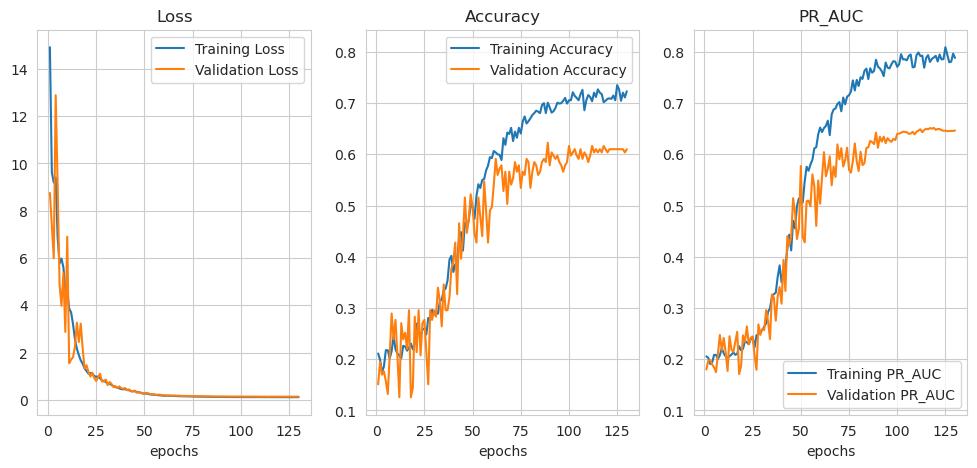

In [ ]:
val_acc_viz(hist, len(hist.history['accuracy']))

### Предсказание модели

Посмотрим на то, как обученный классификатор предсказывает изображения уже из тестовой выборки.

In [ ]:
show_predictions(model, test_batches, visualization=False)

joyfulness is joyfulness (66.61%)
neutral is neutral (81.76%)
anger is neutral (44.32%)
neutral is neutral (39.82%)
neutral is neutral (49.58%)
fear is fear (47.31%)
neutral is neutral (73.20%)
anger is joyfulness (51.92%)
neutral is neutral (60.25%)
disgust is disgust (84.36%)


### Матрица ошибок

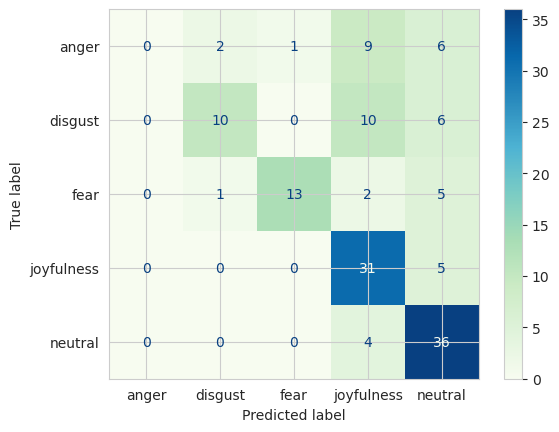

In [ ]:
confusion_matrix(model, test_batches)

### Вывод

In [ ]:
val_acc_best = np.max(hist.history['val_accuracy'])
val_auc_best = np.max(hist.history['val_PR_AUC'])
model_best_results = round(val_acc_best, 2), round(val_auc_best, 2)

print(f'val_accuracy: {model_best_results[0]}')
print(f'val_PR_AUC: {model_best_results[1]}')

val_accuracy: 0.62
val_PR_AUC: 0.65


Наш классификатор обучился не очень эффективно, однако на данном этапе нас это не волнует, так этот классификатор будет дообучаться уже на размороженных слоях предобученнной модели, где и должен будет достичь уже более значимого результата.

In [ ]:
# сохраним данные о модели
model_221 = model
hist_221 = hist
model_221_best_results = model_best_results

## Разморозка слоев

Второй этап - дообучение нашего классификатора.

In [ ]:
do_fine_tuning = True
feature_extractor.trainable = do_fine_tuning

print(f'Разморозка слоев: {do_fine_tuning}.')

Разморозка слоев: True.


Разморозим половину слоев предобученной модели, этого должно быть достаточно, хотя на самом деле подбор количества слоев является одной из возможностей для экспериментов.

In [ ]:
# с какого слоя мы размораживаем модель
fine_tune_at = int(len(feature_extractor.layers)/2)

# Заморозим все остальные слои
for layer in feature_extractor.layers[:fine_tune_at+1]:
    layer.trainable = False

Посмотрим на общее количество слоев в предобученной модели, а также на количество переменных, которые будут обучаться в размороженных слоях. 

In [ ]:
print("Number of layers in the feature extractor: ", len(feature_extractor.layers))
print("Trainable variables in the feature extractor: ", len(feature_extractor.trainable_variables))

Number of layers in the feature extractor:  311
Trainable variables in the feature extractor:  92


При желании можно посмотреть на архитектуру `feature_extractor`.

In [ ]:
# feature_extractor.summary()

### Компиляция

Теперь необходимо скомпилировать нашу уже обученную на предыдущем этапе модель, чтобы внесенные изменения были применены. Уменьшим базовый lr, чтобы избежать быстрого переобучения модели.

In [ ]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=BASE_LR/100),
              loss='mse',
              metrics=metrics)

### Архитектура модели

In [ ]:
model.summary()

Model: "InceptionV3_based"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 299, 299, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, 299, 299, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 131072)            0         
                                                                 
 dropout (Dropout)           (None, 131072)            0         
                                                                 
 batch_normalization_94 (Bat  (None, 131072)     

In [ ]:
len(model.trainable_variables)

96

### Обучение

In [ ]:
hist = model.fit(train_batches,
                 epochs=EPOCHS,
                 validation_data=validation_batches,
                 callbacks=[early_stopping, lr_schedule])

Epoch 1/500
34/34 [==============================] - 29s 334ms/step - loss: 0.1881 - accuracy: 0.5898 - PR_AUC: 0.6256 - val_loss: 0.2094 - val_accuracy: 0.5220 - val_PR_AUC: 0.6184 - lr: 1.0000e-04
Epoch 2/500
34/34 [==============================] - 9s 277ms/step - loss: 0.1543 - accuracy: 0.6843 - PR_AUC: 0.7524 - val_loss: 0.1815 - val_accuracy: 0.5597 - val_PR_AUC: 0.6869 - lr: 1.0000e-04
Epoch 3/500
34/34 [==============================] - 10s 287ms/step - loss: 0.1355 - accuracy: 0.7398 - PR_AUC: 0.8107 - val_loss: 0.1425 - val_accuracy: 0.7170 - val_PR_AUC: 0.7977 - lr: 1.0000e-04
Epoch 4/500
34/34 [==============================] - 9s 276ms/step - loss: 0.1225 - accuracy: 0.7611 - PR_AUC: 0.8385 - val_loss: 0.1231 - val_accuracy: 0.7358 - val_PR_AUC: 0.8380 - lr: 1.0000e-04
Epoch 5/500
34/34 [==============================] - 9s 271ms/step - loss: 0.1135 - accuracy: 0.7741 - PR_AUC: 0.8555 - val_loss: 0.1478 - val_accuracy: 0.6792 - val_PR_AUC: 0.7491 - lr: 1.0000e-04
Epoch 6/

### Визуализация данных по работе алгоритма

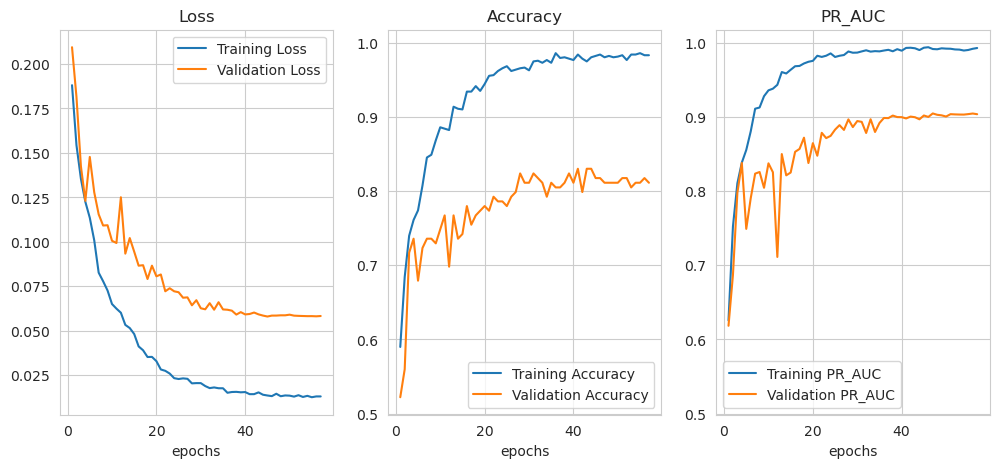

In [ ]:
val_acc_viz(hist, len(hist.history['accuracy']))

Видно, что модель довольно быстро приходит к переобучению, тем не менее, за счет автоматического уменьшения `learning_rate` мы получаем неплохой прирост качества. На других экспериментах эта же модель показывала результат PR-AUC, выше 92% 

### Предсказание модели

In [ ]:
show_predictions(model, test_batches, visualization=False)

neutral is neutral (99.97%)
neutral is neutral (98.83%)
joyfulness is joyfulness (96.29%)
fear is fear (95.23%)
disgust is disgust (98.33%)
joyfulness is joyfulness (99.58%)
anger is anger (95.89%)
anger is neutral (73.04%)
neutral is anger (62.06%)
neutral is neutral (98.14%)


### Матрица ошибок

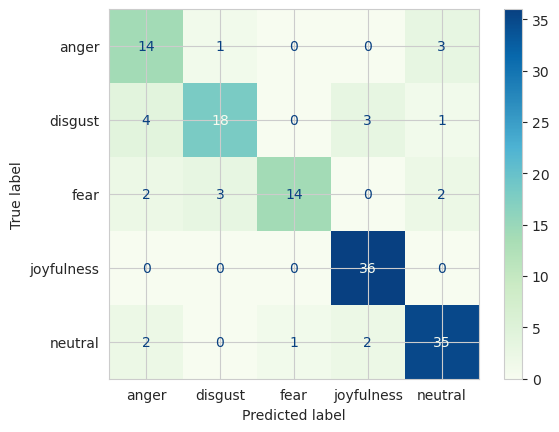

In [ ]:
confusion_matrix(model, test_batches)

### Вывод

In [ ]:
val_acc_best = np.max(hist.history['val_accuracy'])
val_auc_best = np.max(hist.history['val_PR_AUC'])
model_best_results = round(val_acc_best, 2), round(val_auc_best, 2)

print(f'val_accuracy: {model_best_results[0]}')
print(f'val_PR_AUC: {model_best_results[1]}')

val_accuracy: 0.83
val_PR_AUC: 0.9


Матрица ошибок оказалась намного лучше! Нам удалось достичь и превзойти минимальной цели в 80%.

### Сохранение модели

Сохраним обученную модель на случай, если нам придется ее использовать в дальнейшем.

In [ ]:
EMOTIONS_INCEPTIONV3_SAVED_MODEL = "./saved/inceptionv3_saved_model"
tf.saved_model.save(model, EMOTIONS_INCEPTIONV3_SAVED_MODEL)

Сохраним также названия классов.

In [ ]:
with open('./saved/labels.txt', 'w', encoding="utf-8") as f:
    f.write('\n'.join(class_names))

## <b>Модель 2.2.2.2</b> | MobileNetV2

Authors: Mark Sandler, Andrew Howard, Menglong Zhu, Andrey Zhmoginov, Liang-Chieh Chen

https://arxiv.org/abs/1801.04381

## Замороженные слои

### Новый `tf.dataset`

Для следующей модели нам потребуется заново создать `tf.dataset` под то разрешение изображений, которое используется в MobileNetV2 - (224, 224). 

In [ ]:
train_batches, validation_batches, test_batches = datasets_prep(image_size=(224, 224))

Found 1080 files belonging to 5 classes.
Found 159 files belonging to 5 classes.
Found 141 files belonging to 5 classes.


### Модуль `tf.keras.applications` | `feature_extractor_layer`

Теперь повторим все шаги, которые мы проделывали для предыдущей модели.

In [ ]:
do_fine_tuning = False
feature_extractor = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')
feature_extractor.trainable = do_fine_tuning

9406464/9406464 [==============================] - 0s 0us/step


### Архитектура модели

In [ ]:
from tensorflow.keras import layers

REGULARIZER=tf.keras.regularizers.L1L2(l1=0.0, l2=0.5)

inputs = tf.keras.Input(shape=(IMG_SHAPE))
x = rescale(inputs)
x = data_aug(x)
x = feature_extractor(x, training=False)

x = layers.Flatten()(x)

x = layers.Dropout(DROPOUT_RATE)(x)
x = layers.BatchNormalization()(x)
outputs = layers.Dense(num_classes, activation='softmax',
                       kernel_regularizer=REGULARIZER
                       )(x)
model = tf.keras.Model(inputs, outputs,
                       name='MobileNetV2_RMSprop_mse')

model.summary()

Model: "MobileNetV2_RMSprop_mse"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 299, 299, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, 299, 299, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 10, 10, 1280)     2257984   
 ional)                                                          
                                                                 
 flatten_1 (Flatten)         (None, 128000)            0         
                                                                 
 dropout_1 (Dropout)         (None, 128000)            0         
                                           

In [ ]:
len(model.trainable_variables)

4

### Компиляция

In [ ]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=BASE_LR),
              loss='mse',
              metrics=metrics)

### Обучение модели

In [ ]:
hist = model.fit(train_batches,
                 epochs=EPOCHS,
                 validation_data=validation_batches,
                 callbacks=[early_stopping, lr_schedule])

Epoch 1/500
34/34 [==============================] - 16s 279ms/step - loss: 14.6224 - accuracy: 0.1963 - PR_AUC: 0.2291 - val_loss: 14.3040 - val_accuracy: 0.1887 - val_PR_AUC: 0.1891 - lr: 0.0100
Epoch 2/500
34/34 [==============================] - 8s 235ms/step - loss: 9.2835 - accuracy: 0.2111 - PR_AUC: 0.2066 - val_loss: 13.0247 - val_accuracy: 0.2767 - val_PR_AUC: 0.2329 - lr: 0.0100
Epoch 3/500
34/34 [==============================] - 9s 245ms/step - loss: 9.9459 - accuracy: 0.2463 - PR_AUC: 0.2239 - val_loss: 13.1503 - val_accuracy: 0.1824 - val_PR_AUC: 0.1882 - lr: 0.0100
Epoch 4/500
34/34 [==============================] - 8s 227ms/step - loss: 7.3771 - accuracy: 0.2176 - PR_AUC: 0.2116 - val_loss: 5.1045 - val_accuracy: 0.2642 - val_PR_AUC: 0.2323 - lr: 0.0085
Epoch 5/500
34/34 [==============================] - 8s 225ms/step - loss: 7.5584 - accuracy: 0.2037 - PR_AUC: 0.2031 - val_loss: 8.2595 - val_accuracy: 0.2201 - val_PR_AUC: 0.2061 - lr: 0.0085
Epoch 6/500
34/34 [======

### Визуализация данных по работе алгоритма

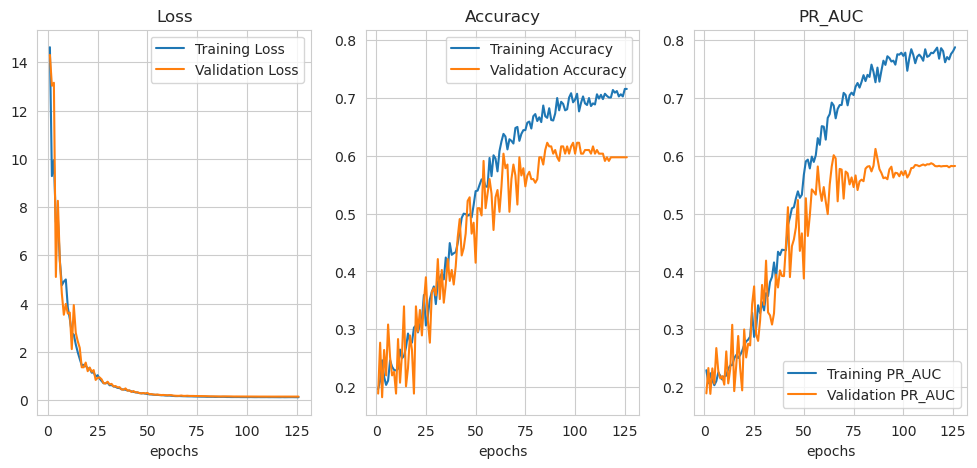

In [ ]:
val_acc_viz(hist, len(hist.history['accuracy']))

### Предсказание модели

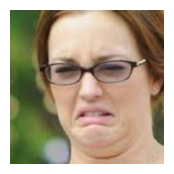

disgust is neutral (30.85%)


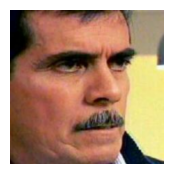

anger is neutral (57.72%)


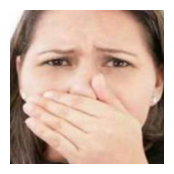

disgust is disgust (60.68%)


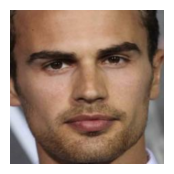

neutral is neutral (82.10%)


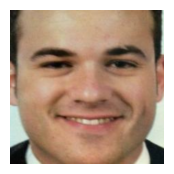

joyfulness is neutral (52.38%)


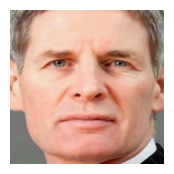

neutral is neutral (70.09%)


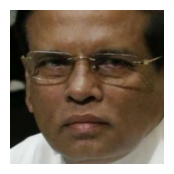

neutral is neutral (72.23%)


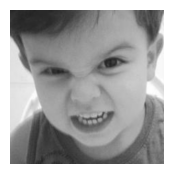

anger is joyfulness (50.97%)


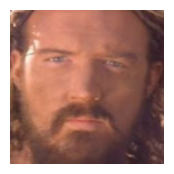

neutral is neutral (60.32%)


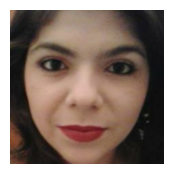

neutral is neutral (66.22%)


In [ ]:
show_predictions(model, test_batches, visualization=True)

### Матрица ошибок

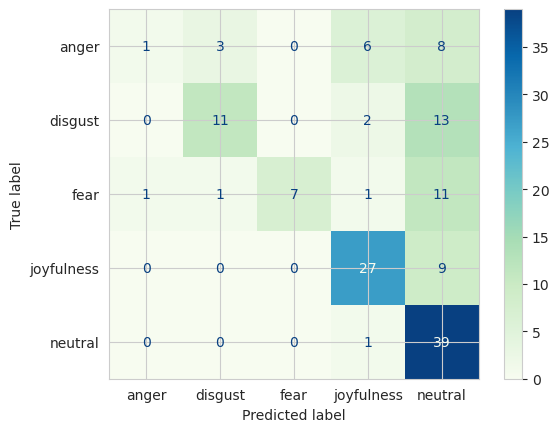

In [ ]:
confusion_matrix(model, test_batches)

### Вывод

In [ ]:
val_acc_best = np.max(hist.history['val_accuracy'])
val_auc_best = np.max(hist.history['val_PR_AUC'])
model_best_results = round(val_acc_best, 2), round(val_auc_best, 2)

print(f'val_accuracy: {model_best_results[0]}')
print(f'val_PR_AUC: {model_best_results[1]}')

val_accuracy: 0.62
val_PR_AUC: 0.61


Как и в прошлой модели, на данном этапе мы не достигли впечатляющих результатов, однако мы создали необходимую базу для дообучения нашего классификатора.

In [ ]:
# сохраним данные о модели
model_222 = model
hist_222 = hist
model_222_best_results = model_best_results

## Разморозка слоев

In [ ]:
do_fine_tuning = True
feature_extractor.trainable = do_fine_tuning

print(f'Разморозка слоев: {do_fine_tuning}.')

Разморозка слоев: True.


На этот раз разморозим все слои.

In [ ]:
# с какого слоя мы размораживаем модель
fine_tune_at = 0

# Заморозим все остальные слои
for layer in feature_extractor.layers[:fine_tune_at+1]:
    layer.trainable = False

Посмотрим на общее количество слоев в предобученной модели, а также на количество переменных, которые будут обучаться в размороженных слоях. 

In [ ]:
print("Number of layers in the feature extractor: ", len(feature_extractor.layers))
print("Trainable variables in the feature extractor: ", len(feature_extractor.trainable_variables))

Number of layers in the feature extractor:  154
Trainable variables in the feature extractor:  156


При желании можно посмотреть на архитектуру `feature_extractor`.

In [ ]:
# feature_extractor.summary()

### Компиляция

Скомпилиуем нашу уже обученную на предыдущем этапе модель, чтобы изменения были применены. Уменьшим базовый lr, чтобы избежать переобучения нашй уже обученной модели. При желании можно изменить оптимизатор и функцию потерь, но в этот раз мы не будем этого делать.

In [ ]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=BASE_LR/100),
              loss='mse',
              metrics=metrics)

### Архитектура модели

In [ ]:
model.summary()

Model: "MobileNetV2_RMSprop_mse"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 299, 299, 3)       0         
                                                                 
 sequential_1 (Sequential)   (None, 299, 299, 3)       0         
                                                                 
 mobilenetv2_1.00_224 (Funct  (None, 10, 10, 1280)     2257984   
 ional)                                                          
                                                                 
 flatten_1 (Flatten)         (None, 128000)            0         
                                                                 
 dropout_1 (Dropout)         (None, 128000)            0         
                                           

In [ ]:
len(model.trainable_variables)

160

### Обучение

In [ ]:
hist = model.fit(train_batches,
                 epochs=EPOCHS,
                 validation_data=validation_batches,
                 callbacks=[early_stopping, lr_schedule])

Epoch 1/500
34/34 [==============================] - 37s 395ms/step - loss: 0.1916 - accuracy: 0.4907 - PR_AUC: 0.5181 - val_loss: 0.2034 - val_accuracy: 0.4906 - val_PR_AUC: 0.4863 - lr: 1.0000e-04
Epoch 2/500
34/34 [==============================] - 12s 344ms/step - loss: 0.1662 - accuracy: 0.5787 - PR_AUC: 0.6067 - val_loss: 0.1762 - val_accuracy: 0.5472 - val_PR_AUC: 0.5322 - lr: 1.0000e-04
Epoch 3/500
34/34 [==============================] - 12s 345ms/step - loss: 0.1559 - accuracy: 0.5926 - PR_AUC: 0.6510 - val_loss: 0.1633 - val_accuracy: 0.6101 - val_PR_AUC: 0.6457 - lr: 1.0000e-04
Epoch 4/500
34/34 [==============================] - 13s 362ms/step - loss: 0.1516 - accuracy: 0.6157 - PR_AUC: 0.6689 - val_loss: 0.1814 - val_accuracy: 0.5220 - val_PR_AUC: 0.5702 - lr: 1.0000e-04
Epoch 5/500
34/34 [==============================] - 12s 342ms/step - loss: 0.1445 - accuracy: 0.6250 - PR_AUC: 0.6827 - val_loss: 0.1991 - val_accuracy: 0.4277 - val_PR_AUC: 0.4977 - lr: 8.5000e-05
Epoch

### Визуализация данных по работе алгоритма

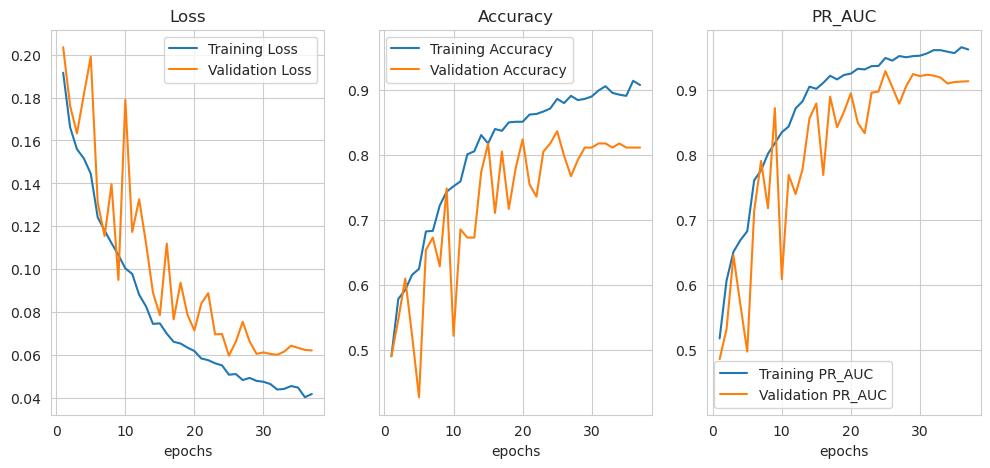

In [ ]:
val_acc_viz(hist, len(hist.history['accuracy']))

В этот раз переобучение наступило гораздо позже, чем у модели 2.2.1, и результат мы получили тоже несколько выше - почти 93%!

### Предсказание модели

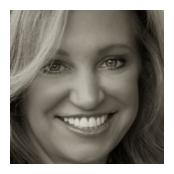

joyfulness is joyfulness (99.48%)


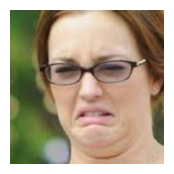

disgust is disgust (98.86%)


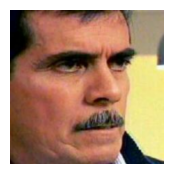

anger is neutral (85.34%)


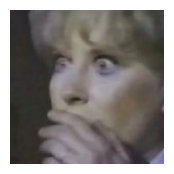

fear is anger (45.89%)


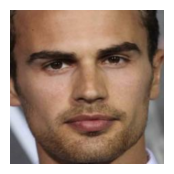

neutral is neutral (99.67%)


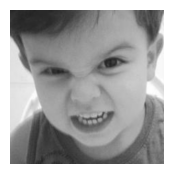

anger is joyfulness (69.54%)


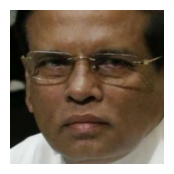

neutral is neutral (88.59%)


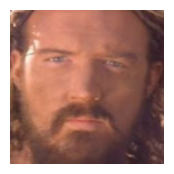

neutral is neutral (79.75%)


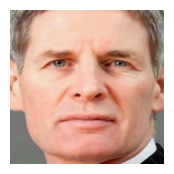

neutral is neutral (92.22%)


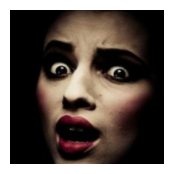

fear is anger (55.22%)


In [ ]:
show_predictions(model, test_batches, visualization=True)

### Матрица ошибок

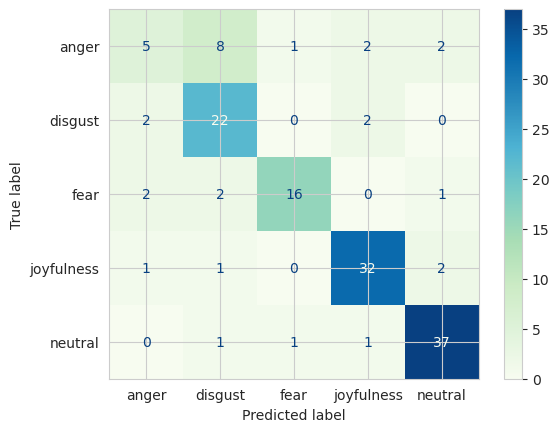

In [ ]:
confusion_matrix(model, test_batches)

Тем не менее, матрица ошибок у данной модели выглядит хуже, чем у предыдущей. Основная трудность заключается в правильном определении гнева и страха - тех классов, которые представлены в нашем датасете наименьшим количеством изображений.

### Вывод

In [ ]:
val_acc_best = np.max(hist.history['val_accuracy'])
val_auc_best = np.max(hist.history['val_PR_AUC'])
model_best_results = round(val_acc_best, 2), round(val_auc_best, 2)

print(f'val_accuracy: {model_best_results[0]}')
print(f'val_PR_AUC: {model_best_results[1]}')

val_accuracy: 0.84
val_PR_AUC: 0.93


В любом случае, данная модель также превзошла цель в 80%.

### Сохранение модели

Сохраним обученную модель на случай, если нам придется ее использовать в дальнейшем.

In [ ]:
EMOTIONS_MOBILENETV2_SAVED_MODEL = "./saved/momobilenetv2_saved_model"
tf.saved_model.save(model, EMOTIONS_MOBILENETV2_SAVED_MODEL)

## Общий вывод по разделу TensorFlow

На обеих предобученных моделях нам удалось достичь высоких результатов обучения, при этом мы построили самый простой классификатор, не используя дополнительных сверточных и полносвязных слоев. Матрицы ошибок показали, что основные проблемы у данных моделей заключаются в определении двух классов - гнев и страх. Именно эти два класса представлены наименьшим количеством изображений, поэтому перед тем, как совершенствовать сами модели, необходимо поработать с исходным датасетом: сбалансировать классы и увеличить общее количество изображений. После этого, оценив результат, имеет смысл начать работать с архитектурой моделей для дальнейшего повышения качества предсказаний.

# <b>2.2.3 Scikit-learn</b>

## <b>Модель 2.2.3.1 | RandomForestClassifier</b>

"Случайный лес" с сокращением размерности признаков и нормализацией данных. 

Для реализации алгоритма случайного леса с сокращением размерности признаков и нормализацией данных мы будем использовать метод SelectFromModel из библиотеки scikit-learn. 

Мы будем использовать некое базовое количество признаков, а с помощью метода SelectFromModel сможем автоматически отобрать оптимальное количество признаков для обучения модели. 

### Сплит датасета

In [ ]:
# Разделим данные на признаки и метки
y = final_df[150528]
X = final_df.drop(columns=[150528])


In [ ]:
# Разобьём данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

### Подготовка модели

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA

In [ ]:
# Создаем объект для случайного леса
rf_classifier = RandomForestClassifier()

In [ ]:
# Описываем пайплайн для автоматической настройки числа признаков
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selection', SelectFromModel(estimator=rf_classifier)),
    ('classification', rf_classifier),
])

In [ ]:
# Определяем диапазон базового количества признаков
min_features = 2
max_features = 1000

In [ ]:
# Определяем параметры для подбора оптимального числа базовых признаков и гиперпараметров деревьев
param_grid = {
    'feature_selection__threshold': ['mean', 'median', '1.25*mean'],
    'classification__n_estimators': [10, 50, 100],
    'classification__max_depth': [10, 20, 30],
}

### Обучение модели

In [ ]:
# Применяем кросс-валидацию для нахождения оптимальных параметров
grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('feature_selection',
                                        SelectFromModel(estimator=RandomForestClassifier())),
                                       ('classification',
                                        RandomForestClassifier())]),
             param_grid={'classification__max_depth': [10, 20, 30],
                         'classification__n_estimators': [10, 50, 100],
                         'feature_selection__threshold': ['mean', 'median',
                                                          '1.25*mean']})

In [ ]:
# Получаем оптимальный классификатор
optimized_rf_classifier = grid_search.best_estimator_

In [ ]:
optimized_rf_classifier

Pipeline(steps=[('scaler', StandardScaler()),
                ('feature_selection',
                 SelectFromModel(estimator=RandomForestClassifier(),
                                 threshold='1.25*mean')),
                ('classification', RandomForestClassifier(max_depth=30))])

### Оценка работы модели

In [ ]:
# Прогнозируем значения на тестовом наборе данных
y_pred = optimized_rf_classifier.predict(X_test)

In [ ]:
y_test

783    3
781    3
605    2
583    2
921    3
      ..
886    3
396    1
936    3
738    3
619    2
Name: 150528, Length: 343, dtype: int8

In [ ]:
y_pred

array([1, 3, 4, 4, 3, 4, 4, 3, 3, 3, 1, 0, 3, 3, 2, 3, 4, 2, 2, 4, 4, 4,
       3, 3, 1, 2, 3, 3, 4, 4, 4, 3, 1, 4, 4, 4, 0, 4, 2, 3, 4, 4, 4, 3,
       4, 3, 3, 4, 4, 1, 4, 4, 2, 3, 4, 1, 3, 1, 4, 3, 4, 4, 3, 4, 4, 4,
       3, 4, 3, 4, 1, 4, 4, 4, 1, 2, 4, 4, 4, 4, 4, 4, 3, 1, 4, 0, 3, 4,
       4, 3, 1, 4, 1, 4, 1, 2, 1, 2, 3, 4, 4, 4, 4, 1, 4, 3, 3, 3, 4, 3,
       4, 3, 4, 2, 4, 3, 1, 4, 1, 4, 1, 3, 4, 3, 3, 3, 1, 4, 3, 3, 4, 3,
       4, 4, 4, 3, 3, 3, 3, 4, 3, 1, 1, 1, 4, 1, 3, 1, 4, 3, 4, 4, 3, 4,
       1, 4, 4, 4, 1, 3, 1, 3, 3, 1, 4, 2, 1, 4, 4, 3, 1, 4, 4, 3, 1, 2,
       1, 3, 3, 3, 1, 4, 3, 3, 1, 4, 3, 4, 3, 2, 4, 1, 4, 2, 4, 1, 1, 4,
       4, 4, 3, 3, 3, 4, 3, 4, 4, 4, 4, 1, 4, 3, 3, 4, 4, 4, 3, 1, 4, 1,
       4, 2, 3, 3, 4, 4, 4, 4, 1, 4, 1, 4, 4, 1, 3, 0, 4, 4, 3, 0, 4, 4,
       3, 4, 3, 3, 3, 3, 4, 1, 3, 4, 4, 3, 2, 1, 3, 4, 4, 4, 4, 2, 4, 4,
       3, 1, 1, 3, 4, 4, 1, 4, 3, 3, 4, 3, 4, 1, 4, 3, 3, 2, 0, 4, 4, 4,
       3, 4, 4, 4, 3, 3, 4, 4, 3, 1, 2, 4, 2, 2, 0,

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Посчитаем точность модели
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Вычисление точности, полноты и F1-меры с усреднением по классам (macro)
prec = precision_score(y_test, y_pred, average='macro')
rec = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print("Precision (macro):", prec)
print("Recall (macro):", rec)
print("F1-score (macro):", f1)


# Вычисление точности, полноты и F1-меры с усреднением по классам (macro)
prec = precision_score(y_test, y_pred, average='micro')
rec = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')
print('____________________________')
print("Precision (micro):", prec)
print("Recall (micro):", rec)
print("F1-score (micro):", f1)


# Вычисление точности, полноты и F1-меры 
prec = precision_score(y_test, y_pred, average=None)
rec = recall_score(y_test, y_pred, average=None)
f1 = f1_score(y_test, y_pred, average=None)
print('____________________________')
print("Precision (None):", prec)
print("Recall (None):", rec)
print("F1-score (None):", f1)

Accuracy: 0.5131195335276968
Precision (macro): 0.5175410303981731
Recall (macro): 0.43463177171042344
F1-score (macro): 0.43779029300233124
____________________________
Precision (micro): 0.5131195335276968
Recall (micro): 0.5131195335276968
F1-score (micro): 0.5131195335276968
____________________________
Precision (None): [0.5        0.58181818 0.46153846 0.60204082 0.44230769]
Recall (None): [0.10810811 0.43243243 0.27272727 0.66292135 0.6969697 ]
F1-score (None): [0.17777778 0.49612403 0.34285714 0.63101604 0.54117647]


### Продолжение эксперимента

Попробуем увеличить диапазон признаков, а также максимальную глубину леса

In [ ]:
# Определяем диапазон базового количества признаков
min_features = 2
max_features = 5000

In [ ]:
# Определяем параметры для подбора оптимального числа базовых признаков и гиперпараметров деревьев
param_grid = {
    'feature_selection__threshold': ['mean', 'median', '1.25*mean'],
    'classification__n_estimators': [10, 500, 1000],
    'classification__max_depth': [10, 50, 100],
}

In [ ]:
# Применяем кросс-валидацию для нахождения оптимальных параметров
grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('feature_selection',
                                        SelectFromModel(estimator=RandomForestClassifier())),
                                       ('classification',
                                        RandomForestClassifier())]),
             param_grid={'classification__max_depth': [10, 50, 100],
                         'classification__n_estimators': [10, 500, 1000],
                         'feature_selection__threshold': ['mean', 'median',
                                                          '1.25*mean']})

In [ ]:
# Получаем оптимальный классификатор
optimized_rf_classifier = grid_search.best_estimator_

In [ ]:
optimized_rf_classifier

Pipeline(steps=[('scaler', StandardScaler()),
                ('feature_selection',
                 SelectFromModel(estimator=RandomForestClassifier(),
                                 threshold='median')),
                ('classification',
                 RandomForestClassifier(max_depth=50, n_estimators=1000))])

### Оценка работы модели

In [ ]:
# Прогнозируем значения на тестовом наборе данных
y_pred = optimized_rf_classifier.predict(X_test)

In [ ]:
# Посчитаем точность модели
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Вычисление точности, полноты и F1-меры с усреднением по классам (macro)
prec = precision_score(y_test, y_pred, average='macro')
rec = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print("Precision (macro):", prec)
print("Recall (macro):", rec)
print("F1-score (macro):", f1)


# Вычисление точности, полноты и F1-меры с усреднением по классам (macro)
prec = precision_score(y_test, y_pred, average='micro')
rec = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')
print('____________________________')
print("Precision (micro):", prec)
print("Recall (micro):", rec)
print("F1-score (micro):", f1)


# Вычисление точности, полноты и F1-меры 
prec = precision_score(y_test, y_pred, average=None)
rec = recall_score(y_test, y_pred, average=None)
f1 = f1_score(y_test, y_pred, average=None)
print('____________________________')
print("Precision (None):", prec)
print("Recall (None):", rec)
print("F1-score (None):", f1)

Accuracy: 0.5131195335276968
Precision (macro): 0.5731619562559146
Recall (macro): 0.4257658577883297
F1-score (macro): 0.42452619520777335
____________________________
Precision (micro): 0.5131195335276968
Recall (micro): 0.5131195335276968
F1-score (micro): 0.5131195335276968
____________________________
Precision (None): [0.75       0.60416667 0.47826087 0.58510638 0.44827586]
Recall (None): [0.08108108 0.39189189 0.25       0.61797753 0.78787879]
F1-score (None): [0.14634146 0.47540984 0.32835821 0.6010929  0.57142857]


## <b>Модель 2.2.3.2 | Модель Маркова</b>

Модель Маркова с сокращением размерности признаков и нормализацией данных, а также автоматическим подбором n_components для PCA.

In [ ]:
!pip install hmmlearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.2/217.2 KB 7.5 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from hmmlearn import hmm

### Обучение модели

In [ ]:
# Разобьём данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

In [ ]:
# Применим нормализацию для каждого признака:

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Автоматически подберем количество компонент для PCA:

pca = PCA().fit(X_train_scaled)
n_components = np.argmax(np.cumsum(pca.explained_variance_ratio_) > 0.95) + 1

In [ ]:
#Сократим размерность признаков с помощью PCA:

pca = PCA(n_components=n_components)
X_train_reduced = pca.fit_transform(X_train_scaled)
X_test_reduced = pca.transform(X_test_scaled)

In [ ]:
#Автоматически подберем количество компонент для модели маркова:

#n_components = np.arange(1, 15)
n_components = 10
models = hmm.GaussianHMM(n_components=n_components, covariance_type='full', n_iter=1000)

#bic_scores = [model.fit(X_train_reduced).bic(X_train_reduced) for model in models]
#best_n_components = n_components[np.argmin(bic_scores)]

In [ ]:
#Создадим модель Маркова и обучим ее на тренировочной выборке:

model = hmm.GaussianHMM(n_components=n_components)
model.fit(X_train_reduced)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


GaussianHMM(n_components=10)

### Оценка работы модели

In [ ]:
# Прогнозируем значения на тестовом наборе данных
y_pred = model.predict(X_test_reduced)

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Посчитаем точность модели
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Вычисление точности, полноты и F1-меры с усреднением по классам (macro)
prec = precision_score(y_test, y_pred, average='macro')
rec = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print("Precision (macro):", prec)
print("Recall (macro):", rec)
print("F1-score (macro):", f1)


# Вычисление точности, полноты и F1-меры с усреднением по классам (macro)
prec = precision_score(y_test, y_pred, average='micro')
rec = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')
print('____________________________')
print("Precision (micro):", prec)
print("Recall (micro):", rec)
print("F1-score (micro):", f1)


# Вычисление точности, полноты и F1-меры 
prec = precision_score(y_test, y_pred, average=None)
rec = recall_score(y_test, y_pred, average=None)
f1 = f1_score(y_test, y_pred, average=None)
print('____________________________')
print("Precision (None):", prec)
print("Recall (None):", rec)
print("F1-score (None):", f1)

Accuracy: 0.1836734693877551
Precision (macro): 0.023230088495575223
Recall (macro): 0.11931818181818182
F1-score (macro): 0.03888888888888889
____________________________
Precision (micro): 0.1836734693877551
Recall (micro): 0.1836734693877551
F1-score (micro): 0.18367346938775508
____________________________
Precision (None): [0.         0.18584071 0.         0.         0.         0.
 0.         0.        ]
Recall (None): [0.         0.95454545 0.         0.         0.         0.
 0.         0.        ]
F1-score (None): [0.         0.31111111 0.         0.         0.         0.
 0.         0.        ]


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is 

In [ ]:
#еще один способ расчета Accuracy на тестовой выборке:

preds = model.predict(X_test_reduced)
accuracy = np.mean(preds == y_test)
print('Accuracy:', accuracy)

Accuracy: 0.1836734693877551


### Продолжение эксперимента

Увеличим количество компонент в алгоритме Маркова

In [ ]:
#n_components = np.arange(1, 15)
n_components = 5
#bic_scores = [model.fit(X_train_reduced).bic(X_train_reduced) for model in models]
#best_n_components = n_components[np.argmin(bic_scores)]

In [ ]:
model = hmm.GaussianHMM(n_components=n_components)
model.fit(X_train_reduced)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


GaussianHMM(n_components=5)

### Оценка работы модели

In [ ]:
# Прогнозируем значения на тестовом наборе данных
y_pred = model.predict(X_test_reduced)

In [ ]:
# Посчитаем точность модели
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Вычисление точности, полноты и F1-меры с усреднением по классам (macro)
prec = precision_score(y_test, y_pred, average='macro')
rec = recall_score(y_test, y_pred, average='macro')
f1 = f1_score(y_test, y_pred, average='macro')

print("Precision (macro):", prec)
print("Recall (macro):", rec)
print("F1-score (macro):", f1)


# Вычисление точности, полноты и F1-меры с усреднением по классам (macro)
prec = precision_score(y_test, y_pred, average='micro')
rec = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')
print('____________________________')
print("Precision (micro):", prec)
print("Recall (micro):", rec)
print("F1-score (micro):", f1)


# Вычисление точности, полноты и F1-меры 
prec = precision_score(y_test, y_pred, average=None)
rec = recall_score(y_test, y_pred, average=None)
f1 = f1_score(y_test, y_pred, average=None)
print('____________________________')
print("Precision (None):", prec)
print("Recall (None):", rec)
print("F1-score (None):", f1)

Accuracy: 0.22448979591836735
Precision (macro): 0.14470588235294118
Recall (macro): 0.2026666666666667
F1-score (macro): 0.07827172827172826
____________________________
Precision (micro): 0.22448979591836735
Recall (micro): 0.22448979591836735
F1-score (micro): 0.22448979591836735
____________________________
Precision (None): [0.         0.5        0.         0.22352941 0.        ]
Recall (None): [0.         0.01333333 0.         1.         0.        ]
F1-score (None): [0.         0.02597403 0.         0.36538462 0.        ]


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# <b>Использованные источники и литература</b>

## Общее

1. Convolutional neural network // https://duchesnay.github.io/pystatsml/deep_learning/dl_cnn_cifar10_pytorch.html
1. Lakhani N.D. Statistical Evaluation Metrics // https://iust-projects.ir/post/minidm01/
1. AI, практический курс. Базовая модель распознавания эмоций на изображениях // https://habr.com/ru/company/intel/blog/420635/
1. CS231n: Свёрточные нейронные сети для распознавания образов // https://habr.com/ru/post/456186/
1. Правильная настройка случайного начального значения в экспериментах ML // https://odsc.medium.com/properly-setting-the-random-seed-in-ml-experiments-not-as-simple-as-you-might-imagine-219969c84752
1. Как рассчитать оценку f1 // https://stackoverflow.com/questions/67959327/how-to-calculate-the-f1-score

## Модели

1. SOURCE CODE FOR TORCHVISION.MODELS.EFFICIENTNET // [https://pytorch.org/vision/master/\_modules/torchvision/models/efficientnet.html](https://pytorch.org/vision/master/_modules/torchvision/models/efficientnet.html)
1. RESNET50 документация модели // https://pytorch.org/vision/stable/models/generated/torchvision.models.resnet50.html#torchvision.models.resnet50
1. InceptionV3 // https://keras.io/api/applications/inceptionv3/
1. MobileNet // https://keras.io/api/applications/mobilenet/
1. Внедрение EfficientNet в PyTorch, часть 2: решение // https://questu.ru/articles/155907/

## Pytorch

1. TorchEval документация // https://github.com/pytorch/torcheval
1. Передача обучения с использованием EfficientNet PyTorch // https://debuggercafe.com/transfer-learning-using-efficientnet-pytorch/
1. Документация STEPLR // https://pytorch.org/docs/stable/generated/torch.optim.lr_scheduler.StepLR.html#torch.optim.lr_scheduler.StepLR
1. ОБУЧЕНИЕ КЛАССИФИКАТОРА // https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html#training-an-image-classifier
1. ПЕРЕДАЧА ОБУЧЕНИЯ ДЛЯ КОМПЬЮТЕРНОГО ЗРЕНИЯ УЧЕБНОЕ ПОСОБИЕ // https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html
1. multiclass_f1_score документация // https://pytorch.org/torcheval/stable/generated/torcheval.metrics.functional.multiclass_f1_score.html#torcheval.metrics.functional.multiclass_f1_score
1. Классификация изображений с помощью PyTorch // https://medium.com/@nutanbhogendrasharma/image-classification-with-pytorch-351a0a6cc09d
1. Facial Expression Recognition using Pytorch // https://www.kaggle.com/code/veb101/facial-expression-recognition-using-pytorch
1. Как обучать свои собственные модели с помощью timm // https://timm.fast.ai/training
1. Классификация изображений с использованием логистической регрессии в PyTorch // https://digitrain.ru/articles/369516/
1. PyTorch  — многоклассовая классификация // https://towardsdatascience.com/pytorch-tabular-multiclass-classification-9f8211a123ab
1. Измерение оценки F1 для многоклассовой классификации в PyTorch // https://stackoverflow.com/questions/62265351/measuring-f1-score-for-multiclass-classification-natively-in-pytorch
1. Матрица и точность тестирования для учебного пособия по передаче обучения PyTorch // https://stackoverflow.com/questions/53290306/confusion-matrix-and-test-accuracy-for-pytorch-transfer-learning-tutorial
1. Как использовать GradScaler в PyTorch // https://wandb.ai/wandb_fc/tips/reports/How-To-Use-GradScaler-in-PyTorch--VmlldzoyMTY5MDA5

## Ignite

1. https://pytorch-ignite.ai/tutorials/beginner/01-getting-started/- краткое руководство по запуску PyTorch-Ignite.

1. https://uproger.com/￼-instrukcziya-po-rabote-s-bibliotekoj-pytorch-ignite￼/ - Инструкция по Работе с Библиотекой PyTorch-Ignite.

1. https://habr.com/ru/company/ods/blog/424781/ - Обучение и тестирование нейронных сетей на PyTorch с помощью Ignite.

1. https://pytorch.org/ignite/metrics.html - метрики PyTorch-Ignite.

## Tensorflow

**Курсы**
1. Holbrook R. Intro to Deep Learning // https://www.kaggle.com/learn/intro-to-deep-learning
1. Moroney L. Device-based Models with TensorFlow Lite // https://www.coursera.org/learn/device-based-models-tensorflow
1. Tensorflow Guide. TensorFlow Basics // https://www.tensorflow.org/guide

**Статьи**
1. Data augmentation // https://www.tensorflow.org/tutorials/images/data_augmentation
1. Image classification // https://www.tensorflow.org/tutorials/images/classification
1. Load and preprocess images // https://www.tensorflow.org/tutorials/load_data/images
1. Preprocessing layers // https://keras.io/api/layers/preprocessing_layers/
1. Transfer learning and fine-tuning // https://www.tensorflow.org/tutorials/images/transfer_learning
1. Transfer learning and fine-tuning // https://keras.io/guides/transfer_learning/
1. Working with preprocessing layers // https://www.tensorflow.org/guide/keras/preprocessing_layers

## Форумы
1. StackOverflow // https://stackoverflow.com/
1. GitHub // https://github.com/